# Import

In [1]:
import numpy as np
import pandas as pd
from pandas.plotting import parallel_coordinates
import matplotlib.pyplot as plt
import seaborn as sns
import random
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from mlxtend.plotting import plot_decision_regions
from typing import List, Tuple, Optional, Union,Literal

# Read Data 

In [4]:
df = pd.read_csv(r'bank.csv')
df.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
0,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes
1,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes
2,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes
3,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes
4,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes


# Line_plot 

### Matplot

In [5]:
def plot_line(x, y, 
            num_of_line: int = 1, title: str = 'Line Plot', 
            xlabel: str = None, ylabel: str = None, x_rotation=0,
            palette: str = 'magma',palette2: str = 'viridis',color=None, linewidths: float = 1.5, 
            figsize: tuple = (10, 7), subplot=False, ax=None):
    """
    Plots a line chart using Matplotlib and Seaborn.

    Parameters:
    --------
    x (list or list of lists): The data to be used for the x-axis.
    y (list or list of lists): The data to be used for the y-axis.
    num_of_line (int): Number of lines to plot. Default is 1.
    title (str): The title of the plot. Default is 'Line Plot'.
    xlabel (str): The label for the x-axis. Default is None.
    ylabel (str): The label for the y-axis. Default is None.
    palette (str): The color palette to use for the lines. Default is 'magma'.
    linewidths (float): The width of the lines. Default is 1.5.
    figsize (tuple): Size of the figure. Default is (10, 7).
    subplot (bool): Flag to indicate if this is a subplot. Default is False.
    ax (matplotlib.axes._subplots.AxesSubplot): The axis to plot on. Default is None.
    
    Example:
    --------
    plot_line([x23], [y23,y24], num_of_line=2, title="Subplot Test")

    Returns:
    None
    """
    # Ensure x and y are lists of lists
    if not isinstance(x[0], list):
        x = [x]
    if not isinstance(y[0], list):
        y = [y]
    
    # Adjust the length of x and y to match num_of_line
    x_length = len(x)
    y_length = len(y)
    if x_length > y_length:
        y = y * x_length
    if x_length < y_length:
        x = x * y_length
    
    # get the color for each plot
    if color is None:
        if num_of_line <= 6 :
            colors = random.sample(sns.color_palette(palette), num_of_line)
        elif num_of_line <= 12 :
            colors = random.sample(sns.color_palette(palette) + sns.color_palette(palette2), num_of_line)
        elif num_of_line > 12 :
            colors = random.choices(sns.color_palette(palette) + sns.color_palette(palette2), k=num_of_line)
    else:
        colors = [color] * num_of_line
    
    
    # Generate random styles
    linestyles = random.sample(['-', '--', '-.', ':', None], num_of_line)
    markers = random.sample(['o', 'X', 's', '*', '+'], num_of_line)
    
    # Set default x and y labels if not provided
    if xlabel is None:
        xlabel = 'X-axis'
    if ylabel is None:
        ylabel = 'Y-axis'
    
    # Plotting
    if subplot and ax is not None:
        for i in range(num_of_line):
            ax.plot(x[i], y[i], color=colors[i], linestyle=linestyles[i], linewidth=linewidths, marker=markers[i])
        ax.set_title(title)
        ax.set_xlabel(xlabel, fontsize=12)
        ax.set_ylabel(ylabel, fontsize=12)
        ax.legend([f'Line {i+1}' for i in range(num_of_line)], loc='best')
        ax.grid(True, linestyle='--', linewidth=0.8, alpha=0.5)
    else:
        plt.figure(figsize=figsize)
        for i in range(num_of_line):
            plt.plot(x[i], y[i], color=colors[i], linestyle=linestyles[i], linewidth=linewidths, marker=markers[i])
        plt.title(title)
        plt.xlabel(xlabel, fontsize=12)
        plt.ylabel(ylabel, fontsize=12)
        plt.xticks(rotation=x_rotation)
        plt.legend([f'Line {i+1}' for i in range(num_of_line)], loc='best')
        plt.grid(True, linestyle='--', linewidth=0.8, alpha=0.5)
        plt.show()



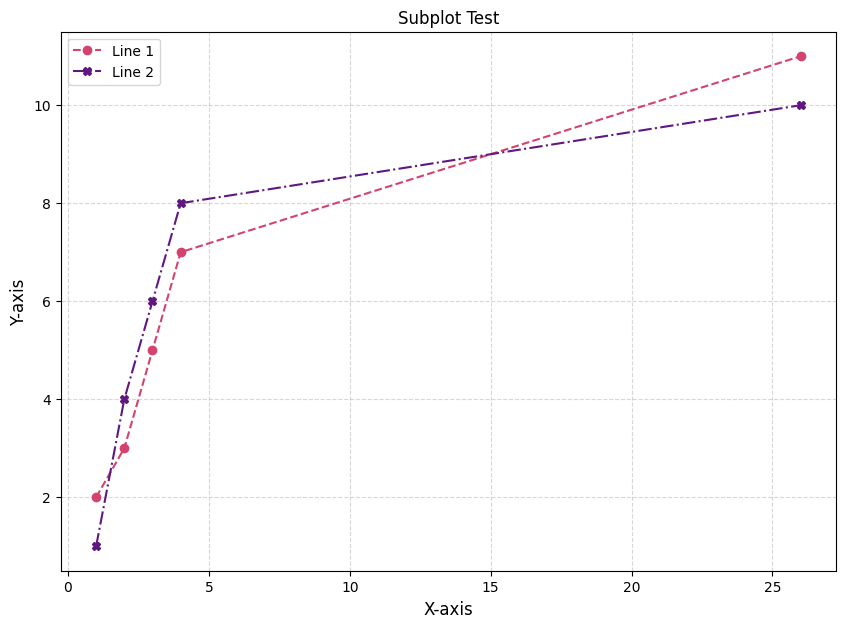

In [6]:
x23 = [1, 2, 3, 4, 26]
y23 = [2, 3, 5, 7, 11]
y24 = [1, 4, 6, 8, 10]
plot_line([x23], [y23,y24], num_of_line=2, title="Subplot Test")

In [7]:
def plot_line_matplotlib(x, y, data: pd.DataFrame, 
                        num_of_line: int = 1, title: str = 'Line Plot', 
                        xlabel: str = None, ylabel: str = None, x_rotation=0,
                        palette: str = 'magma',palette2: str = 'viridis', color = None, 
                        linewidths: float = 1.5, figsize: tuple=(10, 7), subplot=False, ax=None):
    """
    Plots a line chart using Matplotlib and Seaborn.
    
    Parameters:
    --------
    x (str or list of str): The column name(s) to be used for the x-axis.
    y (str or list of str): The column name(s) to be used for the y-axis.
    data (pd.DataFrame): The DataFrame containing the data to plot.
    num_of_line (int): Number of lines to plot. Default is 1.
    title (str): The title of the plot. Default is 'Line Plot'.
    xlabel (str): The label for the x-axis. Default is None.
    ylabel (str): The label for the y-axis. Default is None.
    palette (str): The color palette to use for the lines. Default is 'magma'.
    linewidths (float): The width of the lines. Default is 1.5.
    figsize (tuple): Size of the figure. Default is (10, 7).
    subplot (bool): Flag to indicate if this is a subplot. Default is False.
    ax (matplotlib.axes._subplots.AxesSubplot): The axis to plot on. Default is None.
    
    Example:
    --------
    plot_line_matplotlib(x='time',y=['velocity_obj_1','velocity_obj_2'],data=df_vel,num_of_line = 2)
    
    Returns:
    None
    """
    # Ensure x and y are lists
    if not isinstance(x, list):
        x = [x]
    if not isinstance(y, list):
        y = [y]
    
    # Adjust the length of x and y to match num_of_line
    x_length = len(x)
    y_length = len(y)
    if x_length > y_length:
        y = y * x_length
    if x_length < y_length:
        x = x * y_length
    
    # get the color for each plot
    if color is None:
        if num_of_line <= 6 :
            colors = random.sample(sns.color_palette(palette), num_of_line)
        elif num_of_line <= 12 :
            colors = random.sample(sns.color_palette(palette) + sns.color_palette(palette2), num_of_line)
        elif num_of_line > 12 :
            colors = random.choices(sns.color_palette(palette) + sns.color_palette(palette2), k=num_of_line)
    else:
        colors = [color] * num_of_line
    
    # Generate random styles
    linestyles = random.sample(['-', '--', '-.', ':', None], num_of_line)
    markers = random.sample(['o', 'X', 's', '*', '+'], num_of_line)
    
    # Set default x and y labels if not provided
    if xlabel is None:
        xlabel = x[0]
    if ylabel is None:
        ylabel = y[0]
    
    # Plotting
    if subplot and ax is not None:
        for i in range(num_of_line):
            ax.plot(x[i], y[i], color=colors[i], linestyle=linestyles[i], linewidth=linewidths, marker=markers[i],data=data)
        ax.set_title(title)
        ax.set_xlabel(xlabel, fontsize=12)
        ax.set_ylabel(ylabel, fontsize=12)
        ax.legend(title=title, loc='best')
        ax.grid(True, linestyle='--', linewidth=0.8, alpha=0.5)
    else:
        plt.figure(figsize=figsize)
        for i in range(num_of_line):
            plt.plot(x[i], y[i], color=colors[i], linestyle=linestyles[i], linewidth=linewidths, marker=markers[i],data=data)
        plt.title(title)
        plt.xlabel(xlabel, fontsize=12)
        plt.ylabel(ylabel, fontsize=12)
        plt.xticks(rotation=x_rotation)
        plt.legend(title=title, loc='best')
        plt.grid(True, linestyle='--', linewidth=0.8, alpha=0.5)
        plt.show()



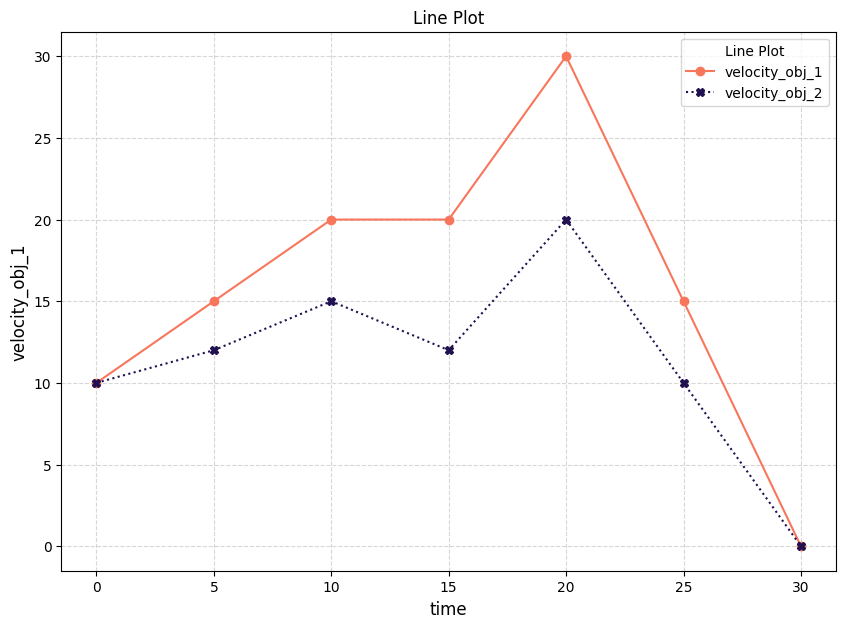

In [8]:
df_vel = pd.DataFrame({
            'time':[0 ,5,10,15,20,25,30],
            'velocity_obj_1':[10,15,20,20,30,15,0],
            'velocity_obj_2':[10,12,15,12,20,10,0]
})
plot_line_matplotlib(x='time',y=['velocity_obj_1','velocity_obj_2'],data=df_vel,num_of_line = 2)

In [9]:
def plot_line_all_column(categorical_features,df):
    for nf in categorical_features:
        freq = df[nf].value_counts().sort_index()
        plot_line(x=freq.index,y=freq.values,title=f'Frequency Polygon of {nf}',xlabel=nf,ylabel='Frequency',x_rotation=45,figsize=(8, 6))



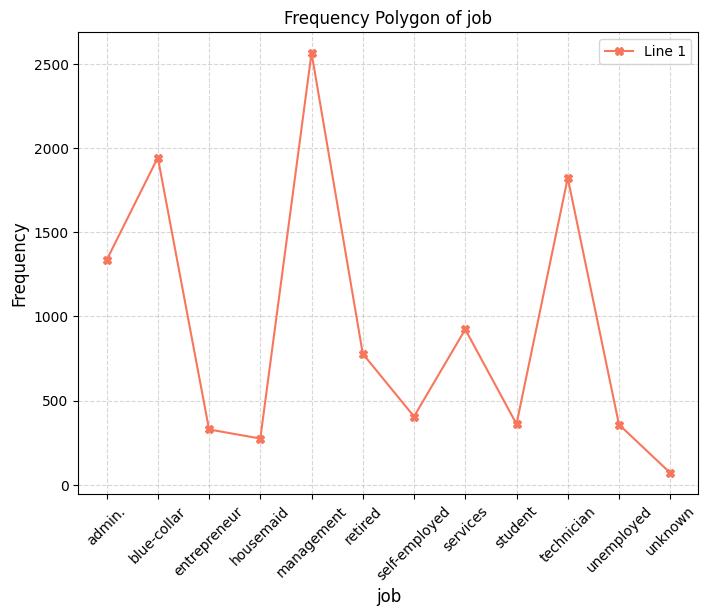

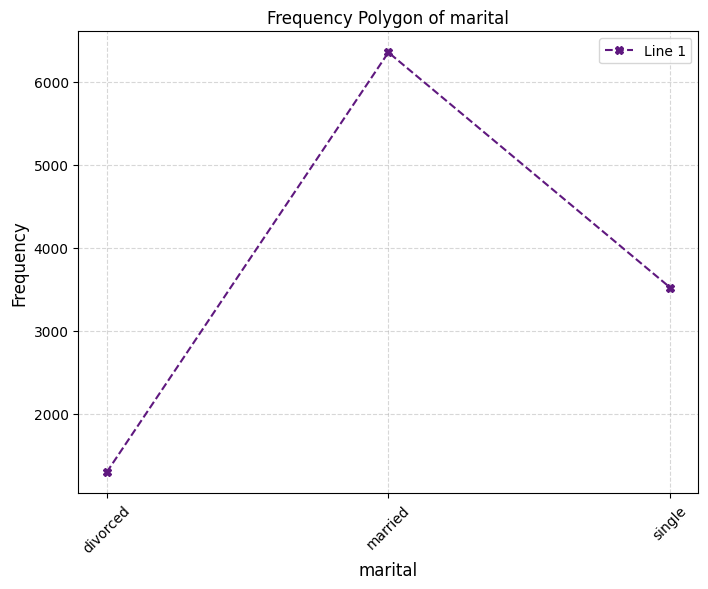

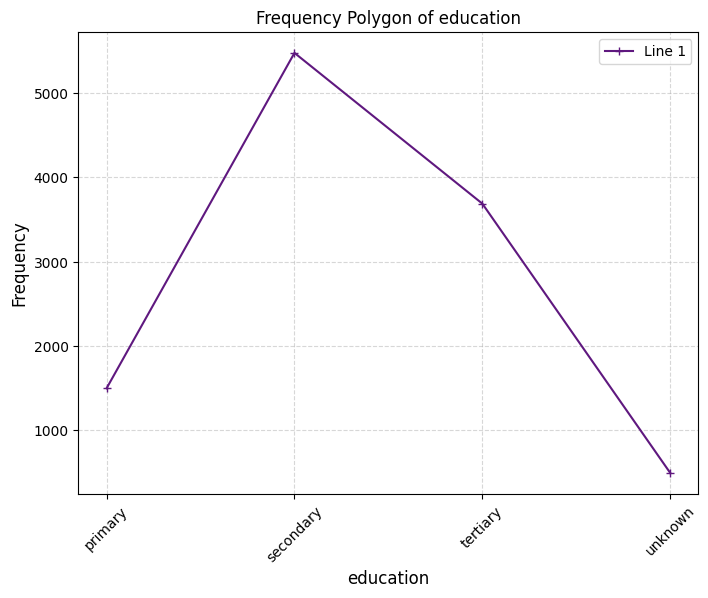

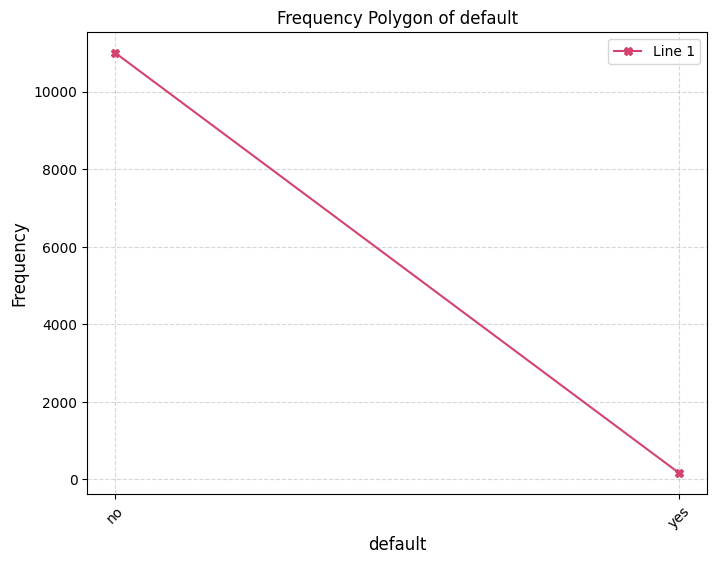

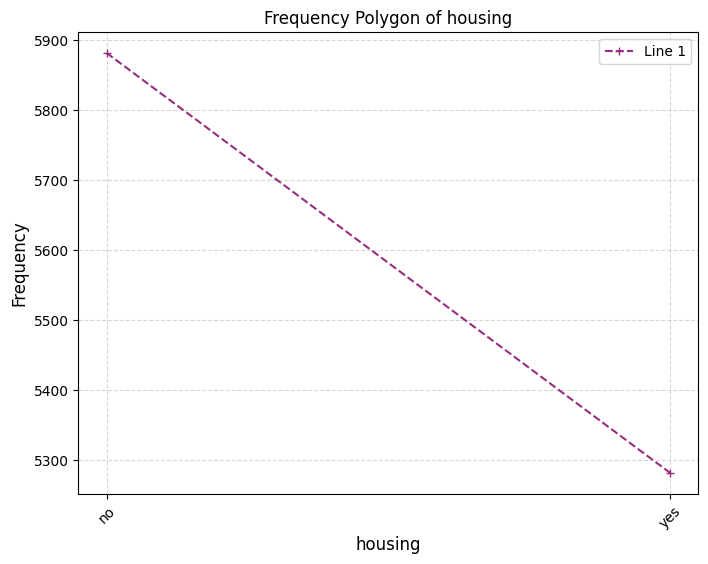

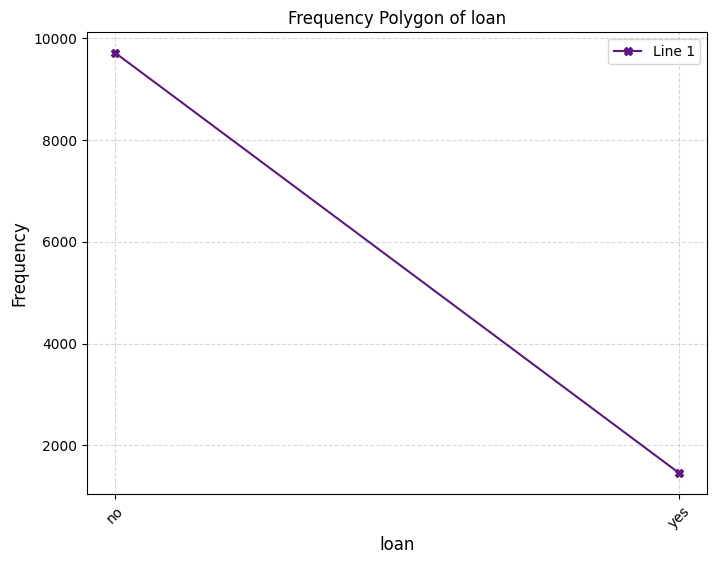

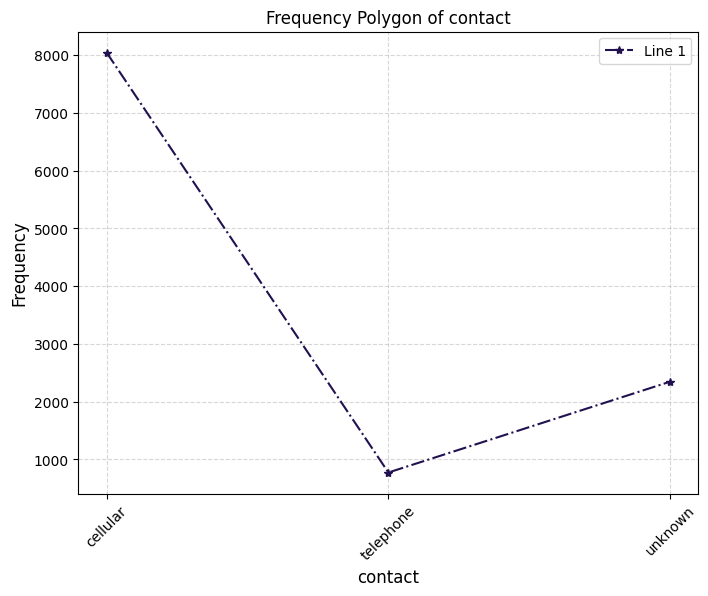

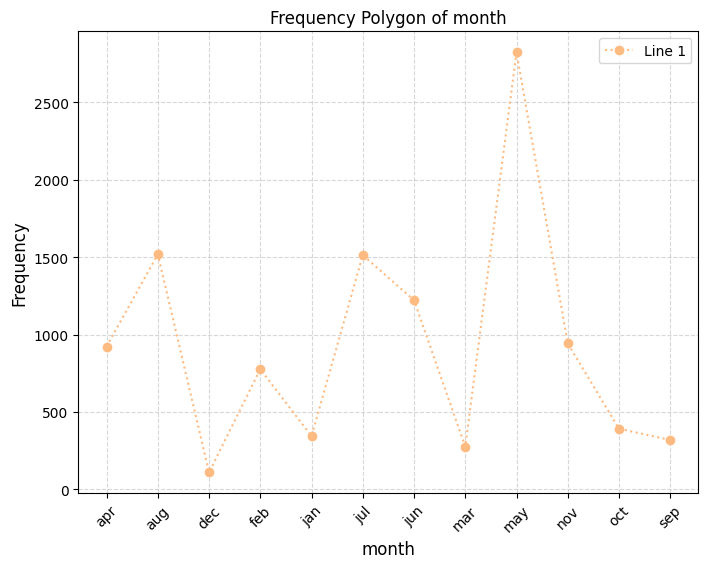

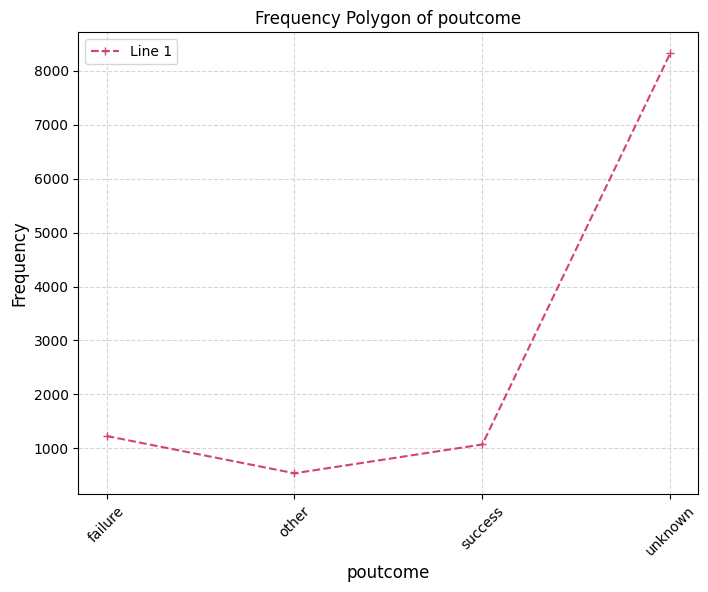

In [10]:
df=pd.read_csv("bank.csv")
numerical_features=df.select_dtypes(include='number')
categorical_features=['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']
plot_line_all_column(categorical_features,df)

## seaborn

In [11]:
def plot_line_seaborn(x, y, data: pd.DataFrame, num_of_line: int = 1,
                    hue: str = None, size: str = None, style: str = None, units: str = None,
                    title: str = 'Line Plot', xlabel: str = None, ylabel: str = None,
                    palette: str = 'magma',palette2: str = 'viridis',color=None, linewidths: float = 2.5, figsize: tuple = (10, 7), subplot=False, ax=None):
    """
    Plots a line chart using Matplotlib and Seaborn.

    Parameters:
    --------
    x (str or list of str): The column name(s) to be used for the x-axis.
    y (str or list of str): The column name(s) to be used for the y-axis.
    data (pd.DataFrame): The DataFrame containing the data to plot.
    num_of_line (int): Number of lines to plot. Default is 1.
    title (str): The title of the plot. Default is 'Line Plot'.
    xlabel (str): The label for the x-axis. Default is None.
    ylabel (str): The label for the y-axis. Default is None.
    palette (str): The color palette to use for the lines. Default is 'magma'.
    linewidths (float): The width of the lines. Default is 2.5.
    hue (str): Variable that will produce lines with different colors. Default is None.
    size (str): Variable that will produce lines with different widths. Default is None.
    style (str): Variable that will produce lines with different styles. Default is None.
    units (str): Variable that will determine the unit to use for different line plots. Default is None.
    figsize (tuple): Size of the figure. Default is (10, 7).
    subplot (bool): Flag to indicate if this is a subplot. Default is False.
    ax (matplotlib.axes._subplots.AxesSubplot): The axis to plot on. Default is None.

    Examples:
    --------
    1- plot_line_seaborn(x='time',y=['velocity_obj_1','velocity_obj_2'], data = df_vel, num_of_line=2,palette='viridis')
    2- plot_line_seaborn(x = 'x', y = 'y', hue='category', data = df_category)
    
    Returns:
    None
    """
    if not subplot or ax is None:
        plt.figure(figsize=figsize)
    
    if not isinstance(x, list):
        x = [x]
    if not isinstance(y, list):
        y = [y]
    
    x_length = len(x)
    y_length = len(y)
    if x_length > y_length:
        y = y * x_length
    if x_length < y_length:
        x = x * y_length
    
    # get the color for each plot
    if color is None:
        if num_of_line <= 6 :
            colors = random.sample(sns.color_palette(palette), num_of_line)
        elif num_of_line <= 12 :
            colors = random.sample(sns.color_palette(palette) + sns.color_palette(palette2), num_of_line)
        elif num_of_line > 12 :
            colors = random.choices(sns.color_palette(palette) + sns.color_palette(palette2), k=num_of_line)
    else:
        colors = [color] * num_of_line
    
    linestyles = random.sample(['dotted', 'dashed', '-.', ':', None], num_of_line)
    markers = random.sample(['o', 'X', 's', 'p', 'X'], num_of_line)
    
    if xlabel is None:
        xlabel = x[0]
    if ylabel is None:
        ylabel = y[0]
    
    if hue is None:
        for i in range(num_of_line):
            sns.lineplot(data=data, x=x[i], y=y[i], hue=hue, size=size, style=style, units=units, linestyle=linestyles[i], 
                        color=colors[i], linewidth=linewidths, marker=markers[i], label=y[i], markersize=9, dashes=True, ax=ax)
        if ax is None:
            plt.legend(title=title, loc='best')
        else:
            ax.legend(title=title, loc='best')
    elif style is None or size is None:
        style = hue
        size = hue
        units = hue
        x = x[0]
        y = y[0]
        sns.lineplot(data=data, x=x, y=y, hue=hue, size=size, style=style, units=units, 
                    palette=palette, linewidth=linewidths, marker='X', markersize=9, dashes=True, ax=ax)
    else:
        x = x[0]
        y = y[0]
        sns.lineplot(data=data, x=x, y=y, hue=hue, size=size, style=style, units=units, 
                    palette=palette, linewidth=linewidths, marker='X', markersize=9, dashes=True, ax=ax)
    
    if ax is None:
        plt.title(title)
        plt.xlabel(xlabel, fontsize=12)
        plt.ylabel(ylabel, fontsize=12)
        plt.grid(True, linestyle='--', linewidth=0.8, alpha=0.5)
        plt.show()
    else:
        ax.set_title(title)
        ax.set_xlabel(xlabel, fontsize=12)
        ax.set_ylabel(ylabel, fontsize=12)
        ax.grid(True, linestyle='--', linewidth=0.8, alpha=0.5)



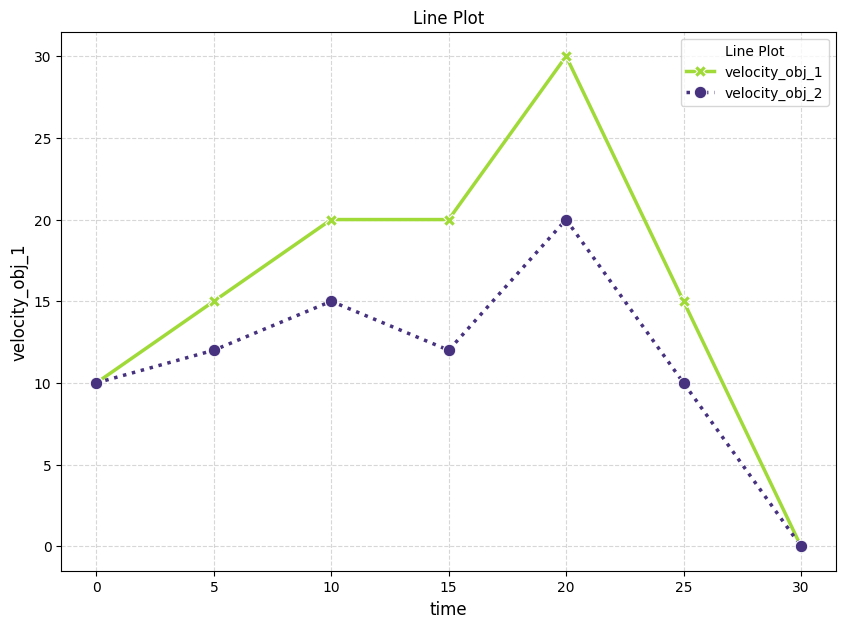

In [12]:
df_vel = pd.DataFrame({'time':[0 ,5,10,15,20,25,30],
                    'velocity_obj_1':[10,15,20,20,30,15,0],
                    'velocity_obj_2':[10,12,15,12,20,10,0]})
plot_line_seaborn(x='time',y=['velocity_obj_1','velocity_obj_2'], data = df_vel, num_of_line=2,palette='viridis')

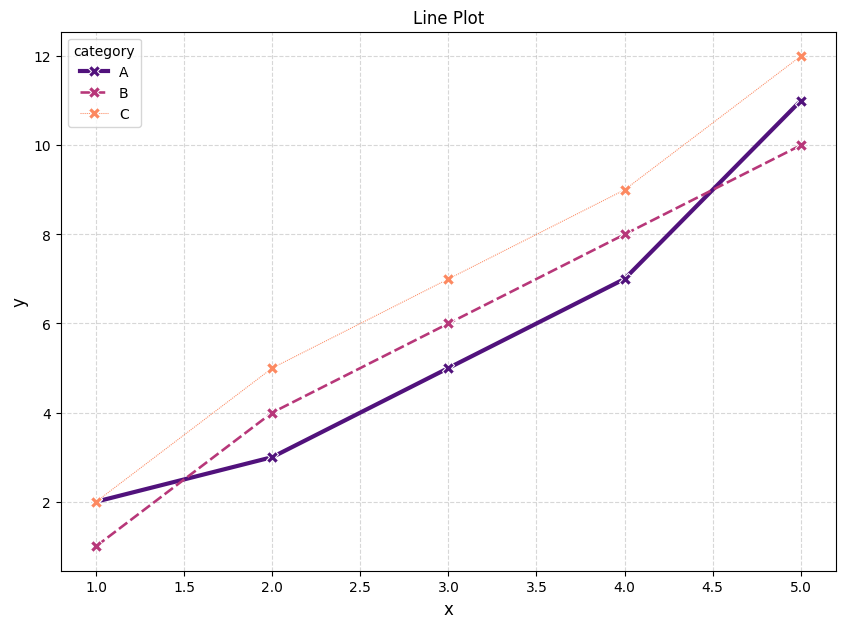

In [13]:
df_category = pd.DataFrame({'x': [1, 2, 3, 4, 5] * 3,
                            'y': [2, 3, 5, 7, 11, 1, 4, 6, 8, 10, 2, 5, 7, 9, 12],
                            'category': ['A'] * 5 + ['B'] * 5 + ['C'] * 5})
plot_line_seaborn(x = 'x', y = 'y', hue='category', data = df_category)

## plotly express

In [33]:
def plot_line_plotly(x, y, data: pd.DataFrame, num_of_line: int = 1,
                     hue: str = None, size: str = None, 
                     title: str = 'Line Plot', xlabel: str = None, ylabel: str = None,
                     color_discrete_sequence=None, line_dash_sequence=None,
                     width: int = 900, height: int = 650):
    """
    Plots a line chart using Plotly Express.

    Parameters:
    --------
    x (str or list of str): The column name(s) to be used for the x-axis.
    y (str or list of str): The column name(s) to be used for the y-axis.
    data (pd.DataFrame): The DataFrame containing the data to plot.
    num_of_line (int): Number of lines to plot. Default is 1.
    title (str): The title of the plot. Default is 'Line Plot'.
    xlabel (str): The label for the x-axis. Default is None.
    ylabel (str): The label for the y-axis. Default is None.
    hue (str): Variable that will produce lines with different colors. Default is None.
    size (str): Variable that will produce lines with different widths. Default is None.
    color_discrete_sequence (list): Custom color sequence for the lines. Default is None.
    line_dash_sequence (list): Custom line dash sequence. Default is None.
    width (int): Width of the figure in pixels. Default is 800.
    height (int): Height of the figure in pixels. Default is 500.

    Returns:
    plotly.graph_objs._figure.Figure
    """
    if not isinstance(x, list):
        x = [x]
    if not isinstance(y, list):
        y = [y]
    
    x_length = len(x)
    y_length = len(y)
    if x_length > y_length:
        y = y * x_length
    if x_length < y_length:
        x = x * y_length
    
    if color_discrete_sequence is None:
        color_discrete_sequence = px.colors.qualitative.Plotly[:num_of_line]
    
    if line_dash_sequence is None:
        line_dash_sequence = ['solid', 'dash', 'dot', 'longdash', 'dashdot', 'longdashdot'][:num_of_line]
    
    fig = px.line(data, x=x[0], y=y, color=hue, line_dash=hue if hue else None,
                  labels={x[0]: xlabel or x[0], 
                          y[0]: ylabel or y[0]},
                  title=title,
                  width=width, height=height,
                  color_discrete_sequence=color_discrete_sequence,
                  line_dash_sequence=line_dash_sequence)
    
    fig.update_traces(mode='lines+markers')
    
    # Add custom markers for each line
    markers = ['circle', 'x', 'square', 'diamond', 'cross', 'star']
    for i, trace in enumerate(fig.data):
        trace.marker.symbol = markers[i % len(markers)]
    
    fig.update_layout(
        legend_title_text=hue,
        title={
            'text': title,
            'font': {
                'family': 'Courier New, monospace',
                'size': 24,
                'color': '#7f7f7f'
            }
        }
    )
    
    return fig



df_vel = pd.DataFrame({'time':[0 ,5,10,15,20,25,30],
                    'velocity_obj_1':[10,15,20,20,30,15,0],
                    'velocity_obj_2':[10,12,15,12,20,10,0]})
plot_line_plotly(x='time',y=['velocity_obj_1','velocity_obj_2'], data = df_vel, num_of_line=2)

## Creating Multiplots on Same Canvas

### Matplot and Seaborn

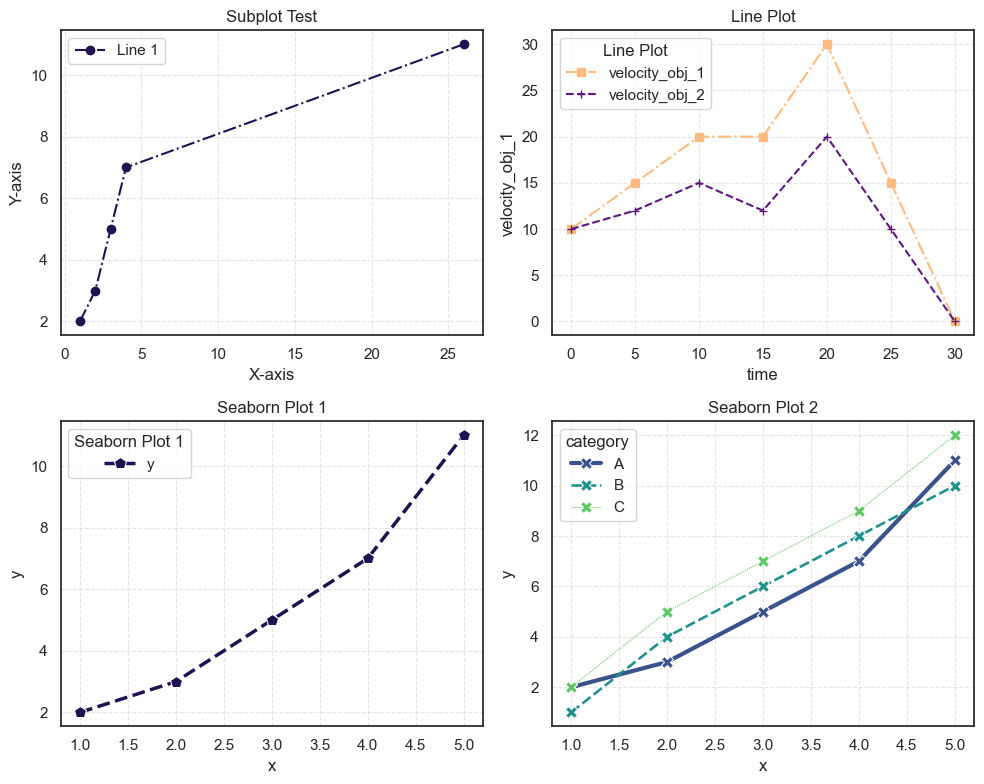

In [781]:
# Create a figure for multiple plots
fig, axes = plt.subplots(2,2, figsize=(10, 8))

# Matplotlib subplot 1
plot_line(x23, y23, num_of_line=1, title="Subplot Test", subplot=True, ax=axes[0,0])

# Matplotlib subplot 2
plot_line_matplotlib(x='time',y=['velocity_obj_1','velocity_obj_2'], data=df_vel, num_of_line=2, subplot=True, ax=axes[0,1])

# Seaborn subplot 3
plot_line_seaborn(x = 'x', y = 'y', data = df_category[df_category['category'] == 'A'], num_of_line=1,title='Seaborn Plot 1',subplot=True, ax=axes[1,0])

# Seaborn subplot 4
plot_line_seaborn(x = 'x', y = 'y', data = df_category, num_of_line=1, hue='category', style='category',palette='viridis',title='Seaborn Plot 2',subplot=True, ax=axes[1,1])


# # Adjust layout and display plot
plt.tight_layout()
plt.show()

# Scatter_plot

### Matplot

In [35]:
def scatter_plot_matplotlib(x, y, df: pd.DataFrame = None, 
                        size=None, color=None, marker='o', 
                        palette=None, alpha=0.8, linewidths=0.5, 
                        edgecolors='w', title: str = None, 
                        xlabel: str = None, ylabel: str = None, 
                        colorbar: bool = False):
    """
    Create a scatter plot from a DataFrame using matplotlib.

    Parameters:
    --------
    - x (str or array-like): The column name for the x-axis or data for x-axis.
    - y (str or array-like): The column name for the y-axis or data for y-axis.
    - df (pd.DataFrame, optional): The DataFrame containing the data.
    - size (array-like or scalar, optional): Size of points.
    - color (array-like or scalar, optional): Color of points.
    - marker (str, optional): Marker style.
    - palette (str, optional): Colormap.
    - alpha (float, optional): Alpha blending value.
    - linewidths (float, optional): Width of marker edges.
    - edgecolors (str, optional): Color of marker edges.
    - title (str, optional): Title of the plot.
    - xlabel (str, optional): Label for the x-axis.
    - ylabel (str, optional): Label for the y-axis.
    - colorbar (bool, optional): Whether to show a colorbar.
    
    Example:
    --------
    scatter_plot_matplotlib(x=x, y=y, color=colors, size=sizes,colorbar=True)
    """
    
    # Extract data for x and y axes
    if df is not None:
        if x not in df.columns or y not in df.columns:
            raise ValueError(f"The specified columns '{x}' and/or '{y}' do not exist in the DataFrame.")
        x_name = x
        y_name = y
        x = df[x].to_list()
        y = df[y].to_list()

    
    if color is not None and palette is None:
        palette = 'magma'
    
    if color is None:
    # Create scatter plot
        scatter = plt.scatter(x, y, s=size, c=color, marker=marker,color="black", cmap=palette, alpha=alpha, 
                            linewidths=linewidths, edgecolors=edgecolors)
    else:
        scatter = plt.scatter(x, y, s=size, c=color, marker=marker, cmap=palette, alpha=alpha, 
                            linewidths=linewidths, edgecolors=edgecolors)
    
    # Add labels and title for customization
    if df is not None:
        if title:
            plt.title(title, fontsize=16, weight='bold')
        plt.title(f'Scatter Plot of {xlabel if xlabel else x_name} vs {ylabel if ylabel else y_name}', fontsize=16, weight='bold')
        plt.xlabel(xlabel if xlabel else x_name, fontsize=14)
        plt.ylabel(ylabel if ylabel else y_name, fontsize=14)
    else:
        if title:
            plt.title(title, fontsize=16, weight='bold')
        plt.title(f'Scatter Plot of {xlabel if xlabel else "x"} vs {ylabel if ylabel else "y"}', fontsize=16, weight='bold')
        plt.xlabel(xlabel if xlabel else 'x', fontsize=14)
        plt.ylabel(ylabel if ylabel else 'y', fontsize=14)
    
    plt.grid(True, linestyle='--', linewidth=0.6, alpha=0.25)
    
    # Add legend
    if size is not None and colorbar is False:
        handles, labels = scatter.legend_elements(prop="sizes", alpha=0.7)
        plt.legend(handles, labels, title='Sizes')
    
    # Add colorbar
    if colorbar and color is not None:
        plt.colorbar(label='Color')
    
    # Adjust layout and show plot
    plt.tight_layout()
    plt.show()



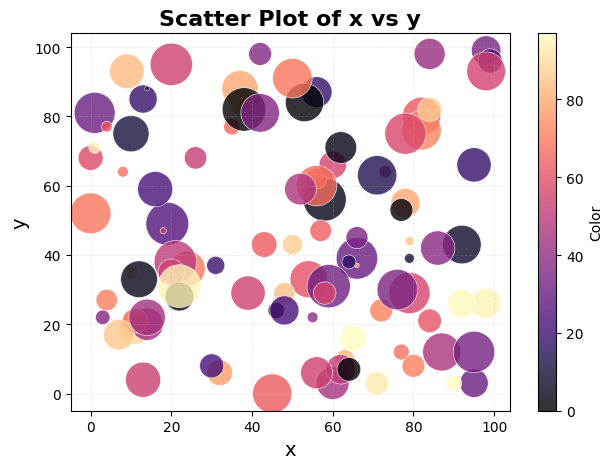

In [41]:
# x =[5, 7, 8, 7, 2, 17, 2, 9,4, 11, 12, 9, 6]
# y =[99, 86, 87, 88, 100, 86,103, 87, 94, 78, 77, 85, 86]
# scatter_plot_matplotlib(x=x, y=y)

# x = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
# y = [2, 3, 5, 7, 11, 1, 4, 6, 8, 10]
# sizes = [20, 50, 80, 200, 500, 300, 100, 60, 40, 70]
# colors = [10, 20, 30, 40, 50, 60, 70, 80, 90, 100] 
# scatter_plot_matplotlib(x=x, y=y,color=colors,size=sizes)

# df = pd.DataFrame({'A': [1, 2, 3, 4, 5],'B': [5, 4, 3, 2, 1],})
# scatter_plot_matplotlib(df=df,x='A', y='B')

x = np.random.randint(100, size=(100))
y = np.random.randint(100, size=(100))
colors = np.random.randint(100, size=(100))
sizes = 10 * np.random.randint(100, size=(100))
scatter_plot_matplotlib(x=x, y=y, color=colors, size=sizes,colorbar=True)

### Seaborn

In [784]:
def scatter_plot_seaborn(df: pd.DataFrame, 
                        x: str, 
                        y: str, 
                        hue: str = None,
                        size: str = None,
                        style: str = None,
                        title: str = None, 
                        xlabel: str = None, 
                        ylabel: str = None, 
                        size_range: tuple = (20, 500),
                        figsize: tuple =(10, 6), 
                        alpha: float = 0.7, 
                        palette: str = 'viridis',
                        colorbar: bool = False) -> None:
    """
    Create a customized scatter plot using Seaborn.

    Parameters:
    --------
    df (pd.DataFrame): The DataFrame containing the data to plot.
    x (str): The column name for the x-axis values.
    y (str): The column name for the y-axis values.
    hue (str, optional): The column name for the hue (color coding). Default is None.
    size (str, optional): The column name for the size of points. Default is None.
    style (str, optional): The column name for the style of points. Default is None.
    title (str): The title of the plot. Default is 'Scatter Plot'.
    xlabel (str, optional): The label for the x-axis. If None, use the column name. Default is None.
    ylabel (str, optional): The label for the y-axis. If None, use the column name. Default is None.
    size_range (tuple): The range of sizes for the scatter plot points. Default is (20, 500).
    alpha (float): The transparency level of the points. Default is 0.7.
    palette (str): The color palette to use for the plot. Default is 'viridis'.
    colorbar (bool): Whether to add a colorbar to the plot. Default is False.

    Example:
    --------
    scatter_plot_seaborn(df=fmri, x='timepoint', y='signal',palette='magma')
    
    Returns:
    --------
    None
    """
    if x not in df.columns or y not in df.columns:
        raise ValueError(f"The specified columns '{x}' and/or '{y}' do not exist in the DataFrame.")
    
    if hue and hue not in df.columns:
        raise ValueError(f"The specified hue column '{hue}' does not exist in the DataFrame.")
    
    if size and size not in df.columns:
        raise ValueError(f"The specified size column '{size}' does not exist in the DataFrame.")
    
    if style and style not in df.columns:
        raise ValueError(f"The specified style column '{style}' does not exist in the DataFrame.")
    
    if hue is None:
        hue = y
    
    
    print(f'Creating scatter plot for {x} vs {y}')
    
    plt.figure(figsize=figsize)
    scatter = sns.scatterplot(
        data=df, 
        x=x, 
        y=y, 
        hue=hue,
        size=size,
        style=style,
        palette=palette, 
        sizes=size_range, 
        alpha=alpha, 
        edgecolor='w', 
        linewidth=1.5
    )
    if title:
        plt.title(title, fontsize=16, weight='bold')
    plt.title(f'Scatter Plot of {xlabel if xlabel else x} vs {ylabel if ylabel else y}', fontsize=16, weight='bold')
    plt.xlabel(xlabel if xlabel else x, fontsize=14)
    plt.ylabel(ylabel if ylabel else y, fontsize=14)
    plt.grid(True, linestyle='--', linewidth=0.6, alpha=0.25)
    
    if hue:
        plt.legend(title=hue, fontsize=10, title_fontsize=12)
    
    if colorbar and hue:
        norm = plt.Normalize(df[hue].min(), df[hue].max())
        sm = plt.cm.ScalarMappable(cmap=palette, norm=norm)
        sm.set_array([])
        plt.colorbar(sm, label=hue)
    
    plt.tight_layout()
    plt.show()
    
    print('Scatter plot created successfully.')



Creating scatter plot for timepoint vs signal


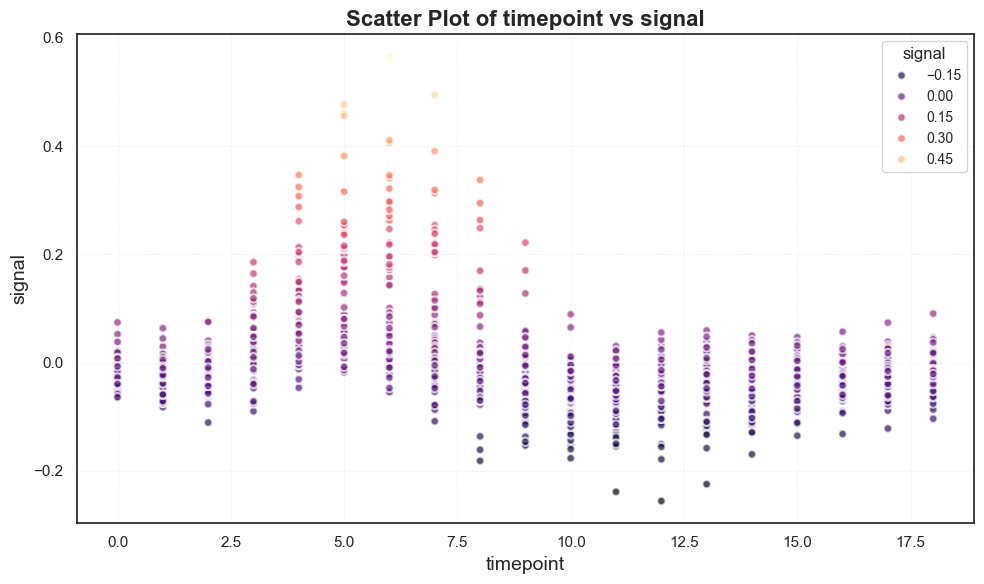

Scatter plot created successfully.


In [785]:
fmri = sns.load_dataset("fmri")
scatter_plot_seaborn(df=fmri, x='timepoint', y='signal',palette='magma')

## plotly express

In [37]:
def scatter_plot_plotly(df: pd.DataFrame, 
                        x: str, 
                        y: str, 
                        hue: str = None,
                        size: str = None,
                        symbol: str = None,
                        title: str = None, 
                        xlabel: str = None, 
                        ylabel: str = None, 
                        size_max: int = 20,
                        width: int = 800, 
                        height: int = 600, 
                        opacity: float = 0.7, 
                        color_discrete_sequence=None,
                        hover_data: list = None):
    """
    Create a customized scatter plot using Plotly Express.

    Parameters:
    --------
    df (pd.DataFrame): The DataFrame containing the data to plot.
    x (str): The column name for the x-axis values.
    y (str): The column name for the y-axis values.
    hue (str, optional): The column name for the color coding. Default is None.
    size (str, optional): The column name for the size of points. Default is None.
    symbol (str, optional): The column name for the symbol of points. Default is None.
    title (str): The title of the plot. Default is 'Scatter Plot'.
    xlabel (str, optional): The label for the x-axis. If None, use the column name. Default is None.
    ylabel (str, optional): The label for the y-axis. If None, use the column name. Default is None.
    size_max (int): The maximum size for the scatter plot points. Default is 20.
    width (int): Width of the figure in pixels. Default is 800.
    height (int): Height of the figure in pixels. Default is 600.
    opacity (float): The transparency level of the points. Default is 0.7.
    color_discrete_sequence (list): Custom color sequence. Default is None.
    hover_data (list): Additional data to show on hover. Default is None.

    Returns:
    --------
    plotly.graph_objs._figure.Figure
    """
    if x not in df.columns or y not in df.columns:
        raise ValueError(f"The specified columns '{x}' and/or '{y}' do not exist in the DataFrame.")
    
    if hue and hue not in df.columns:
        raise ValueError(f"The specified hue column '{hue}' does not exist in the DataFrame.")
    
    if size and size not in df.columns:
        raise ValueError(f"The specified size column '{size}' does not exist in the DataFrame.")
    
    if symbol and symbol not in df.columns:
        raise ValueError(f"The specified symbol column '{symbol}' does not exist in the DataFrame.")
    
    print(f'Creating scatter plot for {x} vs {y}')
    
    fig = px.scatter(df, x=x, y=y, 
                     color=hue,
                     size=size,
                     symbol=symbol,
                     title=title or f'Scatter Plot of {xlabel if xlabel else x} vs {ylabel if ylabel else y}',
                     labels={x: xlabel or x, y: ylabel or y},
                     size_max=size_max,
                     opacity=opacity,
                     width=width,
                     height=height,
                     color_discrete_sequence=color_discrete_sequence,
                     hover_data=hover_data)
    
    fig.update_layout(
        xaxis_title=xlabel or x,
        yaxis_title=ylabel or y,
        legend_title=hue,
    )
    
    return fig


fmri = sns.load_dataset("fmri")
scatter_plot_plotly(df=fmri, x='timepoint', y='signal',hue='signal')

Creating scatter plot for timepoint vs signal


# regplot

### Seaborn

In [786]:
def reg_plot(x, y, df: pd.DataFrame = None, 
                    color='b', marker='o', fit_reg=True, 
                    ci=95, n_boot=1000, order=1, 
                    logx=False, x_estimator=None, x_bins=None, 
                    x_ci='ci', scatter_kws=None, line_kws=None,
                    title: str = None, xlabel: str = None, ylabel: str = None,
                    figsize=(10, 6), grid=True):
    """
    Create a regression plot from a DataFrame using seaborn's regplot.

    Parameters:
    --------
    - x (str or array-like): The column name for the x-axis or data for x-axis.
    - y (str or array-like): The column name for the y-axis or data for y-axis.
    - df (pd.DataFrame, optional): The DataFrame containing the data.
    - color (str, optional): Color of points and line. Default is 'b'.
    - marker (str, optional): Marker style. Default is 'o'.
    - fit_reg (bool, optional): Whether to draw the regression line. Default is True.
    - ci (int or None, optional): Size of the confidence interval for the regression estimate. Default is 95.
    - n_boot (int, optional): Number of bootstrap resamples for computing confidence interval. Default is 1000.
    - order (int, optional): Order of the polynomial regression. Default is 1.
    - logx (bool, optional): If True, estimate a linear regression of the log of the x variable. Default is False.
    - x_estimator (callable, optional): Apply this function to each unique value of x and plot the resulting estimate.
    - x_bins (int or list, optional): Bin the x variable into discrete bins.
    - x_ci (str or None, optional): Size of the confidence intervals for the estimated values. Default is 'ci'.
    - scatter_kws (dict, optional): Additional keyword arguments for scatter plot. Default is None.
    - line_kws (dict, optional): Additional keyword arguments for line plot. Default is None.
    - title (str, optional): Title of the plot. Default is None.
    - xlabel (str, optional): Label for the x-axis. Default is None.
    - ylabel (str, optional): Label for the y-axis. Default is None.
    - figsize (tuple, optional): Figure size as (width, height). Default is (10, 6).
    - grid (bool, optional): Whether to show grid. Default is True.
    - grid_style (str, optional): Line style of the grid. Default is '--'.
    - grid_width (float, optional): Line width of the grid. Default is 0.6.
    - grid_alpha (float, optional): Transparency of the grid lines. Default is 0.25.

    Examples:
    --------
    1- reg_plot(x='timepoint',y='signal',df= fmri,color='black', marker='X',figsize=(8,5))
    2- reg_plot('x', 'y', df, title='Example Regression Plot',figsize=(8,5))
    
    Raises:
    --------
    - ValueError: If the specified columns do not exist in the DataFrame.
    """
    
    # Check if scatter_kws and line_kws are None and provide defaults
    if scatter_kws is None:
        scatter_kws = {}
    if line_kws is None:
        line_kws = {}

    # Check if columns exist in DataFrame
    if df is not None:
        if x not in df.columns or y not in df.columns:
            raise ValueError(f"The specified columns '{x}' and/or '{y}' do not exist in the DataFrame.")
    
    # Create figure and axis with specified size
    plt.figure(figsize=figsize)
    
    # Create regression plot
    sns.regplot(x=x, y=y, data=df, color=color, marker=marker, fit_reg=fit_reg, ci=ci, n_boot=n_boot, 
                order=order, logx=logx, x_estimator=x_estimator, x_bins=x_bins, x_ci=x_ci, 
                scatter_kws=scatter_kws, line_kws=line_kws)
    
    # Add labels and title for customization
    plt.title(title if title else f'Regression Plot of {xlabel if xlabel else x} vs {ylabel if ylabel else y}', fontsize=16, weight='bold')
    plt.xlabel(xlabel if xlabel else x, fontsize=14)
    plt.ylabel(ylabel if ylabel else y, fontsize=14)
    
    # Customize grid if enabled
    if grid:
        plt.grid(True, linestyle='--', linewidth=0.6, alpha=0.25)
    
    # Adjust layout and show plot
    plt.tight_layout()
    plt.show()



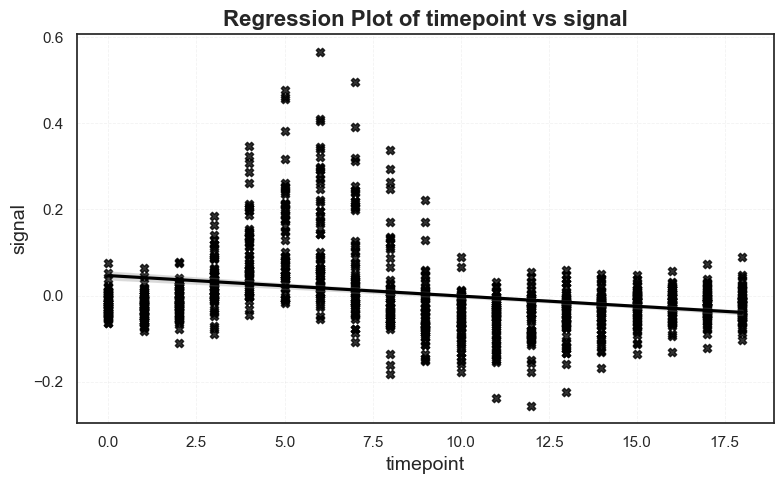

In [787]:
fmri = sns.load_dataset("fmri")
reg_plot(x='timepoint',y='signal',df= fmri,color='black', marker='X',figsize=(8,5))

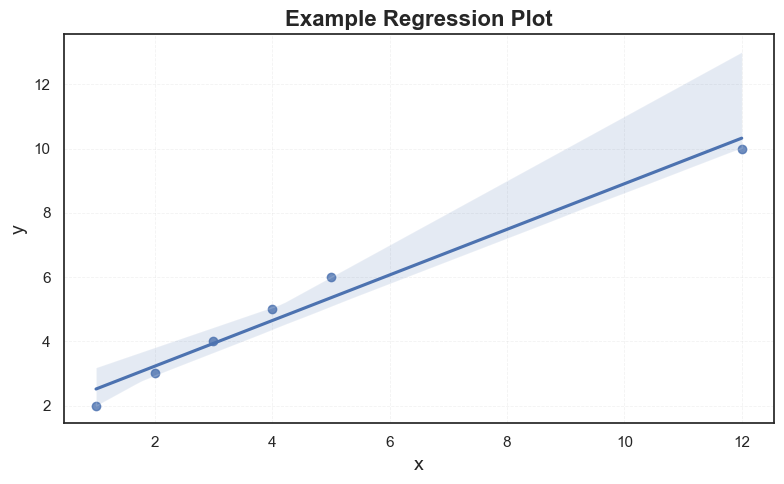

In [788]:
df = pd.DataFrame({'x': [1, 2, 3, 4, 5,12],
                'y': [2, 3, 4, 5, 6,10]})
reg_plot('x', 'y', df, title='Example Regression Plot',figsize=(8,5))

# residplot

### Seaborn

In [789]:
def resid_plot(x, y, df: pd.DataFrame = None, 
                    lowess=False, color='b', 
                    scatter_kws=None, line_kws=None, 
                    title: str = None, xlabel: str = None, ylabel: str = None,
                    figsize=(10, 6), grid=True):
    """
    Create a residual plot from a DataFrame using seaborn's residplot.

    Parameters:
    --------
    - x (str or array-like): The column name for the x-axis or data for x-axis.
    - y (str or array-like): The column name for the y-axis or data for y-axis.
    - df (pd.DataFrame, optional): The DataFrame containing the data.
    - lowess (bool, optional): If True, use LOWESS smoothing. Default is False.
    - color (str, optional): Color of points. Default is 'b'.
    - scatter_kws (dict, optional): Additional keyword arguments for scatter plot. Default is None.
    - line_kws (dict, optional): Additional keyword arguments for line plot. Default is None.
    - title (str, optional): Title of the plot. Default is None.
    - xlabel (str, optional): Label for the x-axis. Default is None.
    - ylabel (str, optional): Label for the y-axis. Default is None.
    - figsize (tuple, optional): Figure size as (width, height). Default is (10, 6).
    - grid (bool, optional): Whether to show grid. Default is True.
    - grid_style (str, optional): Line style of the grid. Default is '--'.
    - grid_width (float, optional): Line width of the grid. Default is 0.6.
    - grid_alpha (float, optional): Transparency of the grid lines. Default is 0.25.

    Examples:
    --------
    1- resid_plot(x='timepoint',y='signal',df= fmri,color='black',figsize=(8,5))
    2- resid_plot('x', 'y', df, title='Example Regression Plot',figsize=(8,5))
    
    Raises:
    --------
    - ValueError: If the specified columns do not exist in the DataFrame.
    """
    
    # Check if scatter_kws and line_kws are None and provide defaults
    if scatter_kws is None:
        scatter_kws = {}
    if line_kws is None:
        line_kws = {}

    # Check if columns exist in DataFrame
    if df is not None:
        if x not in df.columns or y not in df.columns:
            raise ValueError(f"The specified columns '{x}' and/or '{y}' do not exist in the DataFrame.")
    
    # Create figure and axis with specified size
    plt.figure(figsize=figsize)
    
    # Create residual plot
    sns.residplot(x=x, y=y, data=df, lowess=lowess, color=color, 
                scatter_kws=scatter_kws, line_kws=line_kws)
    
    # Add labels and title for customization
    plt.title(title if title else f'Residual Plot of {xlabel if xlabel else x} vs {ylabel if ylabel else y}', fontsize=16, weight='bold')
    plt.xlabel(xlabel if xlabel else x, fontsize=14)
    plt.ylabel(ylabel if ylabel else y, fontsize=14)
    
    # Customize grid if enabled
    if grid:
        plt.grid(True, linestyle='--', linewidth=0.6, alpha=0.25)
    
    # Adjust layout and show plot
    plt.tight_layout()
    plt.show()



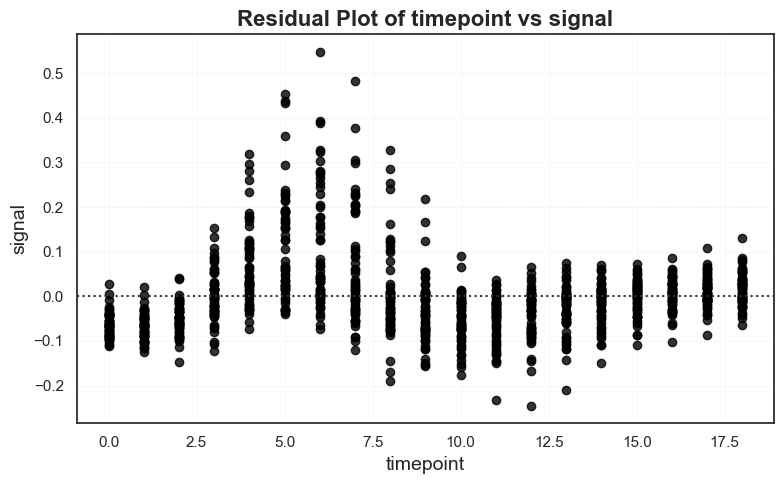

In [790]:
fmri = sns.load_dataset("fmri")
resid_plot(x='timepoint',y='signal',df= fmri,color='black',figsize=(8,5))

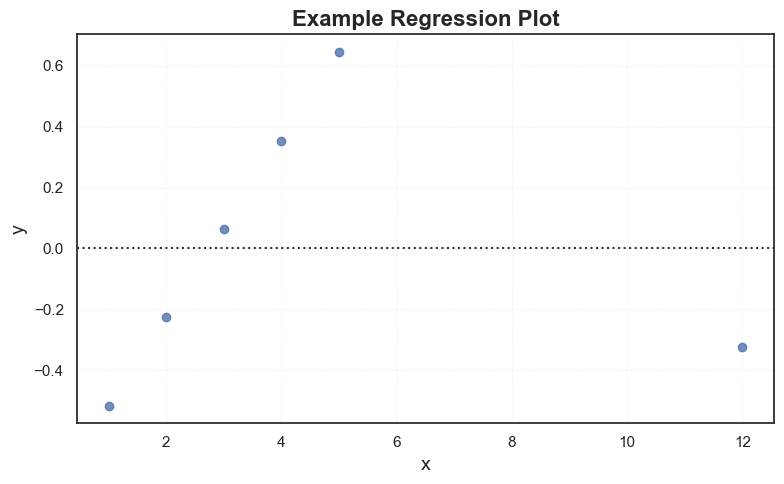

In [791]:
df = pd.DataFrame({'x': [1, 2, 3, 4, 5,12],
                'y': [2, 3, 4, 5, 6,10]})
resid_plot('x', 'y', df, title='Example Regression Plot',figsize=(8,5))

# Bar_plot

### Matplot

In [867]:
def bar_plot_matplotlib(
    x, y, 
    palette='magma', 
    palette2='viridis',
    color=None,
    width=0.75, 
    edgecolor='black', 
    xlabel=None, 
    ylabel=None, 
    title=None, 
    hatches:list=None,
    hatch:bool=True,
    order=False,
    x_rotation = 45,
    figsize = (10, 8)
):
    """
    Creates a bar plot using matplotlib with customizable colors, hatches, and labels.
    
    Parameters:
    --------
    - x (list): Categories for the x-axis.
    - y (list): Values for the y-axis.
    - palette (str): Color palette for the bars (default is 'magma').
    - width (float): Width of the bars (default is 0.8).
    - edgecolor (str): Edge color of the bars (default is 'black').
    - xlabel (str): Label for the x-axis.
    - ylabel (str): Label for the y-axis.
    - title (str): Title of the plot.
    - hatches (list): List of hatches for the bars.
    - hatch (bool): to make hatches or not (default is True)
    - order (bool): Whether to order the bars by height (default is False).
    
    Example:
    --------
    >>> bar_plot_matplotlib(categories, values)
    
    Returns:
    --------
    - None
    """
    plt.figure(figsize = figsize)
    
    if order:
        # Order the bars by the y-values
        x, y = zip(*sorted(zip(x, y), key=lambda pair: pair[1], reverse=True))
    if hatch is True:
        if not hatches:
            hatches = random.sample(['X', 'oo', 'O|', '/', '+', '++', '--', '-\\', 'xx', '*-', '\\\\', '|*', '\\', 'OO', 'o', '**', 'o-', '*', '//', '||', '+o', '..', '/o', 'O.', '\\|', 'x*', '|', '-', None], len(x))
    
    # get the color for each plot
    if color is None:
        if len(x) <= 6 :
            colors = random.sample(sns.color_palette(palette), len(x))
        elif len(x) <= 12 :
            colors = random.sample(sns.color_palette(palette) + sns.color_palette(palette2), len(x))
        elif len(x) > 12 :
            colors = random.choices(sns.color_palette(palette) + sns.color_palette(palette2), k=len(x))
    else:
        colors = [color] * len(x)
    
    # Create the bar plot
    bars = plt.bar(x, y, color=colors, hatch=hatches, width=width, edgecolor=edgecolor)
    
    # Set the labels and title
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.grid(True, linestyle='--', linewidth=0.6, alpha=0.4)
    
    # Add legend
    plt.legend(bars, x, title=title)
    
    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height + 0, f'{height}', ha='center', va='bottom', color='black')
    plt.xticks(rotation=x_rotation)
    
    # Display plot
    plt.show()



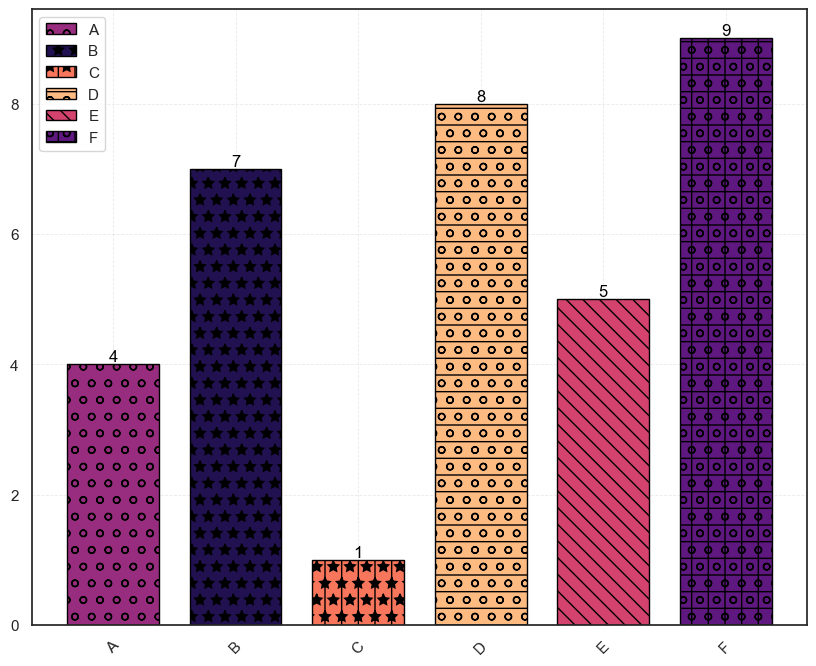

In [869]:
categories = ['A', 'B', 'C', 'D', 'E', 'F']
values = [4, 7, 1, 8, 5, 9]
bar_plot_matplotlib(categories, values)

### Seaborn

In [53]:
def bar_plot_seaborn(
    df, x, y, hue=None,
    palette='magma', 
    width=0.75, 
    edgecolor='black',
    linewidth=1.5,
    xlabel=None, 
    ylabel=None, 
    title=None, 
    hatches: list = None,
    hatch: bool = True,
    order: bool = False,
    figsize = (8, 6),
    legend=True
):
    """
    Plots a bar chart using seaborn with optional hatching and ordering.

    Parameters:
    -------
    - df: DataFrame containing the data to plot.
    - x: Column name for the x-axis.
    - y: Column name for the y-axis.
    - hue: Column name for color grouping.
    - palette: Color palette for the bars.
    - width: Width of the bars.
    - edgecolor: Color of the bar edges.
    - linewidth: Width of the bar edges.
    - xlabel: Label for the x-axis.
    - ylabel: Label for the y-axis.
    - title: Title of the plot.
    - hatches: List of hatch patterns to apply.
    - hatch: Whether to apply hatches to the bars.
    - order: Whether to order the bars by the x values.
    - figsize: Size of the figure.
    
    Example:
    ------
    >>> bar_plot_seaborn(df=data, x='category', y='value',palette='viridis')
    
    """
    
    plt.figure(figsize=figsize)
    
    # Generate random hatches if needed
    if hatch and not hatches:
        hatches_list = random.sample(['X', 'oo', 'O|', '/', '+', '++', '--', '-\\', 'xx', '*-', '\\\\', '|*', '\\', 'OO', 'o', '**', 'o-', '*', '//', '||', '+o', '..', '/o', 'O.', '\\|', 'x*', '|', '-', None], len(df[x].unique()))
    
    if hue is None:
        hue = x
    # Order bars if the order parameter is True
    if order:
        ordered_x = df.groupby(x)[y].sum().sort_values(ascending=False).index
        bar_plot = sns.barplot(data=df, x=x, y=y, hue=hue, palette=palette, width=width,hatch=hatches, edgecolor=edgecolor, linewidth=linewidth, order=ordered_x)
    else:
        bar_plot = sns.barplot(data=df, x=x, y=y, hue=hue, palette=palette, width=width,hatch=hatches, edgecolor=edgecolor, linewidth=linewidth)
    
    # Apply hatches if required
    if hatch is True and hatches is None:
        for bar, hatch_pattern in zip(bar_plot.patches, hatches_list):
            bar.set_hatch(hatch_pattern)
    
    # Set tick_tick_tick_tick_tick_tick_tick_labels and title
    plt.xlabel(xlabel if xlabel else x)
    plt.ylabel(ylabel if ylabel else 'value')
    plt.title(title if title else "")
    plt.grid(True, linestyle='--', linewidth=0.6, alpha=0.4)
    
    # Add legend with colors and hatches
    if legend:
        plt.legend(df[x], title=x)
    
    # Add value labels on bars
    for bar in bar_plot.patches:
        height = bar.get_height()
        bar_plot.annotate(f'{height:.2f}', (bar.get_x() + bar.get_width() / 2, height), ha='center', va='bottom', color='black', fontsize=10)
    
    # Display plot
    plt.show()



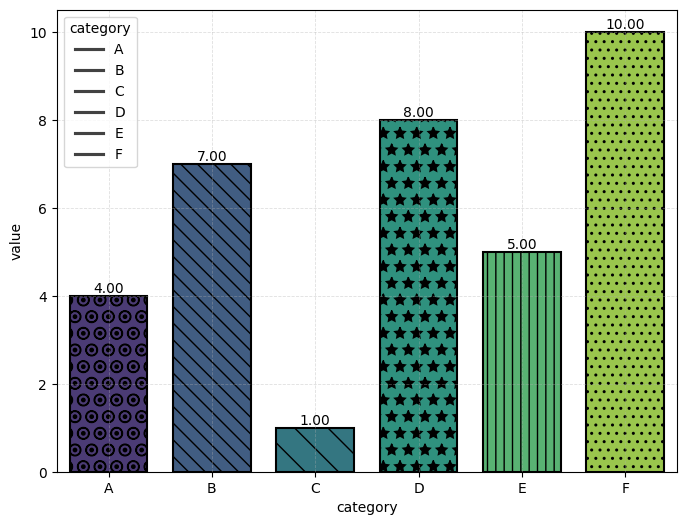

In [54]:
data = pd.DataFrame({'category': ['A', 'B', 'C', 'D', 'E', 'F'],
                    'value': [4, 7, 1, 8, 5, 10]})
bar_plot_seaborn(df=data, x='category', y='value',palette='viridis')

In [55]:
def bar_plot_all_column(numerical_features, df,out_column):
    for nf in numerical_features:
        bar_plot_seaborn(df=df, x=out_column, y=numerical_features[nf],ylabel=nf , title= f'{nf} vs deposit',figsize = (6, 4),legend=False)

In [56]:
df=pd.read_csv("bank.csv")
numerical_features=df.select_dtypes(include='number')
categorical_features=['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']

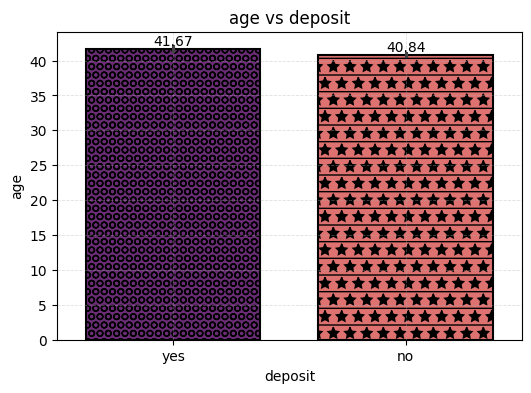

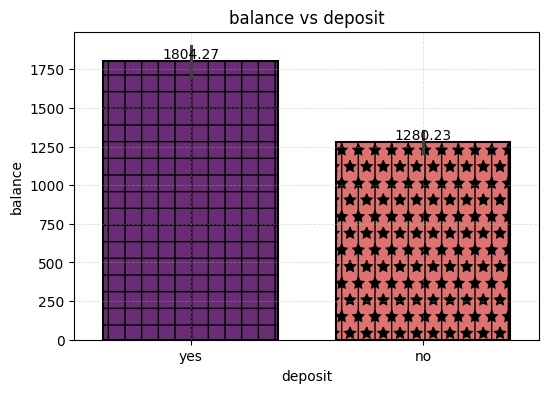

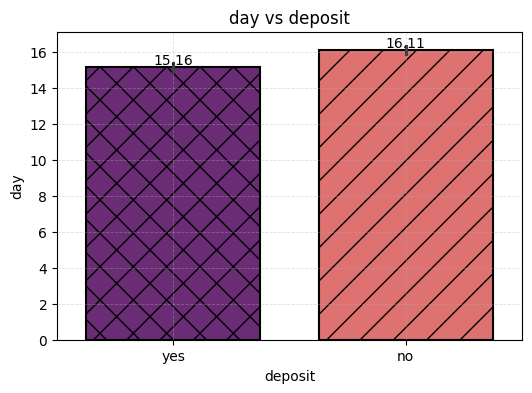

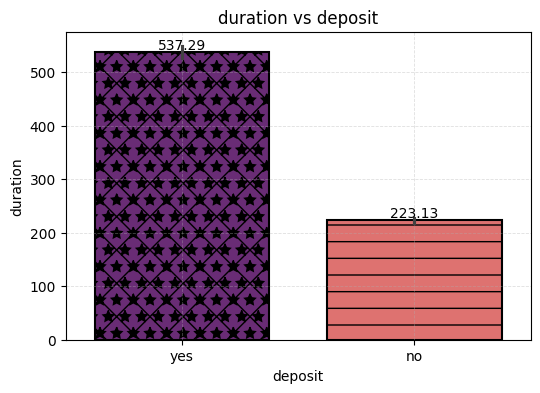

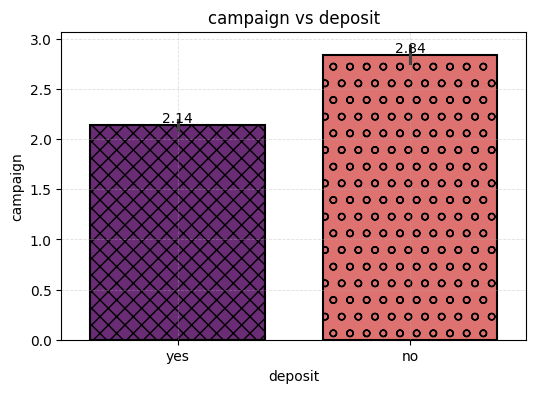

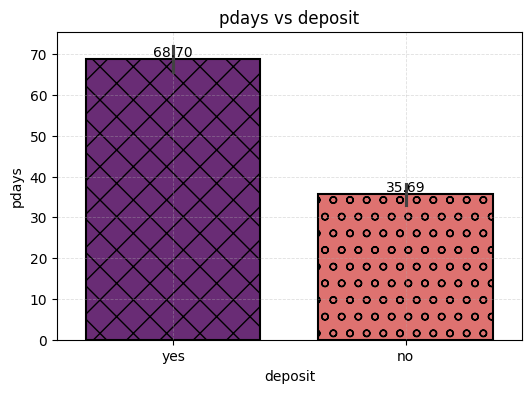

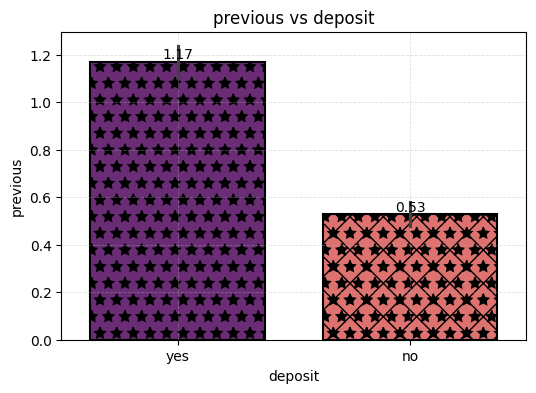

In [58]:
bar_plot_all_column(numerical_features, df, 'deposit')

## plotly express

In [2]:
def bar_plot_plotly(
    df: pd.DataFrame, x: str, y: str, hue: str = None,
    color_discrete_sequence=None, 
    barmode: str = 'group',
    xlabel: str = None, 
    ylabel: str = None, 
    title: str = None, 
    width: int = 800,
    height: int = 600,
    text_auto: bool = True,
    category_orders: dict = None
):
    """
    Plots a bar chart using Plotly Express.

    Parameters:
    -------
    - df: DataFrame containing the data to plot.
    - x: Column name for the x-axis.
    - y: Column name for the y-axis.
    - hue: Column name for color grouping.
    - color_discrete_sequence: Custom color sequence for the bars.
    - barmode: Mode for displaying bars ('group' or 'stack').
    - xlabel: Label for the x-axis.
    - ylabel: Label for the y-axis.
    - title: Title of the plot.
    - width: Width of the figure in pixels.
    - height: Height of the figure in pixels.
    - text_auto: Whether to display values on bars.
    - category_orders: Dict to specify the order of categorical variables.
    
    Returns:
    -------
    plotly.graph_objs._figure.Figure
    """
    
    fig = px.bar(df, x=x, y=y, color=hue,
                 barmode=barmode,
                 color_discrete_sequence=color_discrete_sequence,
                 title=title,
                 labels={x: xlabel or x, y: ylabel or y},
                 width=width,
                 height=height,
                 text_auto=text_auto,
                 category_orders=category_orders)
    
    fig.update_layout(
        xaxis_title=xlabel or x,
        yaxis_title=ylabel or y,
        legend_title=hue,
    )
    
    return fig



data = pd.DataFrame({'category': ['A', 'B', 'C', 'D', 'E', 'F'],
                    'value': [4, 7, 1, 8, 5, 10]})
bar_plot_plotly(df=data, x='category', y='value',hue='value')

## Multiple bar plots

### Matplot

In [798]:
def multiple_bar_plot_matplotlib(
    categories, 
    datasets, 
    labels=None, 
    palette='magma', 
    width=0.35, 
    edgecolor='black', 
    xlabel=None, 
    ylabel=None, 
    title=None, 
    hatches:list=None, 
    hatch:bool=True, 
    order=False, 
    figsize=(10, 6)
):
    """
    Creates multiple bar plots using Matplotlib with customizable colors, hatches, and labels.
    
    Parameters:
    ---------
    - categories (list): Categories for the x-axis.
    - datasets (list of lists): Values for each dataset.
    - labels (list): Labels for each dataset.
    - palette (str): Color palette for the bars (default is 'magma').
    - width (float): Width of the bars (default is 0.35).
    - edgecolor (str): Edge color of the bars (default is 'black').
    - xlabel (str): Label for the x-axis.
    - ylabel (str): Label for the y-axis.
    - title (str): Title of the plot.
    - hatches (list): List of hatches for the bars.
    - hatch (bool): to make hatches or not (default is True).
    - order (bool): Whether to order the bars by height of the first dataset (default is False).
    - figsize (tuple): Figure size (default is (10, 6)).
    
    Examples:
    --------
    >>> multiple_bar_plot_matplotlib(tick_labels, data, labels=labels, palette='viridis', title='Scores by group and category', xlabel='Category', ylabel='Scores',width=0.65)
    >>> multiple_bar_plot_matplotlib(categories, [values1,values2], palette='viridis', title='Scores by group and category', xlabel='Category', ylabel='Scores',width=0.65)
    
    Returns:
    -------
    - None
    """
    # If ordering is requested, order the categories and all datasets by the first dataset
    if order:
        categories, *datasets = zip(*sorted(zip(categories, *datasets), key=lambda pair: pair[1], reverse=True))

    # Determine the number of datasets
    num_datasets = len(datasets)
    
    # Determine the width of each bar group
    bar_width = width / num_datasets
    
    # Create a new figure and axis
    fig, ax = plt.subplots(figsize=figsize)
    
    x = np.arange(len(categories))  # the label locations
    
    # Determine hatches if not provided and hatching is enabled
    if hatch:
        if not hatches:
            hatches = random.sample(['X', 'oo', 'O|', '/', '+', '++', '--', '-\\', 'xx', '*-', '\\\\', '|*', '\\', 'OO', 'o', '**', 'o-', '*', '//', '||', '+o', '..', '/o', 'O.', '\\|', 'x*', '|', '-', None], len(categories))
    
    # Determine colors
    colors = random.sample(sns.color_palette(palette), num_datasets)
    
    for i, dataset in enumerate(datasets):
        bar_position = x + (i - num_datasets / 2) * bar_width + bar_width / 2
        bars = ax.bar(bar_position, dataset, bar_width, label=labels[i] if labels else f'Dataset {i+1}', color=colors[i] if colors else None, edgecolor=edgecolor, hatch=hatches if hatch else None)
        
        # Adding data labels
        for bar in bars:
            height = bar.get_height()
            ax.annotate(f'{height}',
                        xy=(bar.get_x() + bar.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom')

    # Set the labels and title
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.set_xticks(x)
    ax.set_xticklabels(categories)
    ax.legend(title=title)
    
    # Add gridlines
    ax.grid(True, linestyle='--', linewidth=0.6, alpha=0.4)
    
    # Adjust layout to make room for the annotations
    fig.tight_layout()
    plt.show()



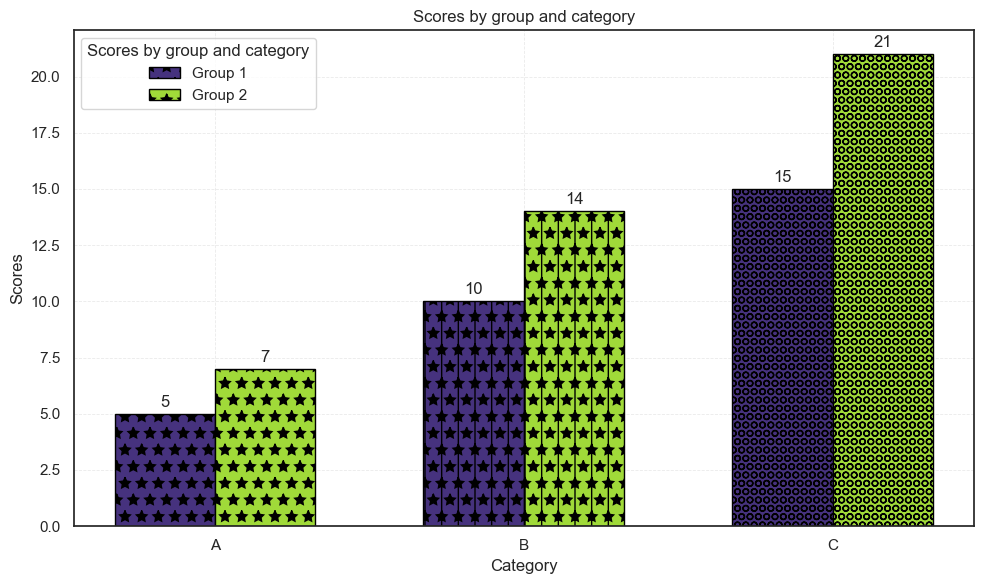

In [799]:
# Data
data = [
    [5, 10, 15],
    [7, 14, 21]]
labels = ['Group 1', 'Group 2']
tick_labels = ['A', 'B', 'C']
multiple_bar_plot_matplotlib(tick_labels, data, labels=labels, palette='viridis', title='Scores by group and category', xlabel='Category', ylabel='Scores',width=0.65)

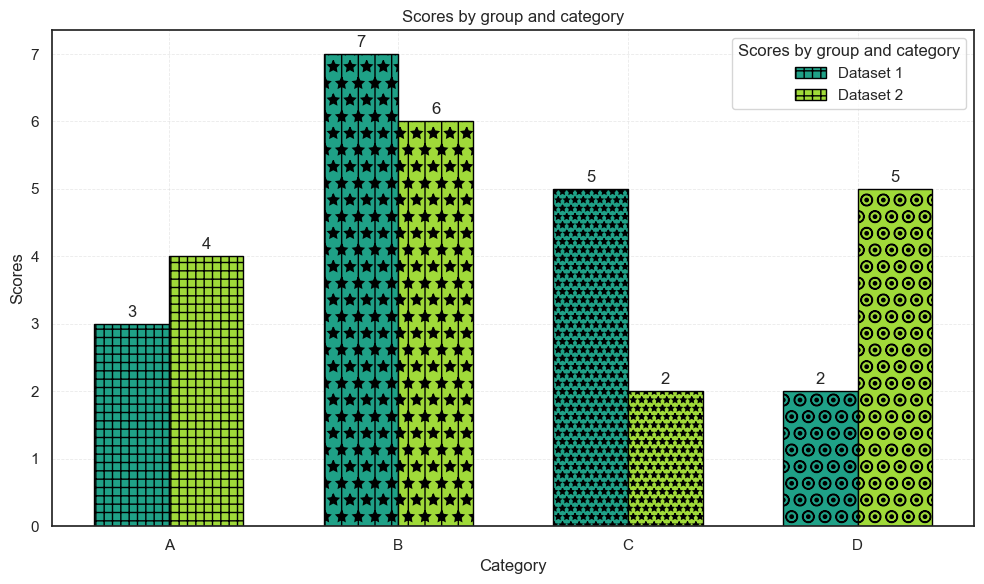

In [800]:
categories = ['A', 'B', 'C', 'D']
values1 = [3, 7, 5, 2]
values2 = [4, 6, 2, 5]
x = np.arange(len(categories))  # the label locations
multiple_bar_plot_matplotlib(categories, [values1,values2], palette='viridis', title='Scores by group and category', xlabel='Category', ylabel='Scores',width=0.65)


### Seaborn

In [801]:
def multiple_bar_plots_seaborn(
    data, 
    labels=None, 
    categories=None,
    colors=None,
    title=None, 
    xlabel=None, 
    ylabel=None, 
    palette='magma', 
    width=0.75, 
    edgecolor='black',
    linewidth=1.5,
    hatches: list = None,
    hatch: bool = True,
    order: bool = False,
    figsize=(10, 8),
    data_labels=True,
):
    """
    Creates a customized bar plot with optional hatching and ordering using Seaborn.

    Parameters:
    ----------
    - data: Data for plotting (list of lists, numpy array, or pandas DataFrame).
    - labels: Labels for each dataset (used in legend).
    - categories: Labels for the x-axis categories.
    - colors: Colors for the bars.
    - title: Title of the plot.
    - xlabel: Label for the x-axis.
    - ylabel: Label for the y-axis.
    - legend_loc: Location of the legend.
    - palette: Color palette for the bars.
    - width: Width of the bars.
    - edgecolor: Color of the bar edges.
    - linewidth: Width of the bar edges.
    - hatches: List of hatch patterns to apply.
    - hatch: Whether to apply hatches to the bars.
    - order: Whether to order the bars by the x values.
    - figsize: Size of the figure.
    - grid: Whether to show grid lines.
    - data_labels: Whether to show data labels on bars.
    - data_label_format: Format string for data labels.
    - data_label_offset: Offset for data labels.
    
    Examples:
    --------
    >>> multiple_bar_plots_seaborn(data=data, labels=tick_labels, categories=labels, palette='viridis', width=0.75)
    >>> multiple_bar_plots_seaborn(data=df, labels=labels, categories=tick_labels, width=0.75)
    
    """
    
    if xlabel is None:
        xlabel = 'Category'
    if ylabel is None:
        ylabel = 'Values'
    if title is None:
        title = 'Multiple Bar Plots'
    
    # Convert data to DataFrame if it's not already
    if not isinstance(data, pd.DataFrame):
        if isinstance(data[0], (list, np.ndarray)):
            df = pd.DataFrame(data).T
        else:
            df = pd.DataFrame(data, columns=['Values'])
    else:
        df = data.copy()
    
    # Set column labels
    if labels:
        df.columns = labels
    
    # Add category labels
    if categories:
        df['Category'] = categories
    else:
        df['Category'] = [f'Category {i+1}' for i in range(len(df))]
    
    # Melt DataFrame for plotting
    df_melted = df.melt(id_vars='Category', var_name='Dataset', value_name='Value')
    
    plt.figure(figsize=figsize)
    
    # Generate random hatches if needed
    if hatch and not hatches:
        hatches_list = random.sample(['X', 'oo', 'O|', '/', '+', '++', '--', '-\\', 'xx', '*-', '\\\\', '|*', '\\', 'OO', 'o', '**', 'o-', '*', '//', '||', '+o', '..', '/o', 'O.', '\\|', 'x*', '|', '-', None], len(df['Category'].unique()))
    else:
        hatches_list = hatches
    
    # Order bars if the order parameter is True
    if order:
        ordered_x = df_melted.groupby('Category')['Value'].sum().sort_values(ascending=False).index
        ax = sns.barplot(data=df_melted, x='Category', y='Value', hue='Dataset', palette=colors if colors else palette, errorbar=None, order=ordered_x, width=width)
    else:
        ax = sns.barplot(data=df_melted, x='Category', y='Value', hue='Dataset', palette=colors if colors else palette, errorbar=None, width=width)
    
    # Apply edgecolor and linewidth
    for bar in ax.patches:
        bar.set_edgecolor(edgecolor)
        bar.set_linewidth(linewidth)
    
    # Apply hatches if required
    if hatch and hatches_list:
        for i, bar_group in enumerate(ax.patches):
            hatch_pattern = hatches_list[i % len(hatches_list)]
            bar_group.set_hatch(hatch_pattern)
    
    # Adding data labels
    if data_labels:
        for p in ax.patches:
            ax.annotate(format(p.get_height(), '.1f'),
                        (p.get_x() + p.get_width() / 2., p.get_height()),
                        ha='center', va='center', 
                        xytext=(0, 10), 
                        textcoords='offset points')
    
    # Customize plot
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend(loc='best')
    
    plt.grid(True, linestyle='--', linewidth=0.6, alpha=0.4)
    
    # Show plot
    plt.show()



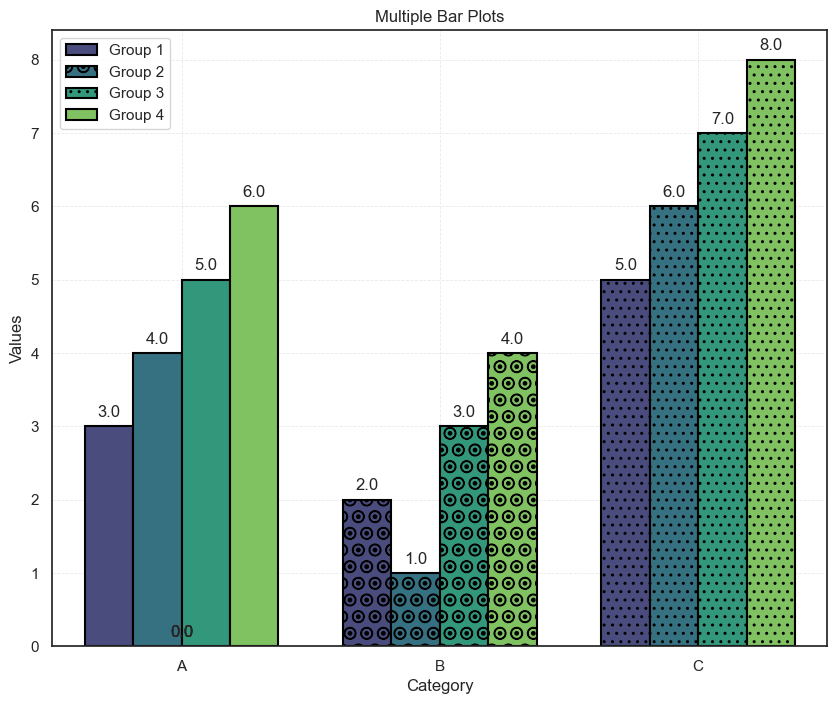

In [802]:
data = [[3, 2, 5],
        [4, 1, 6],
        [5, 3, 7],
        [6, 4, 8]]
labels = ['A', 'B', 'C']
tick_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4']

multiple_bar_plots_seaborn(data=data, labels=tick_labels, categories=labels, palette='viridis', width=0.75)

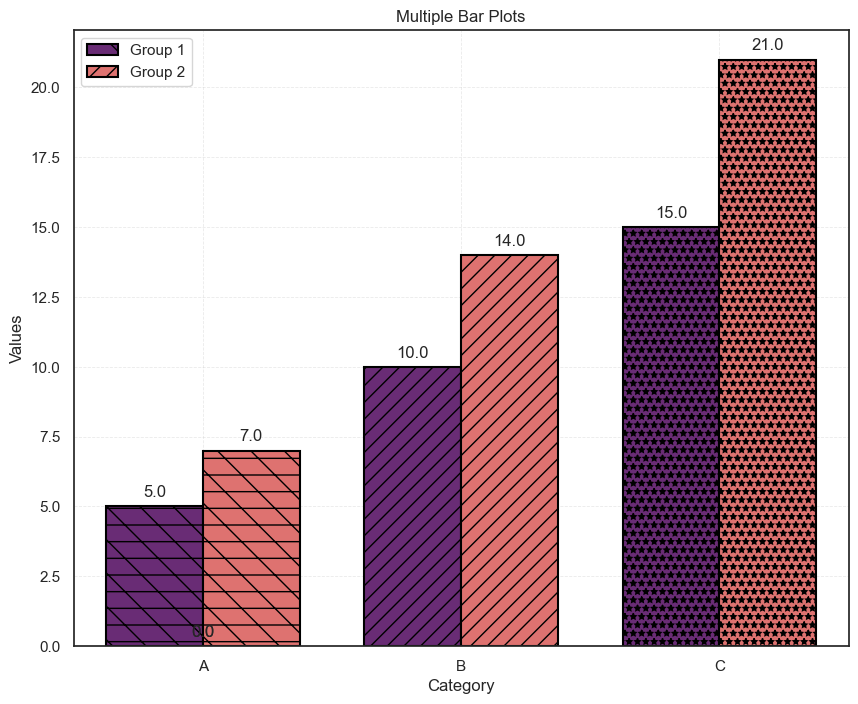

In [803]:
data = [
    [5, 10, 15],
    [7, 14, 21]
]
df = pd.DataFrame(data).T
labels = ['Group 1', 'Group 2']
tick_labels = ['A', 'B', 'C']

multiple_bar_plots_seaborn(data=df, labels=labels, categories=tick_labels, width=0.75)

## plotly express

In [4]:
def multiple_bar_plots_plotly(
    data, 
    labels=None, 
    categories=None,
    color_discrete_sequence=None,
    title: str = None, 
    xlabel: str = None, 
    ylabel: str = None, 
    barmode: str = 'group',
    width: int = 800,
    height: int = 600,
    text_auto: bool = True,
    category_orders: dict = None
):
    """
    Creates a customized bar plot for multiple datasets using Plotly Express.

    Parameters:
    ----------
    - data: Data for plotting (list of lists, numpy array, or pandas DataFrame).
    - labels: Labels for each dataset (used in legend).
    - categories: Labels for the x-axis categories.
    - color_discrete_sequence: Custom color sequence for the bars.
    - title: Title of the plot.
    - xlabel: Label for the x-axis.
    - ylabel: Label for the y-axis.
    - barmode: Mode for displaying bars ('group' or 'stack').
    - width: Width of the figure in pixels.
    - height: Height of the figure in pixels.
    - text_auto: Whether to display values on bars.
    - category_orders: Dict to specify the order of categorical variables.
    
    Returns:
    -------
    plotly.graph_objs._figure.Figure
    """
    
    if xlabel is None:
        xlabel = 'Category'
    if ylabel is None:
        ylabel = 'Values'
    if title is None:
        title = 'Multiple Bar Plots'
    
    # Convert data to DataFrame if it's not already
    if not isinstance(data, pd.DataFrame):
        if isinstance(data[0], (list, np.ndarray)):
            df = pd.DataFrame(data).T
        else:
            df = pd.DataFrame(data, columns=['Values'])
    else:
        df = data.copy()
    
    # Set column labels
    if labels:
        df.columns = labels
    
    # Add category labels
    if categories:
        df['Category'] = categories
    else:
        df['Category'] = [f'Category {i+1}' for i in range(len(df))]
    
    # Melt DataFrame for plotting
    df_melted = df.melt(id_vars='Category', var_name='Dataset', value_name='Value')
    
    fig = px.bar(df_melted, x='Category', y='Value', color='Dataset',
                 barmode=barmode,
                 color_discrete_sequence=color_discrete_sequence,
                 title=title,
                 labels={'Category': xlabel, 'Value': ylabel},
                 width=width,
                 height=height,
                 text_auto=text_auto,
                 category_orders=category_orders)
    
    fig.update_layout(
        xaxis_title=xlabel,
        yaxis_title=ylabel,
        legend_title='Dataset',
    )
    
    return fig



data = [[3, 2, 5],
        [4, 1, 6],
        [5, 3, 7],
        [6, 4, 8]]
labels = ['A', 'B', 'C']
tick_labels = ['Group 1', 'Group 2', 'Group 3', 'Group 4']

multiple_bar_plots_plotly(data=data, labels=tick_labels, categories=labels)

# catplot

In [61]:
def cat_plot(
    data, x=None, y=None, hue=None, row=None, col=None, kind: Literal["strip", "swarm", "box", "violin", "boxen", "point", "bar", "count"] = "bar",
    title=None, xlabel=None, ylabel=None,
    palette='magma', figsize=(12, 6),
    edgecolor='black', linewidth=1.5,
    hatches=None, hatch=True,
    order=False, data_labels=True, grid=True,
    font_scale=1, col_wrap=None, **kwargs
):
    """
    Create a customized categorical plot using Seaborn's catplot.

    Parameters:
    ----------
    - data (DataFrame): The data to plot.
    - x (str, optional): The name of the variable to be plotted on the x-axis.
    - y (str, optional): The name of the variable to be plotted on the y-axis.
    - hue (str, optional): Variable that will produce points with different colors.
    - row (str, optional): Variable that will define subsets for different rows.
    - col (str, optional): Variable that will define subsets for different columns.
    - kind (str): The kind of plot to draw ('strip', 'swarm', 'box', 'violin', 'boxen', 'point', 'bar', 'count').
    - title (str, optional): Title for the plot.
    - xlabel (str, optional): Label for the x-axis.
    - ylabel (str, optional): Label for the y-axis.
    - palette (str or list, optional): Colors to use for the different levels of the hue variable.
    - figsize (tuple): Size of the figure.
    - edgecolor (str): Color for the edges of the bars.
    - linewidth (float): Width of the edges of the bars.
    - hatches (list, optional): List of hatch patterns to apply to the bars.
    - hatch (bool): Whether to apply hatches to the bars.
    - order (bool): Whether to order the categories.
    - data_labels (bool): Whether to include data labels.
    - grid (bool): Whether to include a grid.
    - font_scale (float): Scaling factor for the fonts in the plot.
    - col_wrap (int, optional): Wrap the column variable at this width.
    - legend (bool): Whether to include a legend.
    - legend_title (str, optional): Title for the legend.
    - legend_loc (str): Location for the legend.
    - **kwargs: Additional keyword arguments for Seaborn's catplot.

    Examples:
    --------
    >>> cat_plot(data=df, x="Category", y="Scores", hue="Group",kind='bar')
    >>> cat_plot(data=my_dataframe, x='Category', y='Scores', hue='Group', kind='bar', title='Custom Catplot', xlabel='Category', ylabel='Scores')
    
    Returns:
    -------
    - FacetGrid: The resulting FacetGrid object.
    """
    
    # Set the style and font scale
    sns.set(font_scale=font_scale, style="whitegrid")
    
    # Create the figure
    plt.figure(figsize=figsize)
    
    # Convert data to DataFrame if it's not already
    data = pd.DataFrame(data)
    
    # Order categories if specified
    if order:
        order = data.groupby(x)[y].mean().sort_values(ascending=False).index
    else:
        order = None
    
    # Handle 'count' kind separately as it doesn't need y parameter
    if kind == 'count':
        g = sns.catplot(
            data=data, x=x, hue=hue, row=row, col=col,
            kind=kind, palette=palette,
            order=order, height=figsize[1], aspect=figsize[0] / figsize[1], col_wrap=col_wrap,
            **kwargs
        )
        y = None
    else:
        g = sns.catplot(
            data=data, x=x, y=y, hue=hue, row=row, col=col,
            kind=kind, palette=palette,
            order=order, height=figsize[1], aspect=figsize[0] / figsize[1], col_wrap=col_wrap,
            **kwargs
        )
    
    # Customize the plot
    g.set_axis_labels(xlabel or x, ylabel or y)
    g.fig.suptitle(title or f'{kind.capitalize()} Plot of {y} by {x}', y=1.03)
    
    # Apply edgecolor and linewidth for bar plots
    if kind in ['bar', 'box', 'violin', 'boxen']:
        for ax in g.axes.flat:
            for patch in ax.patches:
                patch.set_edgecolor(edgecolor)
                patch.set_linewidth(linewidth)
    
    # Apply hatches if required
    if hatch and kind == 'bar':
        if not hatches:
            hatches = random.sample(['X', 'oo', 'O|', '/', '+', '++', '--', '-\\', 'xx', '*-', '\\\\', '|*', '\\', 'OO', 'o', '**', 'o-', '*', '//', '||', '+o', '..', '/o', 'O.', '\\|', 'x*', '|', '-', None], len(data[x].unique()))
        for i, patch in enumerate(g.axes[0, 0].patches):
            patch.set_hatch(hatches[i % len(hatches)])
    
    # Adding data labels
    if data_labels:
        for ax in g.axes.flat:
            if kind == 'bar':
                for patch in ax.patches:
                    ax.annotate(f'{patch.get_height():.2f}', 
                                (patch.get_x() + patch.get_width() / 2., patch.get_height()),
                                ha='center', va='center', 
                                xytext=(0, 5), textcoords='offset points')
            elif kind == 'box':
                for line in ax.artists:
                    height = line.get_ydata()[0]
                    ax.annotate(f'{height:.2f}', 
                                (line.get_xdata().mean(), height),
                                ha='center', va='center', 
                                xytext=(0, 5), textcoords='offset points')
    
    # Customize grid
    if grid:
        for ax in g.axes.flat:
            ax.grid(True, linestyle='--', linewidth=0.6, alpha=0.4)
    
    plt.show()
    return g



<Figure size 1200x600 with 0 Axes>

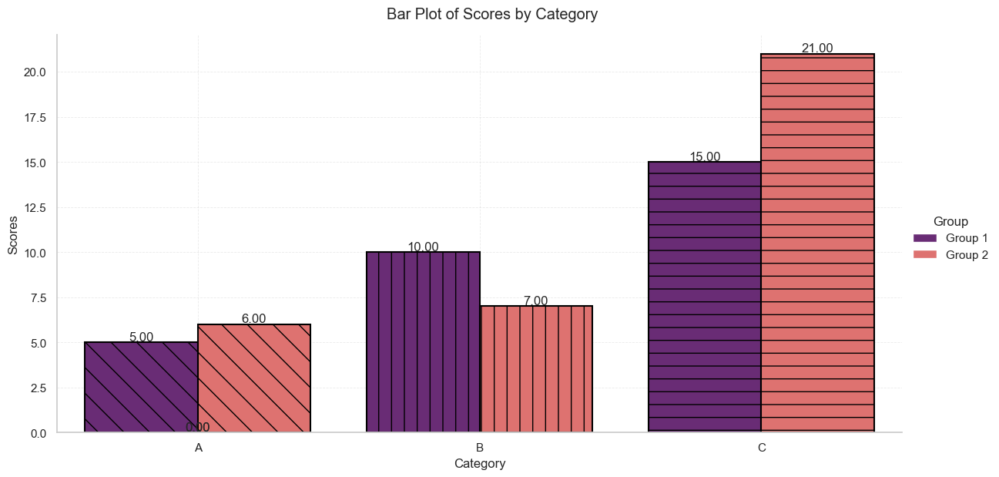

In [62]:
data = {
    'Category': ['A', 'A', 'B', 'B', 'C', 'C'],
    'Scores': [5, 6, 10, 7, 15, 21],
    'Group': ['Group 1', 'Group 2', 'Group 1', 'Group 2', 'Group 1', 'Group 2']
}
df = pd.DataFrame(data)

cat_plot(data=df, x="Category", y="Scores", hue="Group",kind='bar')

In [80]:
def cat_plot_all_column(categorical_features,df,out_column):
    col_wrap_value = len(categorical_features)
    for categorical_feature in categorical_features:
        cat_plot(data=df, x=out_column,hue=out_column, col=categorical_feature,kind='count', col_wrap=col_wrap_value,grid=False,figsize=(12, 10))

In [81]:
df=pd.read_csv("bank.csv")
numerical_features=df.select_dtypes(include='number')
categorical_features=['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']

<Figure size 1200x1000 with 0 Axes>

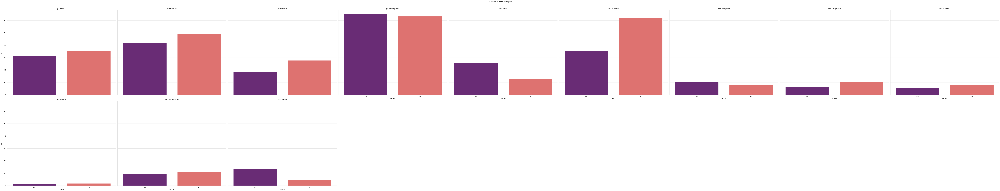

<Figure size 1200x1000 with 0 Axes>

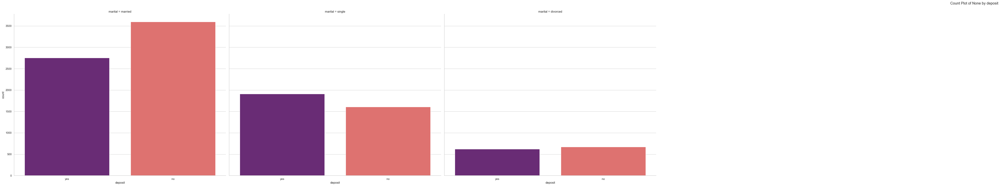

<Figure size 1200x1000 with 0 Axes>

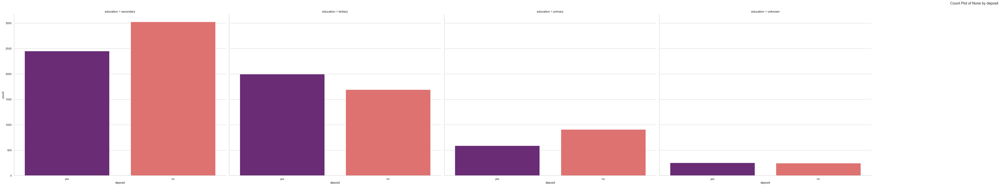

<Figure size 1200x1000 with 0 Axes>

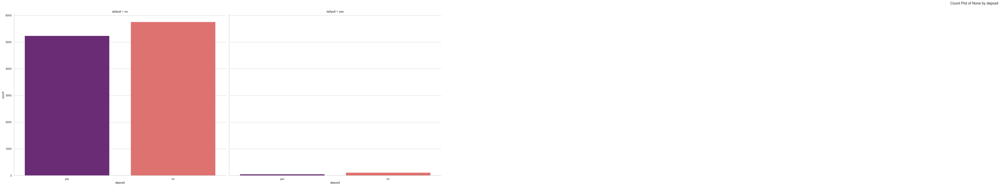

<Figure size 1200x1000 with 0 Axes>

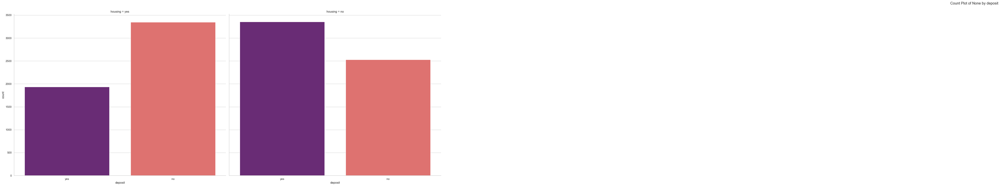

<Figure size 1200x1000 with 0 Axes>

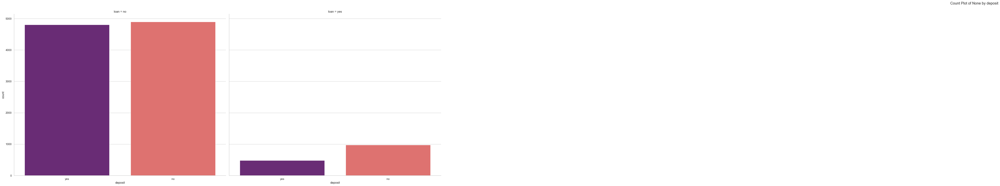

<Figure size 1200x1000 with 0 Axes>

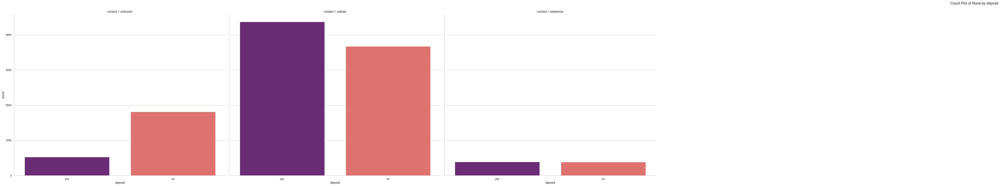

<Figure size 1200x1000 with 0 Axes>

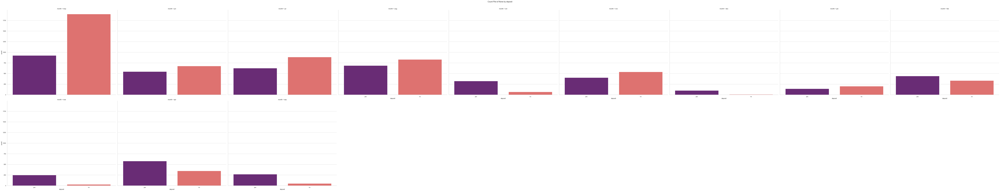

<Figure size 1200x1000 with 0 Axes>

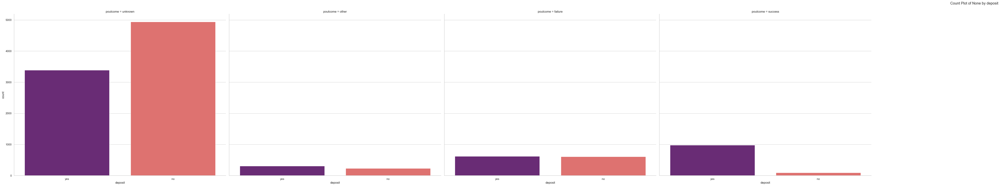

In [82]:
out_column = 'deposit'
cat_plot_all_column(categorical_features,df,out_column)

# FacetGrid

### Seaborn

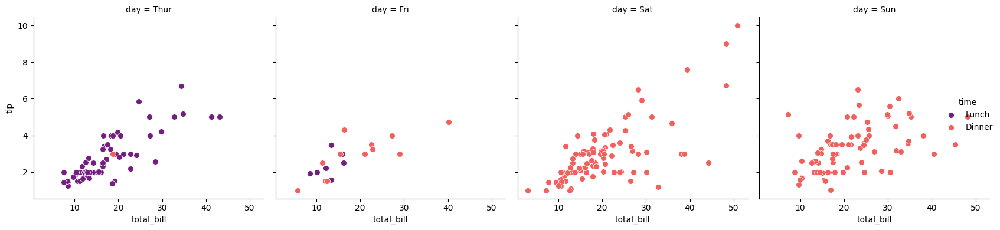

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def facet_grid_seaborn(data, x, y, hue=None, col=None, row=None, height=3, aspect=1.5, palette='magma', kind='scatter', **kwargs):
    """
    Create a custom FacetGrid with easy customization.
    
    Parameters:
    - data: DataFrame
    - x, y: column names for x and y axes
    - hue, col, row: optional column names for additional dimensions
    - height: height of each facet in inches
    - aspect: aspect ratio of each facet
    - palette: color palette for the plot
    - kind: type of plot ('scatter', 'line', 'bar', etc.)
    - **kwargs: additional arguments to pass to the plotting function
    
    Returns:
    - g: FacetGrid object
    """
    g = sns.FacetGrid(data, col=col, row=row, hue=hue, height=height, aspect=aspect, palette=palette)
    
    if kind == 'scatter':
        g.map(sns.scatterplot, x, y, **kwargs)
    elif kind == 'line':
        g.map(sns.lineplot, x, y, **kwargs)
    elif kind == 'bar':
        g.map(sns.barplot, x, y, **kwargs)
    elif kind == 'hist':
        g.map(sns.histplot, x, **kwargs)
    elif kind == 'kde':
        g.map(sns.kdeplot, x, y, **kwargs)
    else:
        raise ValueError(f"Plot kind '{kind}' is not supported. Use 'scatter', 'line', 'bar', 'hist', or 'kde'.")
    
    g.add_legend()
    plt.tight_layout()
    return g


df = sns.load_dataset('tips')

g = facet_grid_seaborn(df, x='total_bill', y='tip', hue='time', col='day', kind='scatter', height=4, aspect=1, palette='magma', s=50)
plt.show()

# g = facet_grid_seaborn(df, x='total_bill', y='tip', hue='time', col='day', kind='line', height=4, aspect=1, palette='deep')
# plt.show()

# Bie_chart

### Matplot and Seaborn

In [808]:
def pie_chart(
    labels: List[str],
    sizes: List[float],
    explode: Optional[Tuple[float, ...]] = None,
    palette: str = 'magma',
    shadow: bool = True,
    startangle: int = 90,
    title: Optional[str] = None,
    figsize: Tuple[int, int] = (10, 7),
    wedge_linewidth: float = 1.0,
    wedge_edgecolor: str = 'black',
    text_color: str = 'black',
    text_size: int = 8,
    text_weight: str = 'bold',
    legend_title: str = 'Legend',
    legend_loc: str = 'best',
    legend_bbox_to_anchor: Tuple[float, float, float, float] = (1, 0, 0, 1)
):
    """
    Generates a pie chart with the given parameters.

    Parameters:
    ---------
    labels (List[str]): A list of labels for the pie chart slices.
    sizes (List[float]): A list of sizes for each pie chart slice.
    explode (Optional[Tuple[float, ...]]): A tuple indicating the fraction of the radius with which to offset each wedge.
    palette (str): The color palette to use for the pie chart.
    shadow (bool): Whether to draw a shadow beneath the pie chart.
    startangle (int): The starting angle for the pie chart.
    title (Optional[str]): The title of the pie chart.
    figsize (Tuple[int, int]): The size of the figure.
    wedge_linewidth (float): The linewidth of the pie chart wedges.
    wedge_edgecolor (str): The edge color of the pie chart wedges.
    text_color (str): The color of the text labels.
    text_size (int): The size of the text labels.
    text_weight (str): The weight of the text labels.
    legend_title (str): The title of the legend.
    legend_loc (str): The location of the legend.
    legend_bbox_to_anchor (Tuple[float, float, float, float]): The bounding box anchor for the legend.
    
    Example:
    -------
    >>> pie_chart(labels=cars, sizes=data, title="Customized Car Sales Pie Chart")
    
    Returns:
    -------
    None
    """
    
    # Sample colors from the chosen palette
    colors = sns.color_palette(palette, len(labels))
    
    # Set default title if not provided
    if title is None:
        title = 'Pie Chart'
    
    # Generate random explode values if not provided
    if explode is None:
        random_list = []
        for _ in range(len(labels)):
            rand_num = random.random()
            if rand_num < 0.5:
                random_list.append(0)
            else:
                random_list.append(round(random.uniform(0.1, 0.3), 1))
        explode = tuple(random_list)

    # Function to format the percentages and absolute values on the pie chart
    def func(pct: float, allvalues: List[float]) -> str:
        absolute = int(pct / 100. * np.sum(allvalues))
        return f"{pct:.2f}%\n({absolute:d})"

    # Create a figure and axis for the pie chart
    fig, ax = plt.subplots(figsize=figsize)
    
    # Properties for the pie chart wedges
    wedge_props = {'linewidth': wedge_linewidth, 'edgecolor': wedge_edgecolor}
    
    # Plot the pie chart
    wedges, texts, autotexts = ax.pie(
        sizes,
        explode=explode,
        labels=labels,
        colors=colors,
        autopct=lambda pct: func(pct, sizes),
        shadow=shadow,
        startangle=startangle,
        wedgeprops=wedge_props,
        textprops=dict(color=text_color)
    )

    # Add a legend to the pie chart
    ax.legend(wedges, labels, title=legend_title, loc=legend_loc, bbox_to_anchor=legend_bbox_to_anchor)
    
    # Set properties for the text on the pie chart
    plt.setp(autotexts, size=text_size, weight=text_weight)
    
    # Set the title of the pie chart
    ax.set_title(title)
    
    # Display the pie chart
    plt.show()



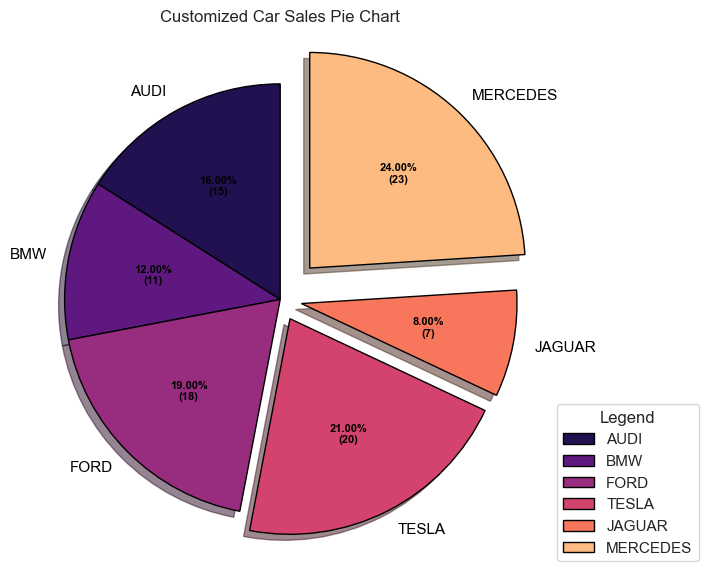

In [809]:
# Example usage:
cars = ['AUDI', 'BMW', 'FORD', 'TESLA', 'JAGUAR', 'MERCEDES']
data = [16, 12, 19, 21, 8, 24]

pie_chart(labels=cars, sizes=data, title="Customized Car Sales Pie Chart")

## plotly express

In [33]:
def pie_chart_plotly(
    labels: List[str],
    sizes: List[float],
    title: Optional[str] = None,
    color_sequence: Optional[List[str]] = None,
    hole: float = 0,
    pull: Optional[List[float]] = None,
    text_info: str = 'percent+label',
    text_position: str = 'inside',
    opacity: float = 0.8,
    width: int = 800,
    height: int = 600
):
    """
    Generates an interactive pie chart using Plotly Express.

    Parameters:
    ---------
    labels (List[str]): A list of labels for the pie chart slices.
    sizes (List[float]): A list of sizes for each pie chart slice.
    title (Optional[str]): The title of the pie chart.
    color_sequence (Optional[List[str]]): A list of colors for the pie chart slices.
    hole (float): The size of the hole in the middle of the pie chart (0 to 1).
    pull (Optional[List[float]]): A list of values to pull slices out from the center.
    text_info (str): The information to display on the slices.
    text_position (str): The position of the text on the slices.
    opacity (float): The opacity of the pie chart slices.
    width (int): The width of the figure in pixels.
    height (int): The height of the figure in pixels.
    
    Example:
    -------
    >>> pie_chart_plotly(labels=cars, sizes=data, title="Customized Car Sales Pie Chart")
    
    Returns:
    -------
    plotly.graph_objs._figure.Figure
    """
    
    # Create a DataFrame from the labels and sizes
    df = pd.DataFrame({'labels': labels, 'sizes': sizes})
    
    # Set default title if not provided
    if title is None:
        title = 'Pie Chart'
    
    # Generate random pull values if not provided
    if pull is None:
        pull = [random.uniform(0, 0.2) if random.random() > 0.5 else 0 for _ in range(len(labels))]

    # Create the pie chart
    fig = px.pie(
        df,
        values='sizes',
        names='labels',
        title=title,
        color_discrete_sequence=color_sequence,
        hole=hole,
        opacity=opacity
    )

    # Update the layout and traces
    fig.update_traces(
        textposition=text_position,
        textinfo=text_info,
        pull=pull
    )

    fig.update_layout(
        width=width,
        height=height
    )

    return fig


cars = ['AUDI', 'BMW', 'FORD', 'TESLA', 'JAGUAR', 'MERCEDES']
data = [16, 12, 19, 21, 8, 24]

pie_chart_plotly(labels=cars, sizes=data, title="Customized Car Sales Pie Chart")

# Histogram

### Matplot

In [87]:
def plot_single_histogram_matplotlib(col_data, col_name=None, palette: str = 'magma',bins=20, edgecolor='black', alpha=0.8, histtype:Literal['bar', 'barstacked', 'step', 'stepfilled']='bar', orientation='vertical') -> None:
        """Plot a histogram for a single column."""
        if col_name is None:
                col_name = 'histogram'
        plt.figure(figsize=(8, 6))
        color = random.sample(sns.color_palette(palette), 1)
        plt.hist(col_data, color=color, label=col_name,bins=bins,edgecolor=edgecolor,alpha=alpha,histtype=histtype,orientation=orientation)
        plt.title(col_name)
        plt.legend(loc='best', fontsize='small')
        plt.suptitle(f"Histogram for {col_name}", size=20)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()



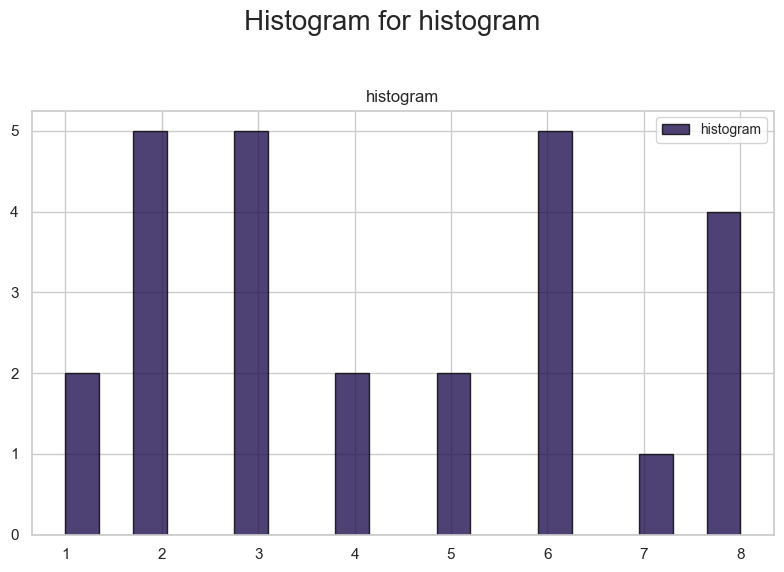

In [88]:
x = [1,1,2,2,2,2,2,3,3,3,3,3,4,4,5,5,6,6,6,6,6,7,8,8,8,8]
plot_single_histogram_matplotlib(x)

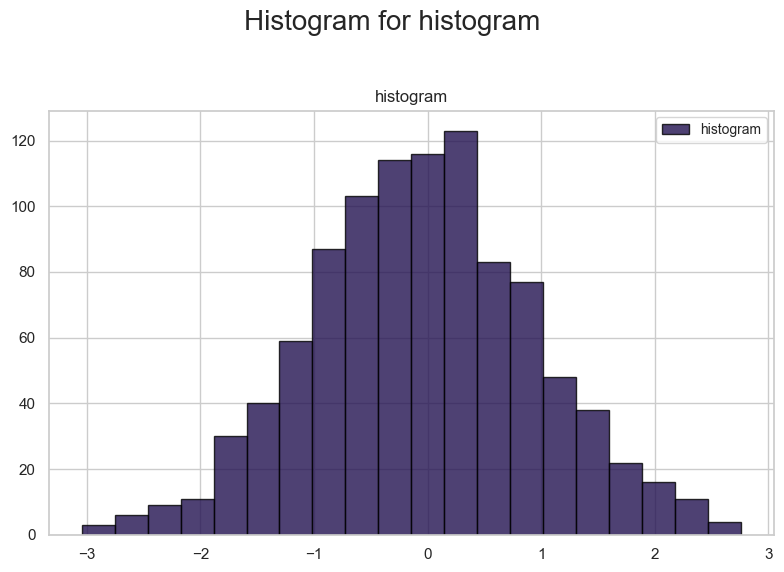

In [812]:
np.random.seed(0)
data = np.random.normal(loc=0, scale=1, size=1000)
plot_single_histogram_matplotlib(data)

In [84]:
def plot_histograms_matplotlib(df: pd.DataFrame, column: Optional[Union[str, None]] = None, save_plots: bool = False, palette: str = 'magma',
                    bins: Optional[Union[int, list]] = None, edgecolor: str = 'black', alpha: float = 0.9, 
                    histtype: Literal['bar', 'barstacked', 'step', 'stepfilled'] = 'bar', orientation: str = 'vertical') -> None:
    """
    Plots histograms for numerical columns in the dataframe.
    
    Parameters:
    ----------
    df (pd.DataFrame): The input dataframe.
    column (Union[str, None], optional): The specific column to plot. If None, plot all numerical columns.
    save_plots (bool, optional): Whether to save the plots as images. Default is False.
    palette (str, optional): The color palette to use for the plots. Default is 'magma'.
    bins (Union[int, list], optional): Number of bins or bin edges for the histogram. Default is None.
    edgecolor (str, optional): Color of the edge of the bins. Default is 'black'.
    alpha (float, optional): Transparency level of the bins. Default is 0.8.
    histtype (Literal['bar', 'barstacked', 'step', 'stepfilled'], optional): Type of histogram to draw. Default is 'bar'.
    orientation (str, optional): Orientation of the histogram. Default is 'vertical'.
    
    Examples:
    >>> plot_histograms(penguins, bins=30)
    >>> plot_histograms(penguins,'flipper_length_mm', bins=30)
    
    Returns:
    None
    """
    
    def plot_single_histogram(col_data: pd.Series, col_name: str, color: str) -> None:
        """
        Plot a histogram for a single column.
        
        Parameters:
        col_data (pd.Series): Data of the column to plot.
        col_name (str): Name of the column.
        color (str): Color for the histogram.
        
        Returns:
        None
        """
        plt.figure(figsize=(8, 6))
        plt.hist(col_data, color=color, label=col_name, bins=bins, edgecolor=edgecolor, alpha=alpha, histtype=histtype, orientation=orientation)
        plt.title(f"Histogram for {col_name}")
        plt.legend(loc='best', fontsize='small')
        plt.suptitle(f"Histogram for {col_name}", size=20)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        if save_plots:
            plt.savefig(f"histogram_{col_name}.png")
        plt.show()
    
    def plot_all_histograms(numerical_cols: pd.DataFrame) -> None:
        """
        Plot histograms for all numerical columns.
        
        Parameters:
        numerical_cols (pd.DataFrame): Dataframe containing only numerical columns.
        
        Returns:
        None
        """
        num_columns = len(numerical_cols.columns)
        ncols = int(np.ceil(np.sqrt(num_columns)))
        nrows = int(np.ceil(num_columns / ncols))
        colors = sns.color_palette(palette, num_columns)

        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 12))
        for index, col in enumerate(numerical_cols.columns):
            ax = axes.flatten()[index]
            ax.hist(df[col], color=colors[index], label=col, bins=bins, edgecolor=edgecolor, alpha=alpha, histtype=histtype, orientation=orientation)
            ax.set_title(col)
            ax.legend(loc='best', fontsize='small')

        # Remove empty subplots
        for i in range(num_columns, nrows * ncols):
            fig.delaxes(axes.flatten()[i])

        plt.suptitle("Histograms of Numerical Columns", size=20)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        if save_plots:
            plt.savefig("all_histograms.png")
        plt.show()
    
    try:
        # Select numerical columns from the dataframe
        numerical_columns = df.select_dtypes(include=['int64', 'float64'])
        
        # Check if a specific column is provided
        if column is None or column.lower() == 'all':
            # Plot histograms for all numerical columns
            plot_all_histograms(numerical_columns)
        else:
            if column in numerical_columns.columns:
                # Plot histogram for the specified column
                color = sns.color_palette(palette, 1)[0]
                plot_single_histogram(df[column], column, color)
            else:
                print(f"Column '{column}' is not a numerical column in the dataframe.")
    except Exception as e:
        print(f"An error occurred: {e}")



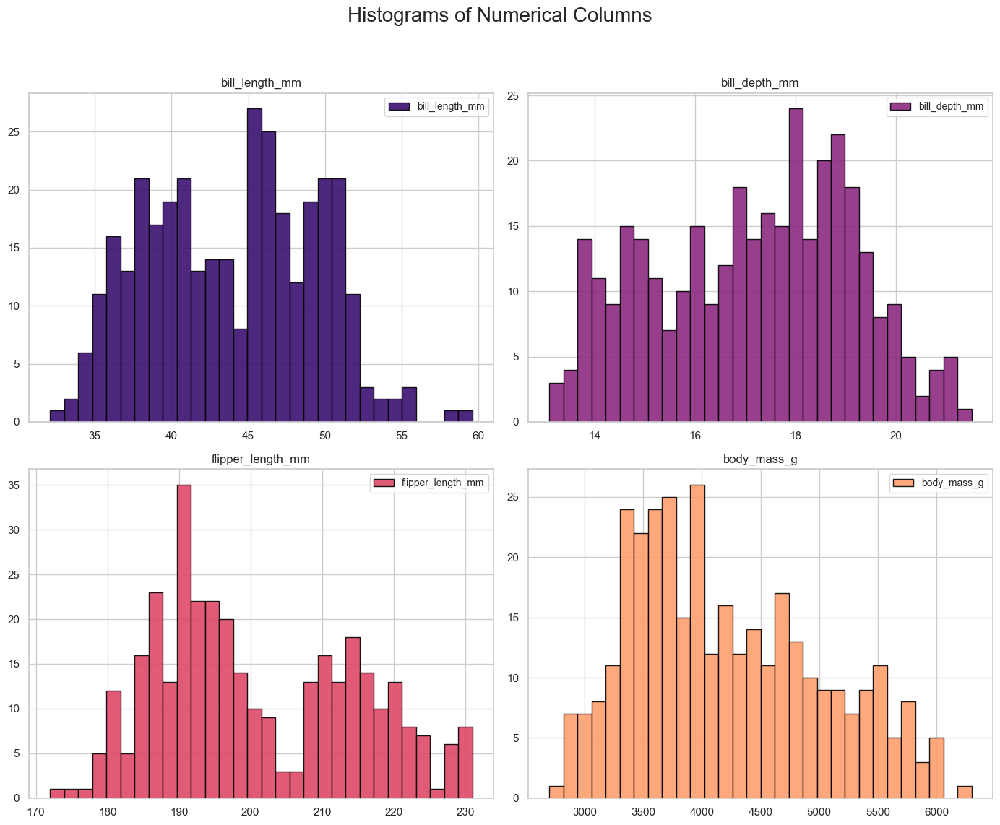

In [85]:
penguins = sns.load_dataset("penguins")
plot_histograms_matplotlib(penguins, bins=30)

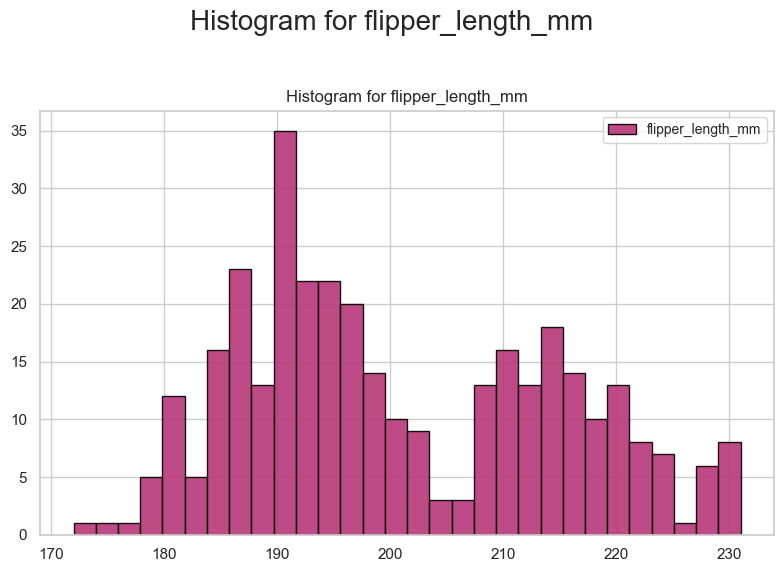

In [86]:
plot_histograms_matplotlib(penguins,'flipper_length_mm', bins=30)

### Seaborn

In [815]:
def plot_single_histogram_seaborn(df, x=None, y=None,hue=None, palette: str = 'viridis',color=None, kde:bool=True,bins=20, edgecolor='black', alpha=0.8, multiple: Literal['layer', 'dodge', 'stack', 'fill']='layer', orientation='vertical',legend_title=None,title=None) -> None:
        """Plot a histogram for a single column."""
        df= pd.DataFrame(df)
        if color is None:
                colors = random.sample(sns.color_palette(palette), 1)[0]
        else:
                colors = color
        plt.figure(figsize=(8, 6))
        sns.histplot(data=df, x=x, y=y, hue=hue,color=colors,kde=kde, bins=bins, edgecolor=edgecolor, alpha=alpha, multiple=multiple)
        plt.legend(legend_title if legend_title else ['hist'],loc='best')
        plt.title(title if title else 'hist', size=20)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        plt.show()



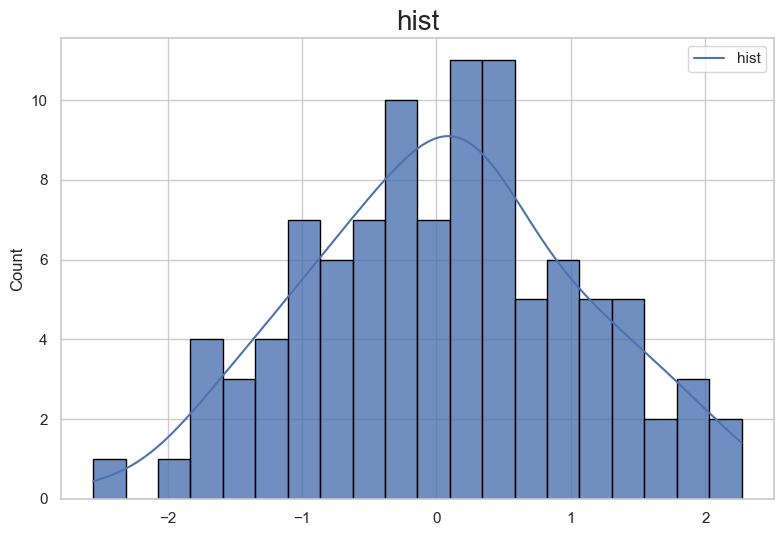

In [816]:
np.random.seed(0)
data = np.random.normal(loc=0, scale=1, size=100)

plot_single_histogram_seaborn(data,color='red')

In [817]:
def plot_histograms_seaborn(df: pd.DataFrame, column: Optional[Union[str, None]] = None, save_plots: bool = False, palette: str = 'magma',
                            bins: Optional[Union[int, list]] = None, edgecolor: str = 'black', alpha: float = 0.9, kde: bool = True,
                            multiple: Literal['layer', 'dodge', 'stack', 'fill'] = 'layer') -> None:
    """
    Plots histograms for numerical columns in the dataframe using Seaborn.
    
    Parameters:
    ----------
    df (pd.DataFrame): The input dataframe.
    column (Union[str, None], optional): The specific column to plot. If None, plot all numerical columns.
    save_plots (bool, optional): Whether to save the plots as images. Default is False.
    palette (str, optional): The color palette to use for the plots. Default is 'magma'.
    bins (Union[int, list], optional): Number of bins or bin edges for the histogram. Default is None.
    edgecolor (str, optional): Color of the edge of the bins. Default is 'black'.
    alpha (float, optional): Transparency level of the bins. Default is 0.9.
    kde (bool, optional): Whether to plot a KDE. Default is True.
    multiple (Literal['layer', 'dodge', 'stack', 'fill'], optional): How to plot multiple elements. Default is 'layer'.
    
    Examples:
    >>> plot_histograms_seaborn(penguins, bins=30)
    >>> plot_histograms_seaborn(penguins,"body_mass_g", bins=30)
    
    Returns:
    -------
    None
    """
    
    def plot_single_histogram(col_data: pd.Series, col_name: str, color: str) -> None:
        plt.figure(figsize=(8, 6))
        sns.histplot(col_data, kde=kde, color=color, bins=bins, edgecolor=edgecolor, alpha=alpha, multiple=multiple)
        plt.title(f"Histogram for {col_name}")
        plt.tight_layout()
        if save_plots:
            plt.savefig(f"histogram_{col_name}.png")
        plt.show()
    
    def plot_all_histograms(numerical_cols: pd.DataFrame) -> None:
        num_columns = len(numerical_cols.columns)
        ncols = int(np.ceil(np.sqrt(num_columns)))
        nrows = int(np.ceil(num_columns / ncols))
        colors = sns.color_palette(palette, num_columns)

        fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 12))
        for index, col in enumerate(numerical_cols.columns):
            ax = axes.flatten()[index]
            sns.histplot(df[col], kde=kde, color=colors[index], bins=bins, edgecolor=edgecolor, alpha=alpha, multiple=multiple, ax=ax)
            ax.set_title(col)

        # Remove empty subplots
        for i in range(num_columns, nrows * ncols):
            fig.delaxes(axes.flatten()[i])

        plt.suptitle("Histograms of Numerical Columns", size=20)
        plt.tight_layout(rect=[0, 0.03, 1, 0.95])
        if save_plots:
            plt.savefig("all_histograms.png")
        plt.show()
    
    try:
        numerical_columns = df.select_dtypes(include=['int64', 'float64'])
        
        if column is None or column.lower() == 'all':
            plot_all_histograms(numerical_columns)
        else:
            if column in numerical_columns.columns:
                color = sns.color_palette(palette, 1)[0]
                plot_single_histogram(df[column], column, color)
            else:
                print(f"Column '{column}' is not a numerical column in the dataframe.")
    except Exception as e:
        print(f"An error occurred: {e}")




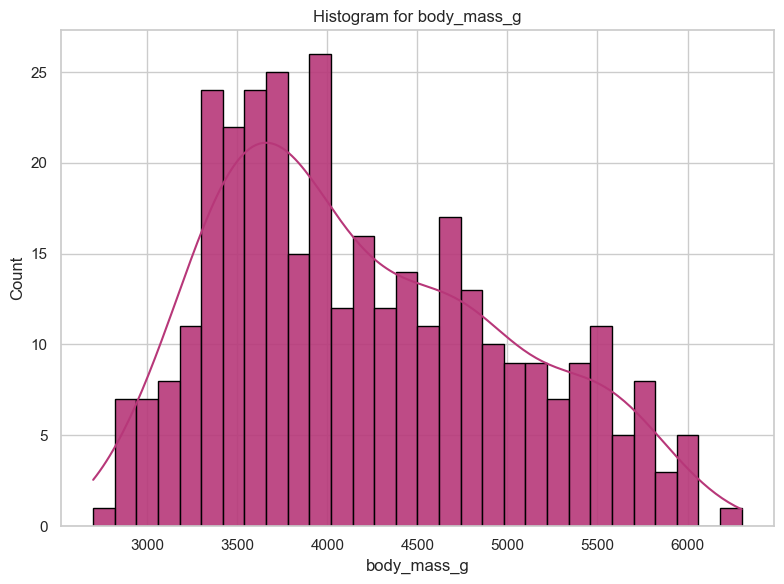

In [818]:
penguins = sns.load_dataset("penguins")
plot_histograms_seaborn(penguins,"body_mass_g", bins=30)

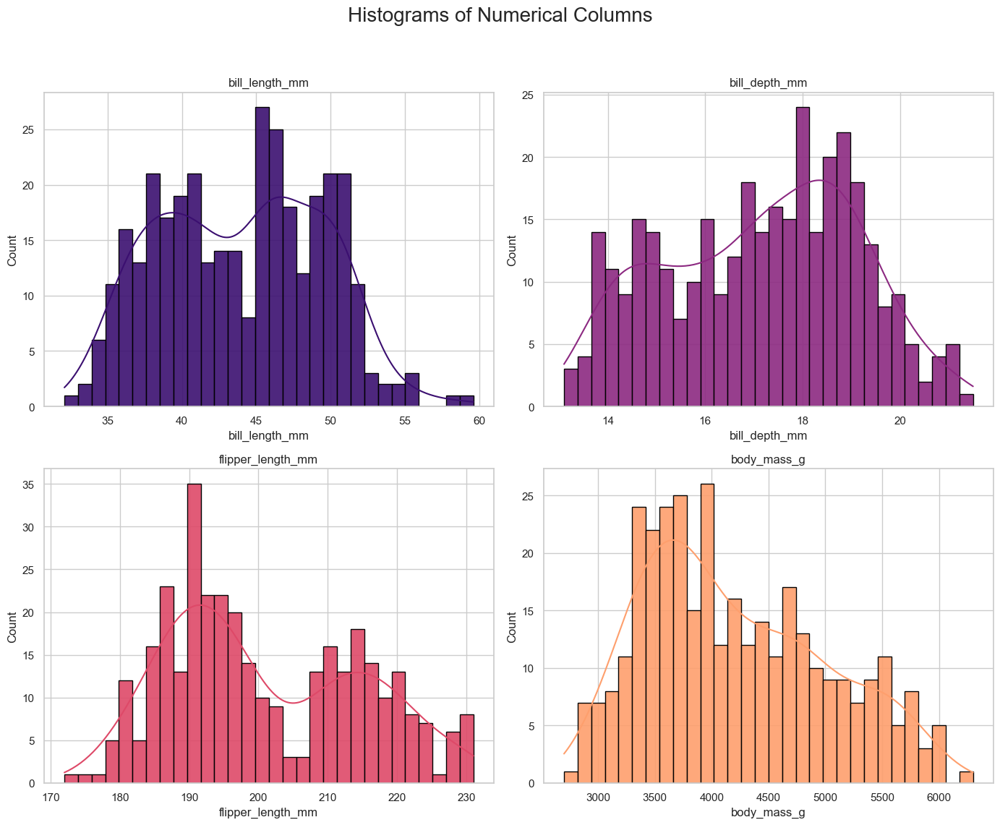

In [819]:
penguins = sns.load_dataset("penguins")
plot_histograms_seaborn(penguins, bins=30)

## plotly express

In [29]:
def plot_histograms_plotly(
    df: pd.DataFrame, 
    column: Optional[Union[str, List[str]]] = None, 
    bins: Optional[Union[int, List[int]]] = None,
    color: Optional[str] = None,
    barmode: str = 'overlay',
    histnorm: Optional[str] = None,
    opacity: float = 0.7,
    title: Optional[str] = None,
    width: int = 800,
    height: int = 600
):
    """
    Plots histograms for numerical columns in the dataframe using Plotly Express.
    
    Parameters:
    ----------
    df (pd.DataFrame): The input dataframe.
    column (Union[str, List[str], None], optional): The specific column(s) to plot. If None, plot all numerical columns.
    bins (Union[int, List[int]], optional): Number of bins for the histogram. Default is None.
    color (str, optional): Column to use for color encoding.
    barmode (str, optional): How to display multiple histograms. Options: 'overlay', 'stack', 'group'. Default is 'overlay'.
    histnorm (str, optional): Normalization method. Options: '', 'percent', 'probability', 'density'. Default is None.
    opacity (float, optional): Opacity of the bars. Default is 0.7.
    title (str, optional): Title of the plot. Default is None.
    width (int, optional): Width of the figure in pixels. Default is 800.
    height (int, optional): Height of the figure in pixels. Default is 600.
    
    Examples:
    >>> plot_histograms_plotly(penguins, bins=30)
    >>> plot_histograms_plotly(penguins, "body_mass_g", bins=30)
    
    Returns:
    -------
    plotly.graph_objs._figure.Figure
    """
    
    # Select numerical columns
    numerical_columns = df.select_dtypes(include=['int64', 'float64'])
    
    if column is None:
        column = numerical_columns.columns.tolist()
    elif isinstance(column, str):
        column = [column]
    
    # Validate column existence
    for col in column:
        if col not in df.columns:
            raise ValueError(f"Column '{col}' does not exist in the DataFrame.")
    
    # Create the histogram
    fig = px.histogram(
        df,
        x=column,
        color=color,
        barmode=barmode,
        histnorm=histnorm,
        opacity=opacity,
        nbins=bins,
        title=title or f"Histogram of {', '.join(column)}",
    )
    
    # Update layout
    fig.update_layout(
        width=width,
        height=height,
        bargap=0.1,
    )
    
    return fig



# Example usage:
# fig = plot_histograms_plotly(penguins, ["body_mass_g", "flipper_length_mm"], bins=30)
# fig.show()

penguins = sns.load_dataset("penguins")
plot_histograms_plotly(penguins, "flipper_length_mm", bins=30)

### pandas

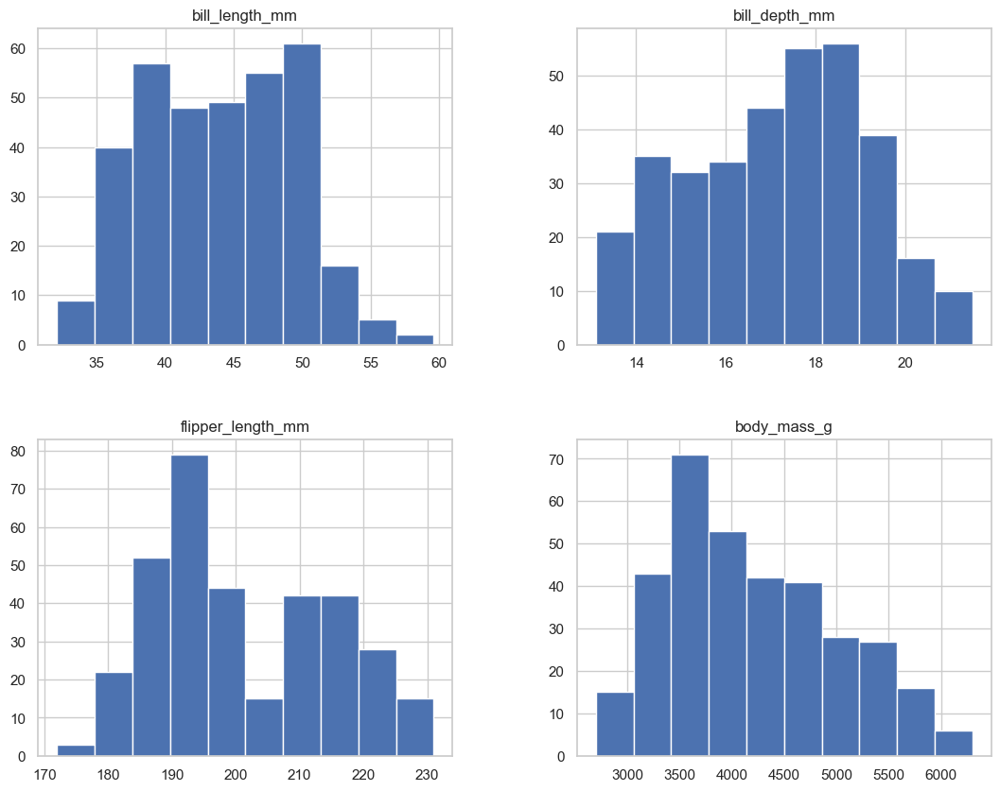

In [820]:
penguins.hist(figsize=(13,10))
plt.show()

# kdeplot

### Seaborn

In [821]:
def kde_plot(
    data,
    x=None,
    y=None,
    fill=False,
    palette='magma',
    color=None,
    linewidth=1.5,
    linestyle='-',
    bw_adjust=1,
    cut=3,
    clip=None,
    xlabel=None,
    ylabel=None,
    title=None,
    legend=True,
    figsize=(10, 6),
    ax=None
):
    """
    Creates a customized KDE plot using seaborn's kdeplot function.
    
    Parameters:
    ----------
    - data (array-like, Series, or DataFrame): Input data.
    - x (str or array-like): Variables for x-axis.
    - y (str or array-like): Variables for y-axis (for 2D KDE).
    - shade (bool): Whether to shade the KDE (default is False).
    - color (str or list): Color(s) for the KDE line(s).
    - linewidth (float): Width of the KDE line.
    - linestyle (str): Style of the KDE line.
    - bw_adjust (float): Factor to adjust the default bandwidth.
    - cut (float): Factor to extend the KDE beyond data range.
    - clip (tuple or None): Data range to restrict KDE.
    - xlabel (str): Label for x-axis.
    - ylabel (str): Label for y-axis.
    - title (str): Title of the plot.
    - legend (bool): Whether to show legend (for multiple plots).
    - figsize (tuple): Figure size.
    - ax (matplotlib axis): Existing axis to plot on.
    
    Examples:
    >>> kde_plot(data, color='purple', linewidth=2, bw_adjust=0.5, xlabel='Value', ylabel='Density', title='Custom KDE Plot')
    >>> kde_plot(penguins, 'bill_depth_mm', fill=True, linestyle='--', linewidth=2, bw_adjust=0.5, xlabel='Value', ylabel='Density', title='Custom KDE Plot')
    
    Returns:
    -------
    - matplotlib axis
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    
    if color is None:
        color = random.sample(sns.color_palette(palette), 1)[0]
    
    if xlabel is None:
        xlabel = 'xlabel'
    
    if ylabel is None:
        ylabel = 'ylabel'
    
    if title is None:
        title = 'title'
    
    sns.kdeplot(
        data=data,
        x=x,
        y=y,
        fill=fill,
        color=color,
        linewidth=linewidth,
        linestyle=linestyle,
        bw_adjust=bw_adjust,
        cut=cut,
        clip=clip,
        ax=ax,
        legend=legend
    )
    
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    if title:
        ax.set_title(title)
    plt.show()



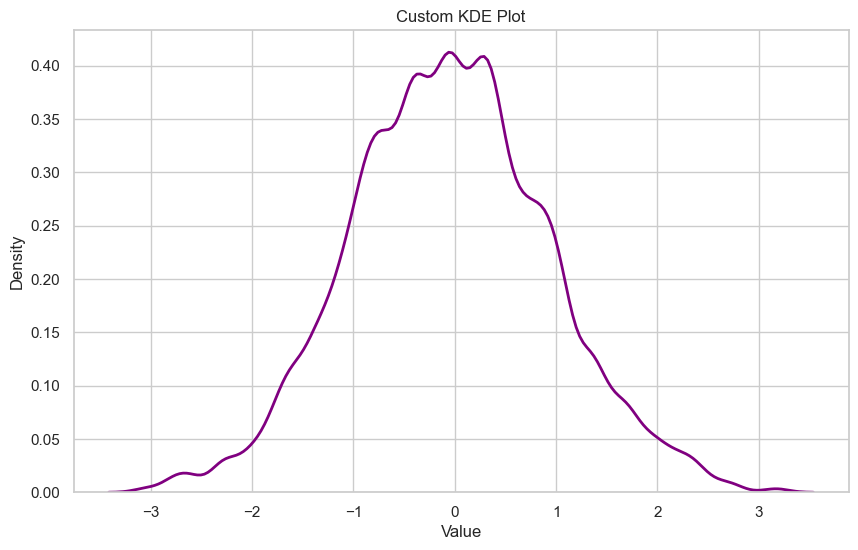

In [822]:
data = np.random.normal(0, 1, 1000)

kde_plot(data, color='purple', linewidth=2, bw_adjust=0.5, xlabel='Value', ylabel='Density', title='Custom KDE Plot')


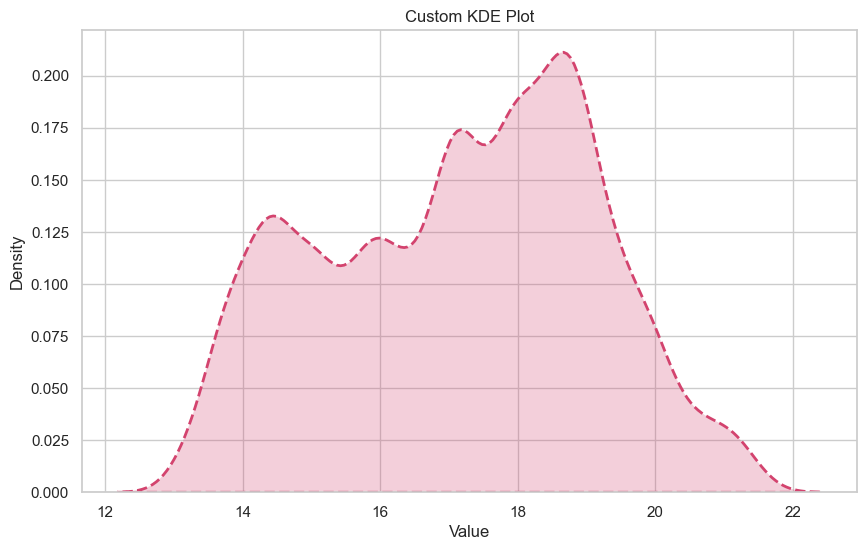

In [823]:
penguins = sns.load_dataset("penguins")

kde_plot(penguins, 'bill_depth_mm', fill=True, linestyle='--', linewidth=2, bw_adjust=0.5, xlabel='Value', ylabel='Density', title='Custom KDE Plot')

# mulite kde plots

In [825]:
def kde_plot_all_column(
    data,
    n_cols=3,
    figsize=(15, 15),
    fill=True,
    palette='magma',
    palette2='viridis',
    color=None,
    linewidth=1.5,
    linestyle='-',
    bw_adjust=1,
    cut=3,
    clip=None,
    title="KDE Plots of Numeric Variables"
):
    """
    Creates KDE plots for all numeric columns in the dataset using subplots.
    
    Parameters:
    ----------
    - data (DataFrame): Input dataframe.
    - n_cols (int): Number of columns in the subplot grid.
    - figsize (tuple): Figure size.
    - shade (bool): Whether to shade the KDE.
    - color (str): Color for the KDE line.
    - linewidth (float): Width of the KDE line.
    - linestyle (str): Style of the KDE line.
    - bw_adjust (float): Factor to adjust the default bandwidth.
    - cut (float): Factor to extend the KDE beyond data range.
    - clip (tuple or None): Data range to restrict KDE.
    - title (str): Overall title for the figure.
    
    Examples:
    >>> kde_plot_all_column(penguins, n_cols=2, fill=False)
    >>> kde_plot_all_column(df, n_cols=3, fill=True,)
    
    Returns:
    -------
    - matplotlib figure
    """
    # Select only numeric columns
    numeric_cols = data.select_dtypes(include=[np.number]).columns
    n_plots = len(numeric_cols)
    
    # Calculate number of rows needed
    n_rows = (n_plots - 1) // n_cols + 1
    
    # get the color for each plot
    if color is None:
        if n_plots <= 6 :
            colors = random.sample(sns.color_palette(palette), n_plots)
        elif n_plots <= 12 :
            colors = random.sample(sns.color_palette(palette) + sns.color_palette(palette2), n_plots)
        elif n_plots > 12 :
            colors = random.choices(sns.color_palette(palette) + sns.color_palette(palette2), k=n_plots)
    else:
        colors = [color] * n_plots
    
    
    # Create subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    fig.suptitle(title, fontsize=16)
    
    # Flatten axes array for easy iteration
    axes = axes.flatten()
    
    for i, col in enumerate(numeric_cols):
        sns.kdeplot(
            data=data[col],
            ax=axes[i],
            fill=fill,
            color=colors[i],
            linewidth=linewidth,
            linestyle=linestyle,
            bw_adjust=bw_adjust,
            cut=cut,
            clip=clip
        )
        axes[i].set_title(f'Density Plot of {col}')
        axes[i].set_xlabel(col)
        axes[i].set_ylabel('Density')
        
    
    # Remove any unused subplots
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    plt.show()



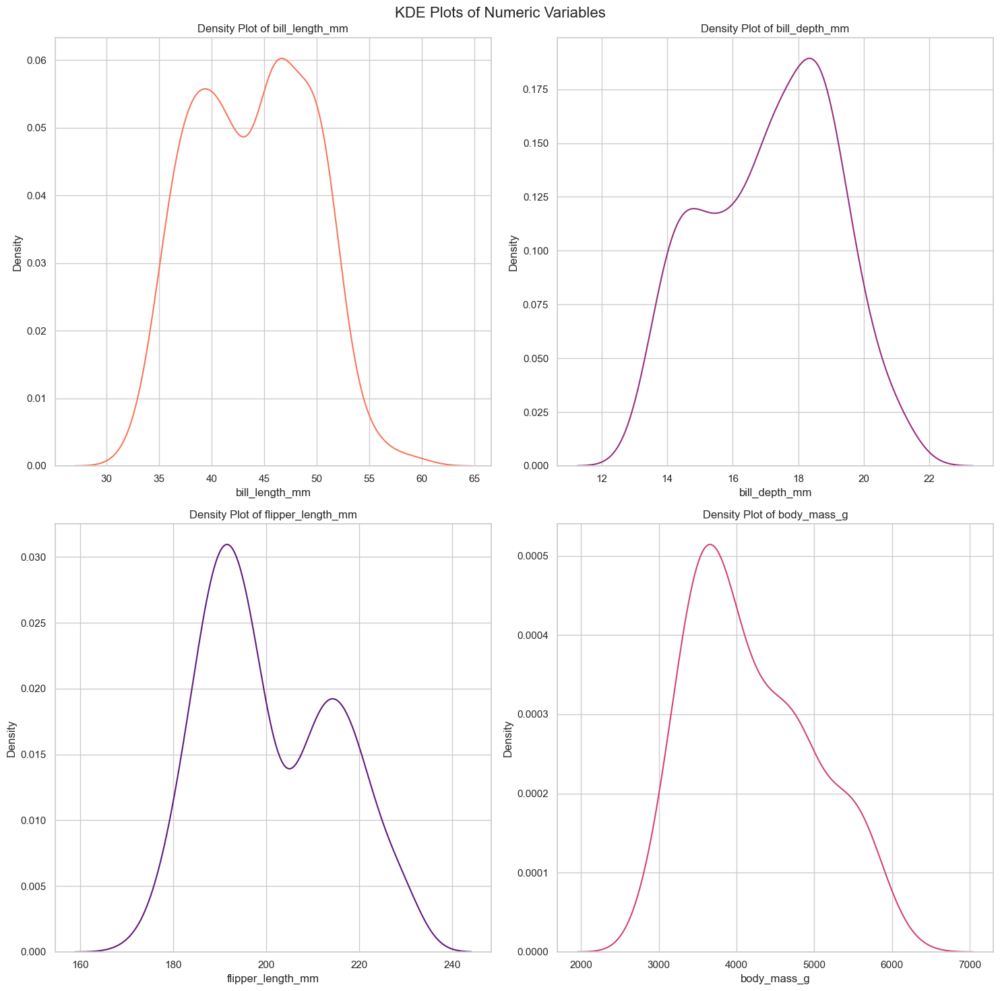

In [826]:
penguins = sns.load_dataset("penguins")
kde_plot_all_column(penguins, n_cols=2, fill=False)

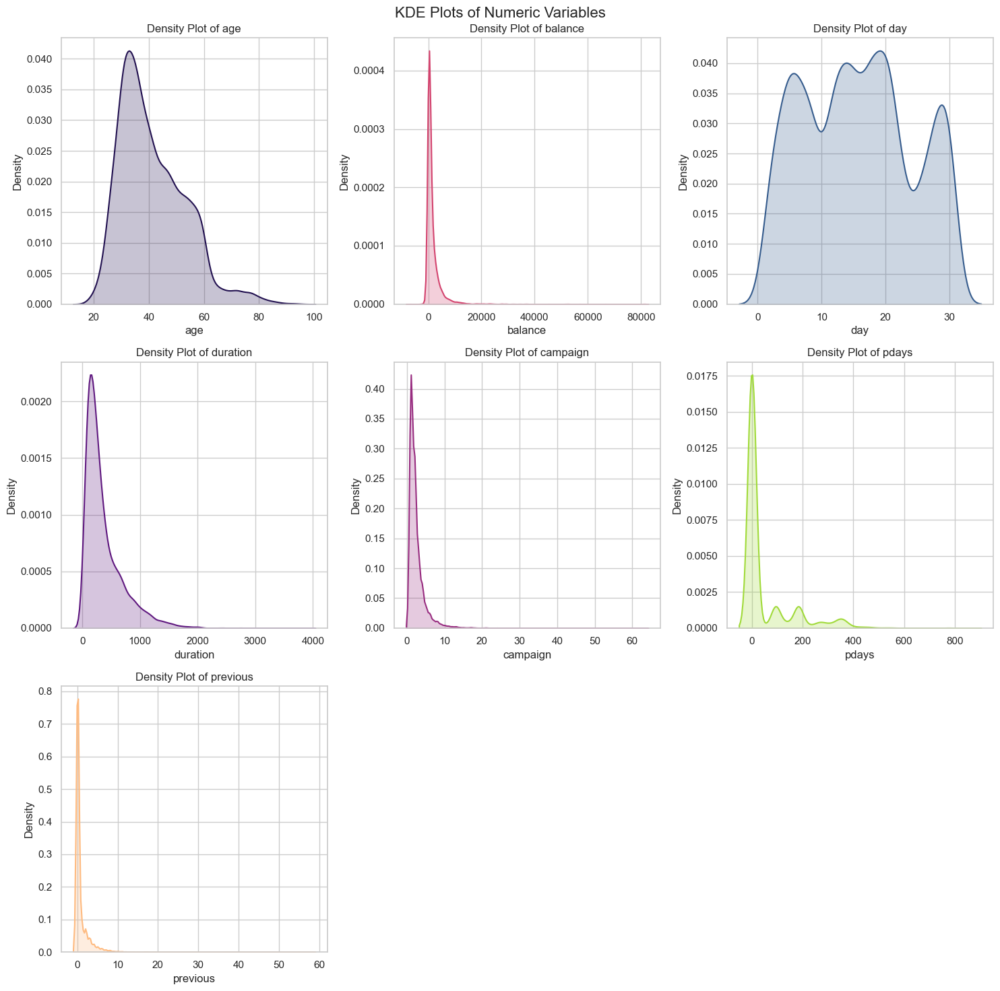

In [827]:
df=pd.read_csv("bank.csv")
kde_plot_all_column(df, n_cols=3, fill=True,)

# countplot
### work in seaborn only
This is essentially the same as barplot except the estimator is explicitly counting the number of occurrences. Which is why we only pass the x value:

In [130]:
def count_plot(df: pd.DataFrame, 
               x: Optional[str] = None, 
               y: Optional[str] = None, 
               hue: Optional[str] = None,
               column_plot: Optional[str] = None,
               palette: str = 'magma', 
               edgecolor: str = 'black', 
               order: bool = False, 
               figsize: tuple = (8, 6), 
               stat: Literal['count', 'percent', 'proportion', 'probability'] = 'count', 
               ax: Optional[plt.Axes] = None) -> plt.Axes:
    """
    Creates a count plot with Seaborn.
    
    Parameters:
    ---------
    - df (pd.DataFrame): The DataFrame containing the data.
    - x (Optional[str]): The column to plot on the x-axis.
    - y (Optional[str]): The column to plot on the y-axis.
    - hue (Optional[str]): The column to use for color encoding.
    - column_plot (Optional[str]): The column to plot. If None, inferred from x or y.
    - palette (str): Color palette to use for the plot.
    - edgecolor (str): Color of the edges of the bars.
    - order (bool): Whether to order the bars by count.
    - figsize (tuple): Size of the figure.
    - stat (Literal['count', 'percent', 'proportion', 'probability']): Statistical representation to plot.
    - ax (Optional[plt.Axes]): Matplotlib Axes object to draw the plot onto, if None a new figure is created.
    
    Examples:
    --------
    >>> count_plot(tips,'size')
    >>> count_plot(tips ,y = 'day',order=True)
    
    Returns:
    -------
    - plt.Axes: The Axes object with the plot.
    """
    
    show = False
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
        show = True
    
    # Infer column to plot if not provided
    if column_plot is None:
        if x is not None:
            column_plot = x
        elif y is not None:
            column_plot = y
        else:
            column_plot = df.iloc[:, -1].name
            x = column_plot

    
    # Validate column existence
    if column_plot not in df.columns:
        raise ValueError(f"The column '{column_plot}' does not exist in the DataFrame.")
    
    # Set default hue if not provided
    if hue is None:
        hue = column_plot
    
    # Determine order of the bars if specified
    order_list = df[column_plot].value_counts().index.tolist() if order else None
    
    # Plot the count plot
    sns.countplot(data=df, x=x, y=y, hue=hue, palette=palette, 
                  order=order_list, edgecolor=edgecolor, ax=ax, stat=stat)
    
    # Add percentages on the bars
    total = len(df[column_plot])
    if y is not None:  # Horizontal bars
        for p in ax.patches:
            width = p.get_width()
            percentage = f'{100 * width / total:.1f}%'
            ax.annotate(percentage, (width, p.get_y() + p.get_height() / 2.), 
                        ha='left', va='center', fontsize=12, color='black', xytext=(0, 0), 
                        textcoords='offset points')
    else:  # Vertical bars
        for p in ax.patches:
            height = p.get_height()
            percentage = f'{100 * height / total:.1f}%'
            ax.annotate(percentage, (p.get_x() + p.get_width() / 2., height), 
                        ha='center', va='bottom', fontsize=12, color='black', xytext=(0, 0), 
                        textcoords='offset points')
    
    # Set axis labels
    if x is not None:
        ax.set_xlabel(x, fontsize=14)
    elif y is not None:
        ax.set_ylabel(y, fontsize=14)
    else:
        ax.set_xlabel(column_plot, fontsize=14)
    
    # Set y-axis label based on stat
    y_label = 'Count' if stat == 'count' else stat.capitalize()
    ax.set_ylabel(y_label, fontsize=14)
    
    # Set plot title
    ax.set_title(f'{stat.capitalize()} Plot of {column_plot}', fontsize=16)
    
    # Style the plot
    ax.grid(True, linestyle='--', linewidth=0.8, alpha=0.3)
    ax.tick_params(axis='both', labelsize=12)
    
    # Show plot if created within the function
    if show:
        plt.show()
    
    return ax



In [131]:
tips = sns.load_dataset('tips')
tips.head()

,total_bill,tip,sex,smoker,day,time,size
0,16.99,1.01,Female,No,Sun,Dinner,2
1,10.34,1.66,Male,No,Sun,Dinner,3
2,21.01,3.50,Male,No,Sun,Dinner,3
3,23.68,3.31,Male,No,Sun,Dinner,2
4,24.59,3.61,Female,No,Sun,Dinner,4


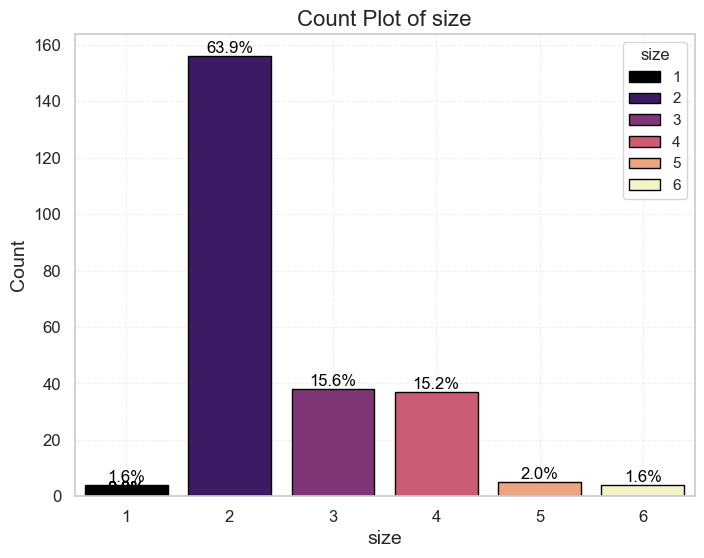

<Axes: title={'center': 'Count Plot of size'}, xlabel='size', ylabel='Count'>

In [132]:
count_plot(tips,'size')

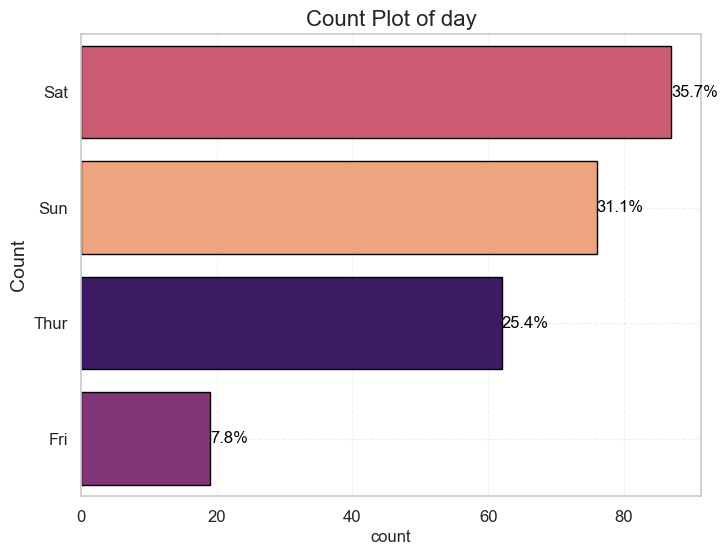

<Axes: title={'center': 'Count Plot of day'}, xlabel='count', ylabel='Count'>

In [127]:
count_plot(tips ,y = 'day',order=True)

In [140]:
def count_plot_all_column(categorical_features, df, vision='h'):
    plt.figure(figsize=(20, 60))
    plotnumber = 1
    if vision == 'h':
        for categorical_feature in categorical_features:
            ax = plt.subplot(12, 3, plotnumber)
            count_plot(y=categorical_feature, df=df, ax=ax)
            plotnumber += 1
    elif vision == 'x' or vision == 'v':
        for categorical_feature in categorical_features:
            ax = plt.subplot(12, 3, plotnumber)
            count_plot(x=categorical_feature, df=df, ax=ax)
            plt.xticks(rotation=45)
            plotnumber += 1
    plt.tight_layout()
    plt.show()



In [141]:
df=pd.read_csv("bank.csv")
numerical_features=df.select_dtypes(include='number')
categorical_features=['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']

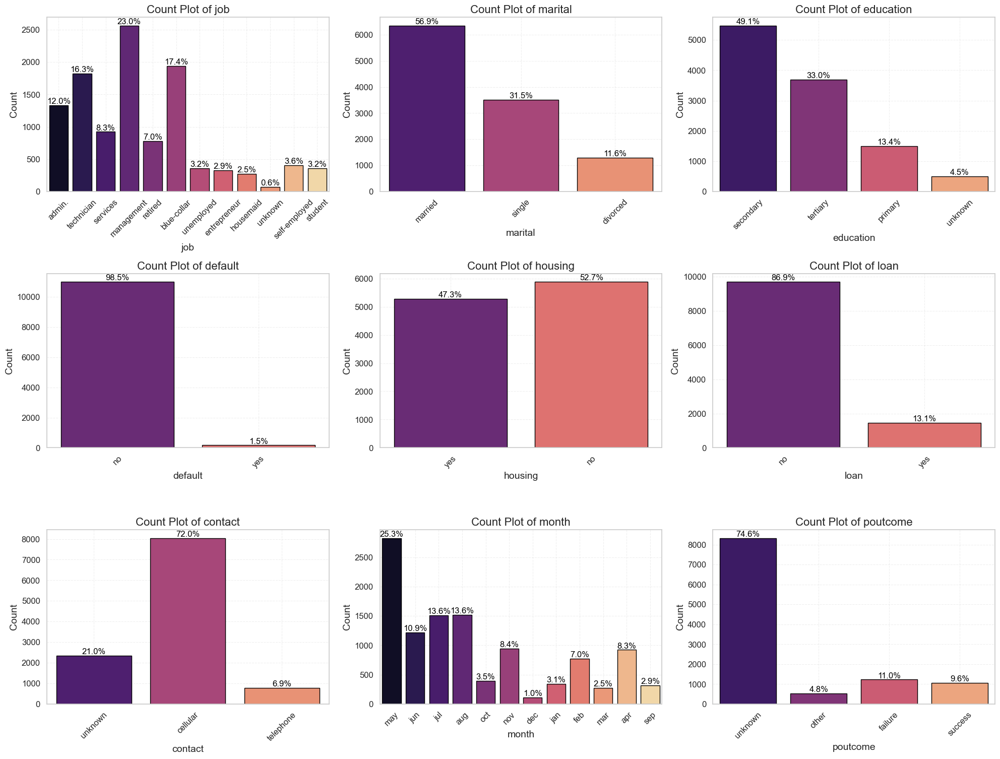

In [144]:
count_plot_all_column(categorical_features, df, vision='x')

## plotly express

In [22]:
def count_plot_plotly(
    df: pd.DataFrame, 
    x: Optional[str] = None, 
    y: Optional[str] = None, 
    color: Optional[str] = None,
    title: Optional[str] = None,
    color_discrete_sequence: Optional[list] = None,
    order: bool = False,
    orientation: Literal['v', 'h'] = 'v',
    width: int = 800,
    height: int = 600,
    text_auto: bool = True
):
    """
    Creates a count plot with Plotly Express.
    
    Parameters:
    ---------
    - df (pd.DataFrame): The DataFrame containing the data.
    - x (Optional[str]): The column to plot on the x-axis.
    - y (Optional[str]): The column to plot on the y-axis.
    - color (Optional[str]): The column to use for color encoding.
    - title (Optional[str]): Title of the plot.
    - color_discrete_sequence (Optional[list]): List of colors for the bars.
    - order (bool): Whether to order the bars by count.
    - orientation (Literal['v', 'h']): Orientation of the plot ('v' for vertical, 'h' for horizontal).
    - width (int): Width of the figure in pixels.
    - height (int): Height of the figure in pixels.
    - text_auto (bool): Whether to show the count values on the bars.
    
    Examples:
    --------
    >>> count_plot_plotly(tips, x='size')
    >>> count_plot_plotly(tips, y='day', order=True, orientation='h')
    
    Returns:
    -------
    - px.Figure: The Plotly Express Figure object with the plot.
    """
    
    # Infer column to plot if not provided
    if x is None and y is None:
        column = df.columns[-1]
        x = column if orientation == 'v' else None
        y = column if orientation == 'h' else None
    elif x is None:
        column = y
    else:
        column = x
    
    # Validate column existence
    if column not in df.columns:
        raise ValueError(f"The column '{column}' does not exist in the DataFrame.")
    
    # Calculate counts
    counts = df[column].value_counts()
    
    # Order if specified
    if order:
        counts = counts.sort_values(ascending=(orientation == 'h'))
    
    # Create DataFrame for plotting
    plot_df = counts.reset_index()
    plot_df.columns = ['category', 'count']
    
    # Create the count plot
    fig = px.bar(
        plot_df,
        x='category' if orientation == 'v' else 'count',
        y='count' if orientation == 'v' else 'category',
        color=color,
        title=title or f"Count Plot of {column}",
        color_discrete_sequence=color_discrete_sequence,
        orientation=orientation,
        text='count' if text_auto else None
    )
    
    # Update layout
    fig.update_layout(
        width=width,
        height=height,
        xaxis_title=x or "Category",
        yaxis_title=y or "Count"
    )
    
    # Update traces for text position
    if text_auto:
        fig.update_traces(textposition='outside' if orientation == 'v' else 'auto')
    
    return fig




tips = sns.load_dataset('tips')
count_plot_plotly(tips, x='day', color='category')

# Boxplot

### Matplot

In [149]:
def box_plot_matplotlib(data=None, tick_labels=None, title='Box Plot', xlabel='Groups', ylabel='Values', 
             color='white', width=0.5, notch=True, vert=True, showfliers=True, 
             showmeans=True, meanline=True, figsize=(8,6), whis=1.5,
             boxprops=None, whiskerprops=None, medianprops=None, meanprops=None, flierprops=None):
    """
    Create a highly customized boxplot.
    
    Parameters:
    -------
    data : array-like, shape (n_samples, n_groups)
        The input data for the box plot.
    tick_labels : list of str, optional
        Labels for the groups.
    title : str, default 'Box Plot'
        Title of the plot.
    xlabel : str, default 'Groups'
        Label for the x-axis.
    ylabel : str, default 'Values'
        Label for the y-axis.
    color : str, default 'white'
        Color for the box plot fill.
    width : float, default 0.5
        Width of the boxes.
    notch : bool, default True
        Whether to draw a notched box plot.
    vert : bool, default True
        If True, draw vertical box plots.
    showfliers : bool, default True
        If True, show the outliers beyond the caps.
    showmeans : bool, default True
        If True, show the arithmetic means.
    meanline : bool, default True
        If True, show the mean as a line rather than a point.
    figsize : tuple, default (8,6)
        Figure size in inches.
    whis : float, default 1.5
        Proportion of IQR past the low and high quartiles to extend the plot whiskers.
    boxprops : dict, optional
        Dictionary of properties for the box.
    whiskerprops : dict, optional
        Dictionary of properties for the whiskers.
    medianprops : dict, optional
        Dictionary of properties for the median line.
    meanprops : dict, optional
        Dictionary of properties for the mean line.
    flierprops : dict, optional
        Dictionary of properties for the flier points.
    
    Example:
    -------
    >>> box_plot_matplotlib(data=custom_data)
    
    Returns:
    -------
    - fig, ax: The figure and axes objects
    """
    
    if data is None:
        raise ValueError("Data must be provided for the box plot.")
    
    # Default tick_labels if none provided
    if tick_labels is None:
        tick_labels = [f'Group {i+1}' for i in range(len(data))]
    
    fig, ax = plt.subplots(figsize=figsize)
    
    # Default properties
    default_boxprops = dict(color='black',linestyle='--', linewidth=2)
    default_whiskerprops = dict(color='green', linestyle='-', linewidth=1)
    default_medianprops = dict(color='red', linewidth=2)
    default_meanprops = dict(color='black', linewidth=2)
    default_flierprops = dict(marker='o', markersize=8, markerfacecolor='purple', markeredgecolor='purple')
    
    # Update with user-provided properties
    if boxprops: default_boxprops.update(boxprops)
    if whiskerprops: default_whiskerprops.update(whiskerprops)
    if medianprops: default_medianprops.update(medianprops)
    if meanprops: default_meanprops.update(meanprops)
    if flierprops: default_flierprops.update(flierprops)
    
    bplot = ax.boxplot(data, notch=notch, vert=vert, patch_artist=True, widths=width, showfliers=showfliers,
                       showmeans=showmeans, meanline=meanline, whis=whis,
                       boxprops=default_boxprops, whiskerprops=default_whiskerprops,
                       medianprops=default_medianprops, meanprops=default_meanprops,
                       flierprops=default_flierprops, tick_labels=tick_labels)
    
    for patch in bplot['boxes']:
        patch.set_facecolor(color)
    
    ax.set_title(title, fontsize=16)
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)
    
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    
    plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.5)
    ax.legend(['Data'], loc='best')
    
    plt.tight_layout()
    plt.show()



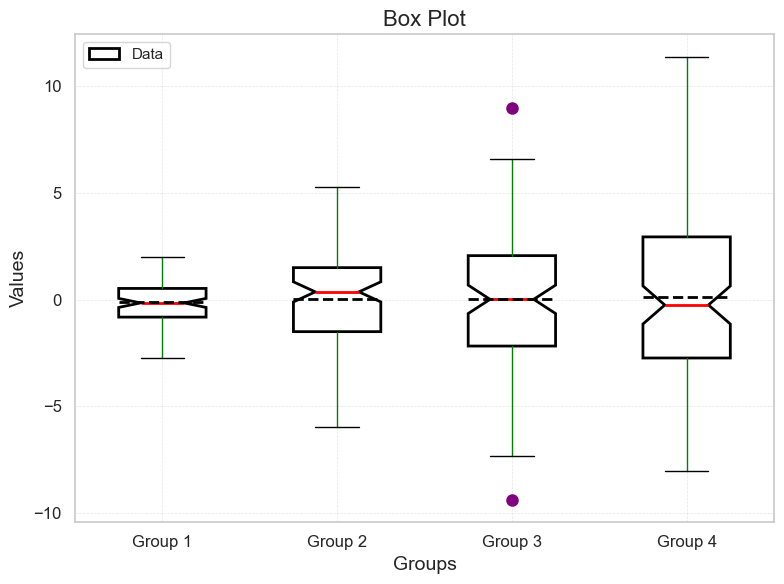

In [150]:
# Custom usage
custom_data = [np.random.normal(0, std, 100) for std in range(1, 5)]
box_plot_matplotlib(data=custom_data)

### Seaborn

In [151]:
def box_plot_seaborn(
    data, x: Optional[str] = None, y: Optional[str] = None, hue: Optional[str] = None, 
    palette: str = 'magma',palette2: str = 'viridis',color=None, figsize: tuple = (8, 6), width: float = 0.5, whis: float = 1.5, 
    notch: bool = True, showmeans: bool = True, mean_marker: str = 'o', mean_color: str = 'black', 
    flier_marker: str = 'o', flier_size: int = 8, flier_color: str = 'black', flier_edge_color: str = 'purple', 
    xlabel: str = 'Groups', ylabel: str = 'Values', title: str = 'Box Plot (Seaborn)', 
    xtick_labels: Optional[List[str]] = None, font_scale: float = 1, orient: Optional[Literal['v', 'h', 'x', 'y']] = None
) -> None:
    """
    Create a box plot using Seaborn with the provided parameters.

    Parameters:
    ----------
    - data: DataFrame
        The dataset for plotting.
    - x: str, optional
        Column name for x-axis variable.
    - y: str, optional
        Column name for y-axis variable.
    - hue: str, optional
        Column name for grouping variable to produce multiple plots.
    - palette: str
        Color palette for the plot.
    - figsize: tuple
        Size of the figure (width, height).
    - width: float
        Width of the box in the boxplot.
    - whis: float
        Whisker length in terms of IQR.
    - notch: bool
        Whether to draw a notch to indicate the confidence interval.
    - showmeans: bool
        Whether to show the mean value in the plot.
    - mean_marker: str
        Marker style for the mean value.
    - mean_color: str
        Color of the mean marker.
    - flier_marker: str
        Marker style for outliers.
    - flier_size: int
        Size of the outlier markers.
    - flier_color: str
        Color of the outlier markers.
    - flier_edge_color: str
        Edge color of the outlier markers.
    - xlabel: str
        Label for the x-axis.
    - ylabel: str
        Label for the y-axis.
    - title: str
        Title of the plot.
    - xtick_labels: list of str, optional
        Custom labels for the x-axis ticks.
    - font_scale: float
        Scaling factor for the font size of all text elements.
    - orient: {'v', 'h', 'x', 'y'}, optional
        Orientation of the plot (vertical or horizontal).
    
    Examples:
    --------
    >>> box_plot_seaborn(data=tips, x="day", y="total_bill", hue="day",orient='x') 
    >>> box_plot_seaborn(data=tips,orient='y') 
    >>> box_plot_seaborn(data=data,orient='x') 
    
    Returns:
    -------
    - None
    """

    # Set font scale for all text elements and styling
    sns.set(font_scale=font_scale, style='white')

    # Create the figure and axes
    fig, ax = plt.subplots(figsize=figsize)
    
    # get the color for each plot
    if color is None:
        colors_list = random.sample(sns.color_palette(palette) + sns.color_palette(palette2), 12)
        colors = random.choices(colors_list, k=1)
    else:
        colors = color
    
    # Create the boxplot with the specified parameters
    if hue is not None:
        sns_plot = sns.boxplot(
            data=data, x=x, y=y, hue=hue, palette=palette, width=width, 
            whis=whis, notch=notch, showmeans=showmeans, orient=orient,
            meanprops=dict(marker=mean_marker, markerfacecolor=mean_color, markeredgecolor=mean_color),
            flierprops=dict(marker=flier_marker, markersize=flier_size, 
                            markerfacecolor=flier_color, markeredgecolor=flier_edge_color),
            ax=ax
        )
    elif hue is None and x is None and y is None:
        sns_plot = sns.boxplot(
            data=data, palette=palette, width=width, 
            whis=whis, notch=notch, showmeans=showmeans, orient=orient,
            meanprops=dict(marker=mean_marker, markerfacecolor=mean_color, markeredgecolor=mean_color),
            flierprops=dict(marker=flier_marker, markersize=flier_size, 
                            markerfacecolor=flier_color, markeredgecolor=flier_edge_color),
            ax=ax
        )
    elif hue is None:
        sns_plot = sns.boxplot(
            data=data, x=x, y=y, color=colors[0], width=width, 
            whis=whis, notch=notch, showmeans=showmeans, orient=orient,
            meanprops=dict(marker=mean_marker, markerfacecolor=mean_color, markeredgecolor=mean_color),
            flierprops=dict(marker=flier_marker, markersize=flier_size, 
                            markerfacecolor=flier_color, markeredgecolor=flier_edge_color),
            ax=ax
        )
    
    
    # Set labels and title
    ax.set_xlabel(xlabel, fontsize=14 * font_scale)
    ax.set_ylabel(ylabel, fontsize=14 * font_scale)
    ax.set_title(title, fontsize=16 * font_scale)

    # Set custom x-axis tick labels if provided
    if xtick_labels:
        ax.set_xticks(range(len(xtick_labels)))
        ax.set_xticklabels(xtick_labels, fontsize=12 * font_scale)

    # Set y-axis tick font size
    ax.tick_params(axis='y', labelsize=12 * font_scale)

    # Add grid lines to the plot
    ax.grid(True, linestyle='--', linewidth=0.5, alpha=0.5)

    # Add a legend if a hue is used and there are labeled artists
    if hue and sns_plot.get_legend_handles_labels()[0]:
        ax.legend(title=hue, loc='upper right', fontsize=10 * font_scale)
    elif hue:
        print(f"Note: No legend created as no artists with labels were found for hue '{hue}'.")

    # Adjust the layout and display the plot
    plt.tight_layout()
    plt.show()



Note: No legend created as no artists with labels were found for hue 'day'.


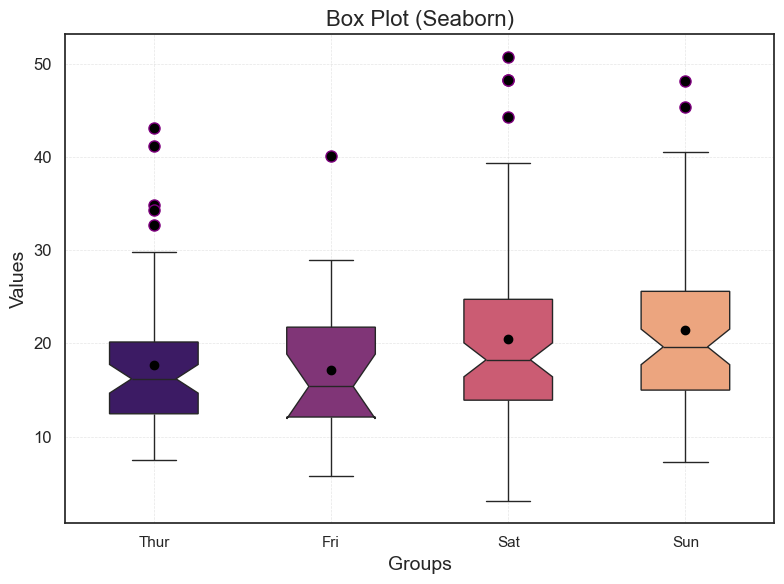

In [837]:
tips = sns.load_dataset('tips')
box_plot_seaborn(data=tips, x="day", y="total_bill", hue="day",orient='x') 

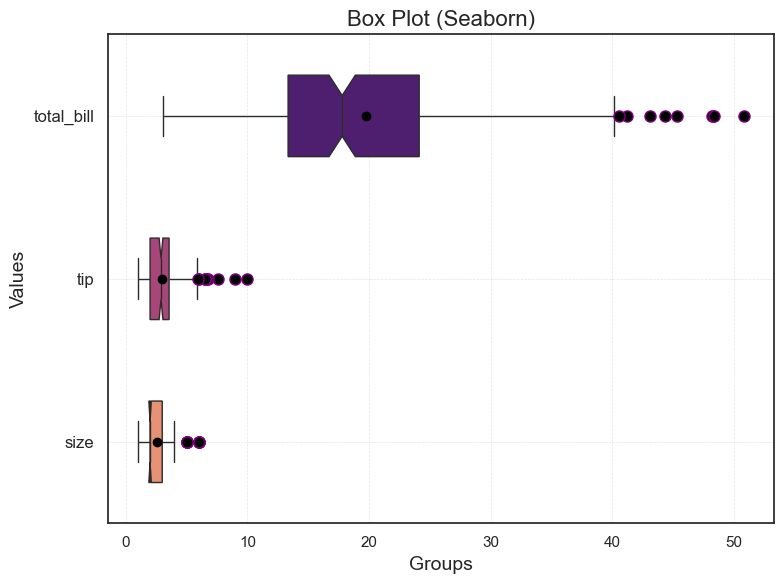

In [838]:
tips = sns.load_dataset('tips')
box_plot_seaborn(data=tips,orient='y') 

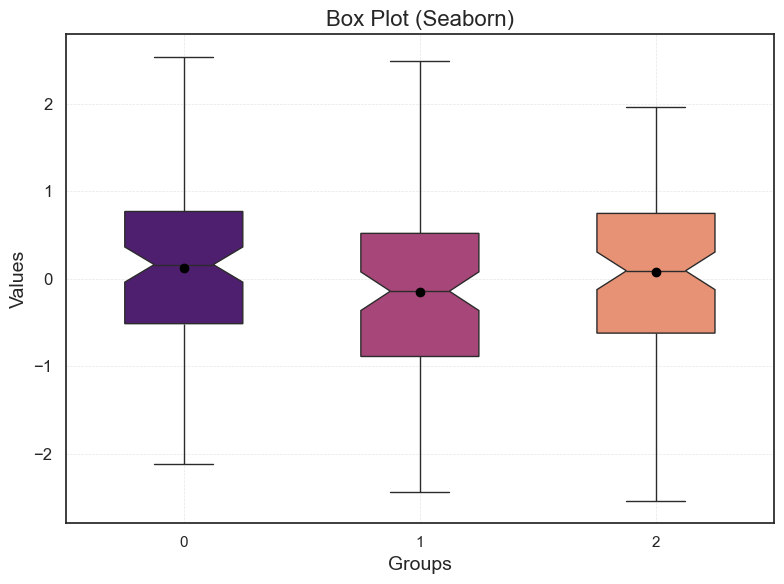

In [839]:
data = np.random.normal(loc=0, scale=1, size=(100, 3))
box_plot_seaborn(data=data,orient='x') 

In [153]:
def box_plot_all_column(numerical_features,df,orient='y'):
    for coloum in numerical_features:
        box_plot_seaborn(data=df, x=coloum, orient=orient, xlabel=coloum, ylabel=None, title='Box Plot of '+coloum, figsize=(8,4))

In [154]:
df=pd.read_csv("bank.csv")
numerical_features=df.select_dtypes(include='number')
categorical_features=['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']

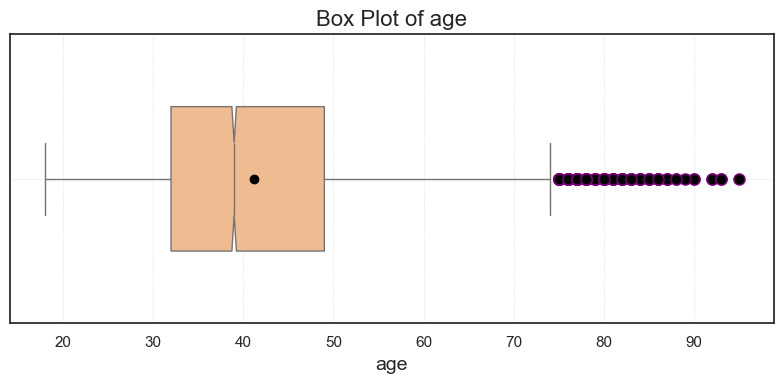

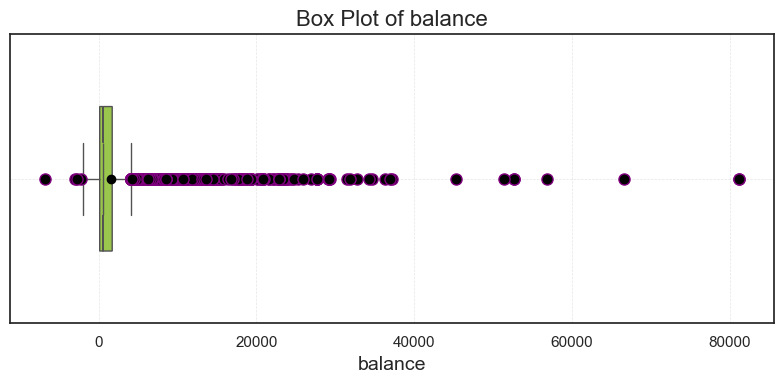

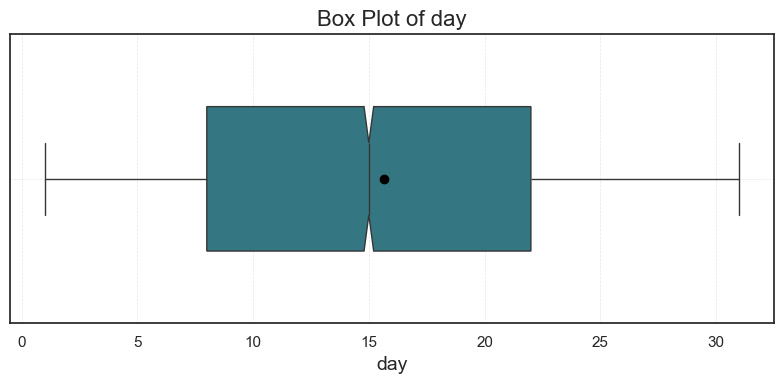

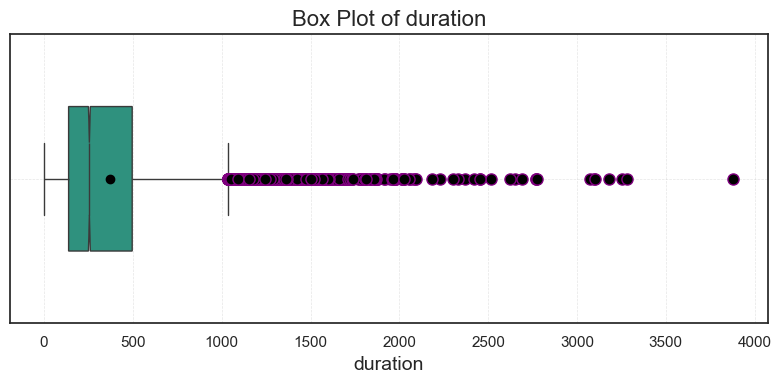

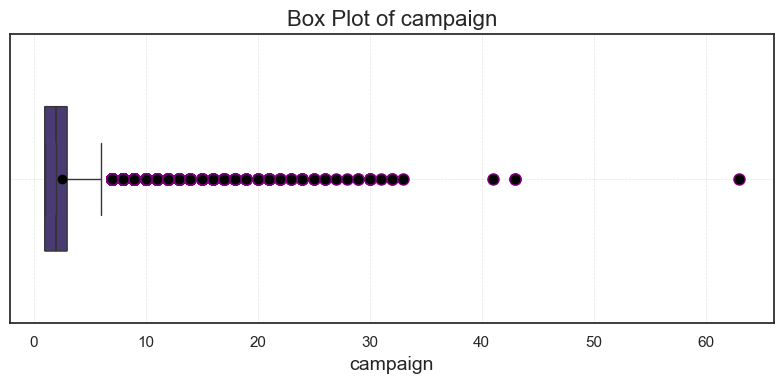

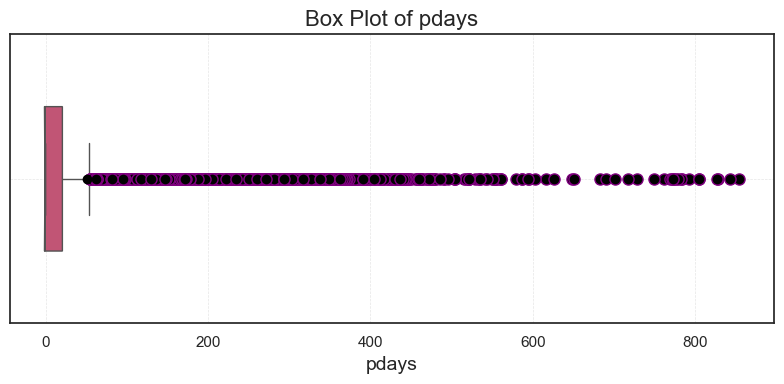

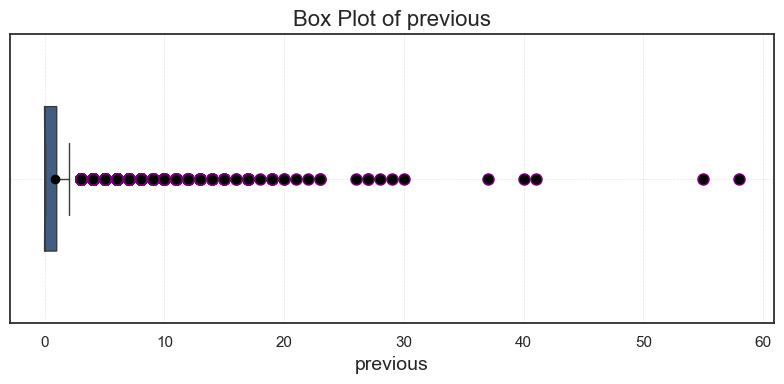

In [155]:
box_plot_all_column(numerical_features,df)

## plotly express

In [38]:
def box_plot_plotly(
    data: pd.DataFrame,
    x: Optional[str] = None,
    y: Optional[str] = None,
    color: Optional[str] = None,
    title: Optional[str] = None,
    color_discrete_sequence: Optional[List[str]] = None,
    orientation: Literal['v', 'h'] = 'v',
    points: Literal['all', 'outliers', 'suspectedoutliers', False] = 'outliers',
    notched: bool = False,
    width: int = 800,
    height: int = 600,
    hover_data: Optional[List[str]] = None
):
    """
    Create a box plot using Plotly Express.

    Parameters:
    ----------
    - data: DataFrame
        The dataset for plotting.
    - x: str, optional
        Column name for x-axis variable.
    - y: str, optional
        Column name for y-axis variable.
    - color: str, optional
        Column name for grouping variable to produce multiple plots.
    - title: str, optional
        Title of the plot.
    - color_discrete_sequence: list of str, optional
        List of colors for the boxes.
    - orientation: {'v', 'h'}, optional
        Orientation of the plot (vertical or horizontal).
    - points: {'all', 'outliers', 'suspectedoutliers', False}, optional
        Which points to show on the box plot.
    - notched: bool, optional
        Whether to draw a notched box plot.
    - width: int, optional
        Width of the figure in pixels.
    - height: int, optional
        Height of the figure in pixels.
    - hover_data: list of str, optional
        Additional data to show on hover.
    
    Examples:
    --------
    >>> box_plot_plotly(data=tips, x="day", y="total_bill", color="day")
    >>> box_plot_plotly(data=tips, y="total_bill", orientation='h')
    >>> box_plot_plotly(data=data)
    
    Returns:
    -------
    - px.Figure: The Plotly Express Figure object with the plot.
    """

    # Create the box plot
    fig = px.box(
        data,
        x=x,
        y=y,
        color=color,
        title=title,
        color_discrete_sequence=color_discrete_sequence,
        orientation=orientation,
        points=points,
        notched=notched,
        hover_data=hover_data
    )

    # Update layout
    fig.update_layout(
        width=width,
        height=height,
        xaxis_title=x,
        yaxis_title=y
    )

    return fig



box_plot_plotly(data=tips, x="day", y="total_bill", color="day")

# Heatmap

In [40]:
def heatmap_plot(df, 
                annot=True, 
                fmt=".2f", 
                cmap="YlGnBu", 
                linewidths=0.1, 
                linecolor='black', 
                square=True, 
                mask=None, 
                robust=True, 
                title=None, 
                xlabel=None, 
                ylabel=None, 
                figsize=(14, 8)):
    """
    Create a customized heatmap from the given DataFrame.

    Parameters:
    ----------
    df (pd.DataFrame): The data for the heatmap.
    annot (bool): Annotate cells with the data value. Default is True.
    fmt (str): String formatting code to use when adding annotations. Default is ".2f".
    cmap (str): Colormap. Default is "YlGnBu".
    linewidths (float): Width of the lines that will divide each cell. Default is 0.3.
    linecolor (str): Color of the lines that will divide each cell. Default is 'black'.
    square (bool): If True, set the Axes aspect to “equal” so each cell will be square-shaped. Default is True.
    mask (pd.DataFrame or np.ndarray): If passed, data will not be shown in cells where mask is True. Default is None.
    robust (bool): If True and vmin or vmax are absent, the colormap range is computed with robust quantiles instead of the extreme values. Default is True.
    title (str): Title for the heatmap. Default is None.
    xlabel (str): Label for the x-axis. Default is None.
    ylabel (str): Label for the y-axis. Default is None.
    figsize (tuple): Size of the figure. Default is (14, 8).
    
    Examples:
    --------
    >>> heatmap_plot(df)
    
    Returns:
    -------
    None
    """
    # Set default labels if None
    if xlabel is None:
        xlabel = 'X'
    if ylabel is None:
        ylabel = 'Y'
    if title is None:
        title = 'Customized Seaborn Heatmap'

    # Create a figure and axis with specified figure size
    plt.figure(figsize=figsize)
    
    # Create the heatmap with customization
    heatmap = sns.heatmap(
        data=df,
        annot=annot,             # Annotate cells with the data value
        fmt=fmt,                 # Format the annotations
        cmap=cmap,               # Colormap
        linewidths=linewidths,   # Line width between cells
        linecolor=linecolor,     # Line color between cells
        square=square,           # Force square cells
        mask=mask,               # Mask cells
        robust=robust            # Robust colormap limits
    )

    # Customize the plot title and axis labels
    plt.title(title, fontsize=18, weight='bold', pad=20)
    plt.xlabel(xlabel, fontsize=14, weight='bold')
    plt.ylabel(ylabel, fontsize=14, weight='bold')

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)

    # Adjust layout to fit elements properly
    plt.tight_layout()

    # Add grid lines for better readability of the heatmap
    plt.grid(True, linestyle='--', linewidth=0.5, alpha=0.5)

    # Show the heatmap
    plt.show()



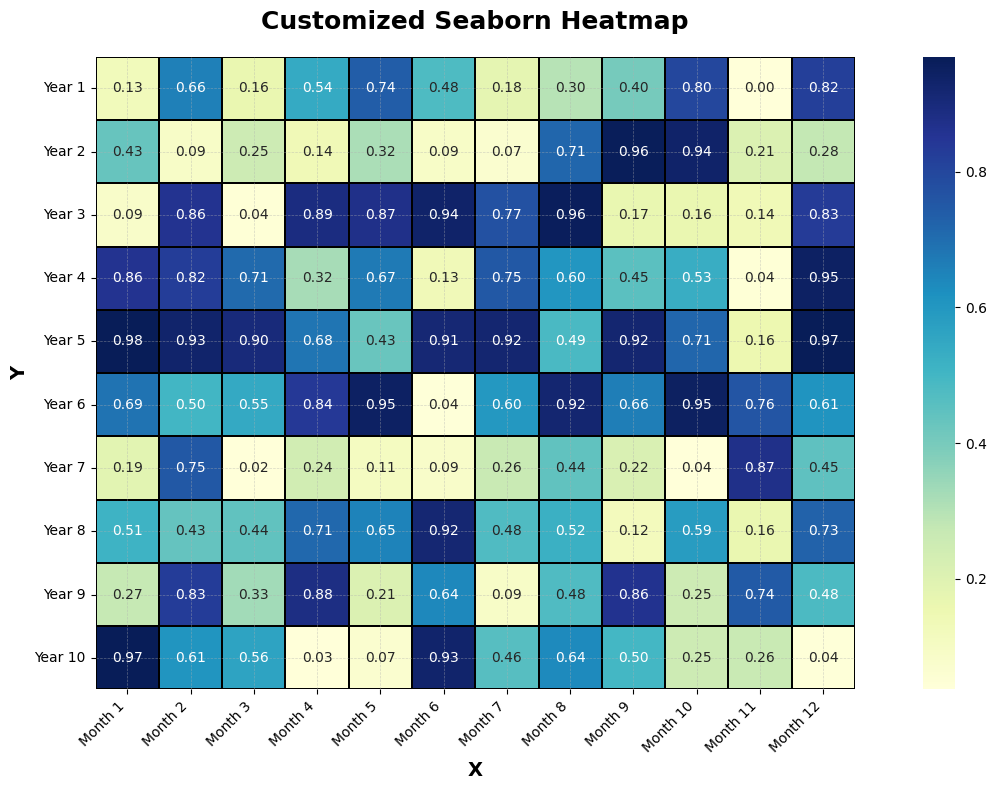

In [41]:
data = np.random.rand(10, 12)  # Generate random data
df = pd.DataFrame(data, columns=[f'Month {i+1}' for i in range(12)], index=[f'Year {i+1}' for i in range(10)])
heatmap_plot(df)


## plotly express

In [42]:
def heatmap_plot_plotly(df, 
                 annot=True, 
                 fmt=".2f", 
                 color_continuous_scale="YlGnBu", 
                 title=None, 
                 xlabel=None, 
                 ylabel=None, 
                 width=800, 
                 height=600):
    """
    Create a customized heatmap from the given DataFrame using plotly.express.

    Parameters:
    ----------
    df (pd.DataFrame): The data for the heatmap.
    annot (bool): Annotate cells with the data value. Default is True.
    fmt (str): String formatting code to use when adding annotations. Default is ".2f".
    color_continuous_scale (str): Colorscale. Default is "YlGnBu".
    title (str): Title for the heatmap. Default is None.
    xlabel (str): Label for the x-axis. Default is None.
    ylabel (str): Label for the y-axis. Default is None.
    width (int): Width of the figure in pixels. Default is 800.
    height (int): Height of the figure in pixels. Default is 600.
    
    Returns:
    -------
    plotly.graph_objs._figure.Figure
    """
    # Melt the dataframe to long format
    df_melted = df.reset_index().melt(id_vars='index')
    
    # Create the heatmap
    fig = px.imshow(df,
                    color_continuous_scale=color_continuous_scale,
                    labels=dict(x=xlabel, y=ylabel, color="Value"),
                    width=width,
                    height=height)
    
    # Customize the layout
    fig.update_layout(
        title=title,
        xaxis_title=xlabel,
        yaxis_title=ylabel,
        xaxis_tickangle=-45,
    )
    
    # Add annotations if requested
    if annot:
        annotations = []
        for i, row in df_melted.iterrows():
            annotations.append(
                dict(
                    x=row['variable'],
                    y=row['index'],
                    text=f"{row['value']:{fmt}}",
                    showarrow=False,
                )
            )
        fig.update_layout(annotations=annotations)
    
    return fig



heatmap_plot_plotly(df)

# pairplot

In [43]:
def pair_plot(data, hue=None, palette='viridis', diag_kind='kde', plot_kws=None, diag_kws=None, 
              markers=None, alpha=0.6, figsize=(14, 10), title=None, save_path=None, legend_loc='best'):
    """
    Create a customized pairplot using seaborn.
    
    Parameters:
    ----------
    - data: DataFrame to be plotted
    - hue: Column name for color-coding (optional)
    - palette: Color palette for the plot
    - diag_kind: Kind of plot for the diagonal ('hist' or 'kde')
    - plot_kws: Additional keyword arguments for the pairplot (e.g., {'s': 20, 'edgecolor': 'w'})
    - diag_kws: Additional keyword arguments for the diagonal plots (e.g., {'fill': True})
    - markers: List of markers for each level of the hue variable
    - alpha: Transparency level for the plots
    - figsize: Tuple specifying the size of the figure
    - title: Title for the plot
    - save_path: Path to save the plot image file (e.g., 'plot.png')
    - legend_loc: Location of the legend (e.g., 'best', 'upper right', 'lower left')
    
    Examples:
    --------
    >>> pair_plot(data, hue="species")
    >>> pair_plot(data)
    >>> pair_plot(numerical_features,palette=None)
    >>> pair_plot(numerical_features)
    
    Returns:
    -------
    - g: The resulting PairGrid object
    """
    
    # Set default plot settings if not provided
    if plot_kws is None:
        plot_kws = {"s": 40, "alpha": alpha}  # Increased point size to 40
    else:
        plot_kws.setdefault('s', 40)  # Increased point size to 40
        plot_kws['alpha'] = alpha
    
    if diag_kws is None:
        diag_kws = {"fill": True}  # Use fill=True instead of shade=True
    
    # Create the pairplot
    g = sns.pairplot(data=data, 
                     hue=hue, 
                     palette=palette if hue else None,
                     diag_kind=diag_kind,
                     plot_kws=plot_kws,
                     diag_kws=diag_kws,
                     markers=markers)
    
    # If no hue is provided, manually set colors using the palette
    if hue is None:
        # Create a color palette
        palette_colors = sns.color_palette(palette, n_colors=len(data))
        
        # Set the colors for the scatter plots
        for i, ax in enumerate(g.axes.flatten()):
            if ax.get_ylabel() in data.columns and ax.get_xlabel() in data.columns:
                for line in ax.lines:
                    line.set_color(palette_colors)
                for path in ax.collections:
                    path.set_facecolor(palette_colors)
                    path.set_alpha(alpha)
    
    # Customize the plot further
    g.fig.set_size_inches(figsize)  # Set figure size
    
    if title:  # Set plot title if provided
        g.fig.suptitle(title, y=1.0, fontsize=16)
    
    # Customize legend location
    if hue is not None:
        for ax in g.axes.flatten():
            if ax.get_legend() is not None:
                ax.legend(loc=legend_loc)
                break
    
    if save_path:  # Save plot to file if path is provided
        plt.savefig(save_path, bbox_inches='tight')
    
    plt.show()
    
    return g



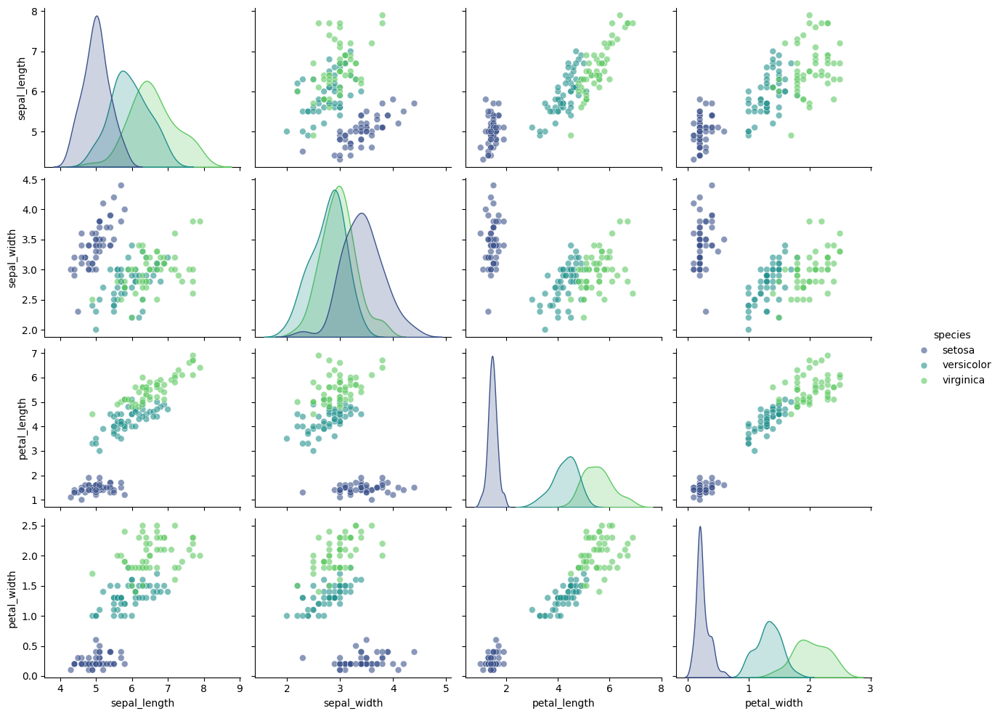

In [44]:
data = sns.load_dataset('iris')
pair_plot(data, hue="species")

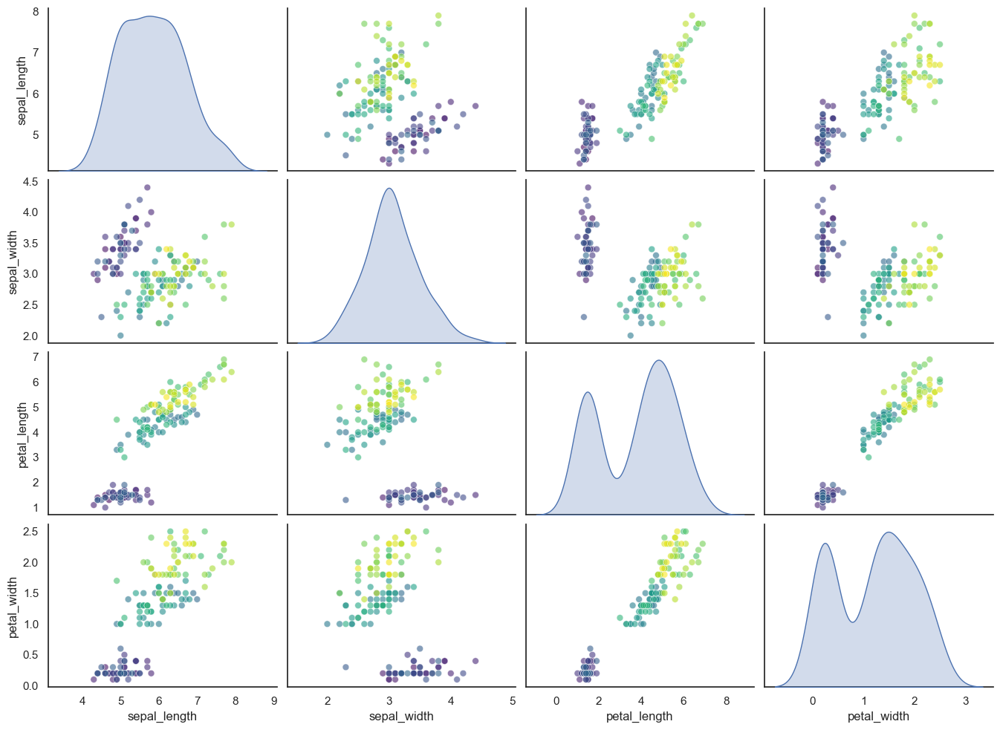

In [846]:
pair_plot(data)

In [847]:
df=pd.read_csv("bank.csv")
numerical_features=df.select_dtypes(include='number')
categorical_features=['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']

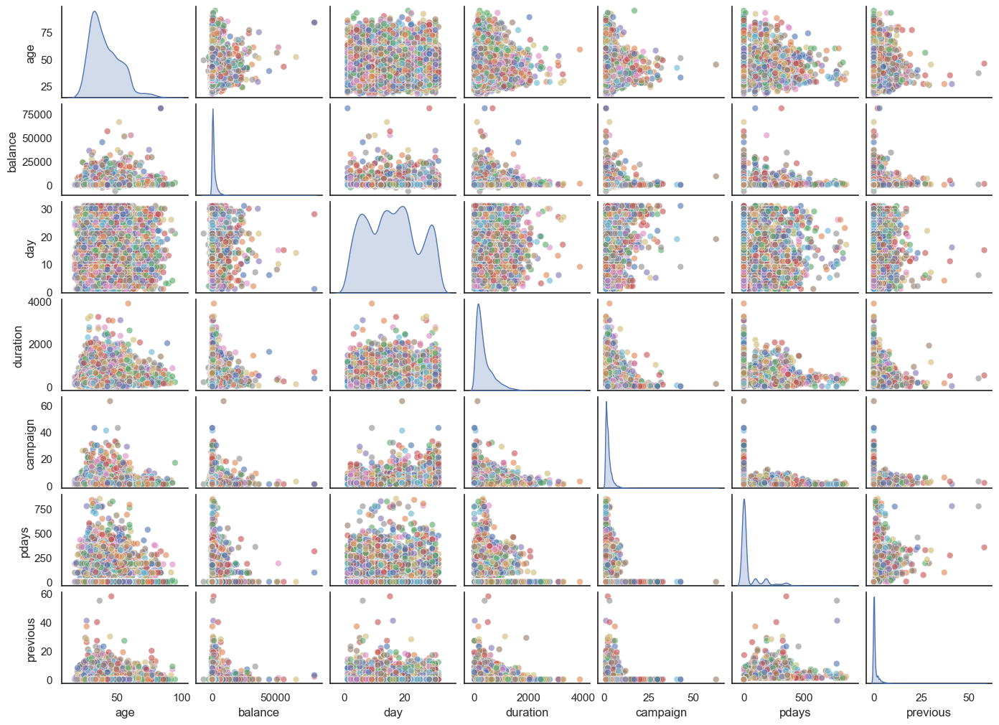

In [848]:
pair_plot(numerical_features,palette=None)

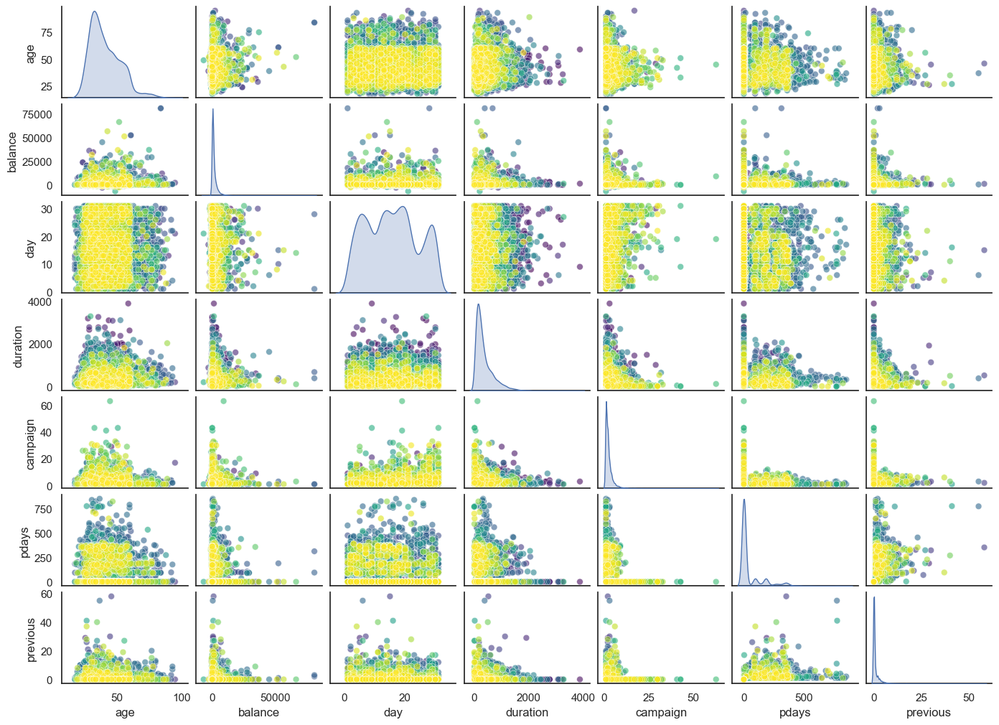

In [849]:
pair_plot(numerical_features)

## plotly express

In [49]:
def pair_plot_plotly(data, hue=None, color_discrete_sequence=None, diag_kind='histogram', 
                    opacity=0.6, width=1000, height=1000, title=None):
    """
    Create a customized pairplot using plotly.express.
    
    Parameters:
    ----------
    data: DataFrame to be plotted
    hue: Column name for color-coding (optional)
    color_discrete_sequence: Color sequence for the plot
    diag_kind: Kind of plot for the diagonal ('histogram' or 'violin')
    markers: List of markers for each level of the hue variable
    opacity: Opacity level for the plots
    width: Width of the figure in pixels
    height: Height of the figure in pixels
    title: Title for the plot
    
    Returns:
    -------
    plotly.graph_objs._figure.Figure
    """
    numeric_cols = data.select_dtypes(include=['float64', 'int64']).columns
    n_cols = len(numeric_cols)
    
    fig = make_subplots(rows=n_cols, cols=n_cols, shared_xaxes=True, shared_yaxes=True)
    
    for i, col1 in enumerate(numeric_cols):
        for j, col2 in enumerate(numeric_cols):
            if i != j:  # Off-diagonal: scatter plots
                scatter = px.scatter(data, x=col2, y=col1, color=hue, 
                                     opacity=opacity, color_discrete_sequence=color_discrete_sequence)
                for trace in scatter.data:
                    fig.add_trace(trace, row=i+1, col=j+1)
            else:  # Diagonal: histogram or violin plot
                if diag_kind == 'histogram':
                    diag = px.histogram(data, x=col1, color=hue, 
                                        color_discrete_sequence=color_discrete_sequence)
                elif diag_kind == 'violin':
                    diag = px.violin(data, y=col1, color=hue, box=True, 
                                     color_discrete_sequence=color_discrete_sequence)
                for trace in diag.data:
                    fig.add_trace(trace, row=i+1, col=j+1)
    
    fig.update_layout(
        title=title,
        width=width,
        height=height,
        showlegend=False
    )
    
    # Update axis labels
    for i, col in enumerate(numeric_cols):
        fig.update_xaxes(title_text=col, row=n_cols, col=i+1)
        fig.update_yaxes(title_text=col, row=i+1, col=1)
    
    return fig




pair_plot_plotly(data, hue="species")

# violinplot

### Seaborn

In [156]:
def violin_plot(data, x, y=None, hue=None, order=None, title=None, xlabel=None, ylabel=None, 
                    figsize=(10, 6), palette="magma", inner="box", split=False,
                    density_norm='area', linewidth=1, bw_method=0.2, gridsize=100,
                    xlim=None, ylim=None, savefig_path=None):
    """
    Create a custom violin plot with enhanced customization options.
    
    Parameters:
    ----------
    - data: DataFrame
        The data to be plotted.
    - x: str
        The column name for the x-axis.
    - y: str
        The column name for the y-axis.
    - hue: str, optional
        The column name for the hue variable, which will determine the color of the violins.
    - order: list, optional
        The order in which to plot the categorical levels of the x variable.
    - title: str, optional
        The title of the plot.
    - xlabel: str, optional
        The label for the x-axis.
    - ylabel: str, optional
        The label for the y-axis.
    - figsize: tuple, optional
        The size of the figure (width, height).
    - palette: str or list, optional
        The color palette to use for the plot.
    - inner: str, optional
        The representation of the datapoints in the violin interior.
    - split: bool, optional
        Whether to split the violins for easier comparison.
    - density_norm: str, optional
        The method for scaling the width of each violin.
    - linewidth: float, optional
        The width of the lines that will divide the violins.
    - bw_method: float, optional
        The bandwidth of the kernel density estimate.
    - gridsize: int, optional
        Number of points in the grid for the kernel density estimate.
    - xlim: tuple, optional
        Limits for the x-axis.
    - ylim: tuple, optional
        Limits for the y-axis.
    - savefig_path: str, optional
        Path to save the figure.
    - show: bool, optional
        Whether to show the plot.
    
    Example:
    --------
    >>> custom_violinplot(data=tips, x='day', y='total_bill')
    
    Returns:
    -------
    None
    """
    # Create the figure and axis
    plt.figure(figsize=figsize)
    
    # Adjust palette and legend if hue is not provided
    if hue is None and palette is not None:
        sns.violinplot(data=data, x=x, y=y, hue=x, order=order, palette=palette, inner=inner, split=split,
                       density_norm=density_norm, linewidth=linewidth, bw_method=bw_method, gridsize=gridsize,
                       legend=False)
    else:
        sns.violinplot(data=data, x=x, y=y, hue=hue, order=order, palette=palette, inner=inner, split=split,
                       density_norm=density_norm, linewidth=linewidth, bw_method=bw_method, gridsize=gridsize)
    
    # Set title and labels if provided
    if title:
        plt.title(title, fontsize=16)
    if xlabel:
        plt.xlabel(xlabel, fontsize=12)
    if ylabel:
        plt.ylabel(ylabel, fontsize=12)
    
    # Set axis limits if provided
    if xlim:
        plt.xlim(xlim)
    if ylim:
        plt.ylim(ylim)
    
    # Adjust layout
    plt.tight_layout()
    
    # Save the figure if a path is provided
    if savefig_path:
        plt.savefig(savefig_path)
    
    # Show the plot if specified
    plt.show()



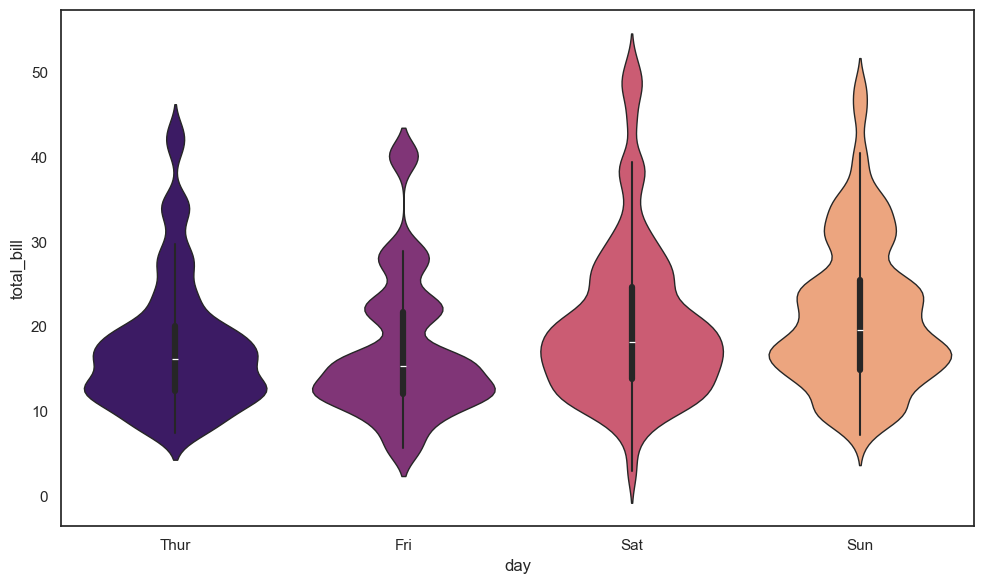

In [157]:
tips = sns.load_dataset('tips')
violin_plot(data=tips, x='day', y='total_bill')

In [158]:
def plot_violin_all_column(
    data,
    n_cols=3,
    figsize=(15, 15),
    Vision: Literal['Vertical', 'horizontal'] = "horizontal",
    palette="magma",
    palette2="viridis",
    inner="box",
    split=False,
    density_norm='area',
    linewidth=1,
    bw_method=0.2,
    gridsize=100,
    xlim=None,
    ylim=None,
    title="Violin Plots of Numeric Variables"
):
    """
    Creates violin plots for all numeric columns in the dataset using subplots.
    
    Parameters:
    ----------
    - data (DataFrame): Input dataframe.
    - n_cols (int): Number of columns in the subplot grid.
    - figsize (tuple): Figure size.
    - palette (str or list): Color palette to use for the plot.
    - inner (str): Representation of the datapoints in the violin interior.
    - split (bool): Whether to split the violins for easier comparison.
    - density_norm (str): Method for scaling the width of each violin.
    - linewidth (float): Width of the lines that will divide the violins.
    - bw_method (float): Bandwidth of the kernel density estimate.
    - gridsize (int): Number of points in the grid for the kernel density estimate.
    - xlim (tuple or None): Limits for the x-axis.
    - ylim (tuple or None): Limits for the y-axis.
    - title (str): Overall title for the figure.
    
    Examples:
    --------
    >>> plot_violin_all_column(penguins, n_cols=2, Vision='Vertical')
    >>> plot_violin_all_column(df, n_cols=3, Vision='horizontal')
    
    Returns:
    -------
    - matplotlib figure
    """
    # Select only numeric columns
    numeric_cols = data.select_dtypes(include=[np.number]).columns
    n_plots = len(numeric_cols)
    
    # Calculate number of rows needed
    n_rows = (n_plots - 1) // n_cols + 1
    
    # get the color for each plot
    if n_plots <= 6 :
        colors = random.sample(sns.color_palette(palette), n_plots)
    elif n_plots <= 12 :
        colors = random.sample(sns.color_palette(palette) + sns.color_palette(palette2), n_plots)
    elif n_plots > 12 :
        colors = random.choices(sns.color_palette(palette) + sns.color_palette(palette2), k=n_plots)
    
    
    # Create subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    fig.suptitle(title, fontsize=16)
    
    # Flatten axes array for easy iteration
    axes = axes.flatten()
    
    if Vision == 'horizontal':
        for i, col in enumerate(numeric_cols):
            sns.violinplot(
                data=data,
                x=col,
                y=None,
                ax=axes[i],
                color=colors[i],
                inner=inner,
                split=split,
                density_norm=density_norm,
                linewidth=linewidth,
                bw_method=bw_method,
                gridsize=gridsize
            )
            axes[i].set_title(f'Violin Plot of {col}')
            axes[i].set_xlabel(col)
            axes[i].set_ylabel('Value')
            
            # Set axis limits if provided
            if xlim:
                axes[i].set_xlim(xlim)
            if ylim:
                axes[i].set_ylim(ylim)
    elif Vision == 'Vertical':
        for i, col in enumerate(numeric_cols):
            sns.violinplot(
                data=data,
                x=None,
                y=col,
                ax=axes[i],
                color=colors[i],
                inner=inner,
                split=split,
                density_norm=density_norm,
                linewidth=linewidth,
                bw_method=bw_method,
                gridsize=gridsize
            )
            axes[i].set_title(f'Violin Plot of {col}')
            axes[i].set_xlabel(col)
            axes[i].set_ylabel('Value')
            
            # Set axis limits if provided
            if xlim:
                axes[i].set_xlim(xlim)
            if ylim:
                axes[i].set_ylim(ylim)
    
    # Remove any unused subplots
    for j in range(i+1, len(axes)):
        fig.delaxes(axes[j])
    
    plt.tight_layout()
    plt.show()



In [159]:
df=pd.read_csv("bank.csv")
numerical_features=df.select_dtypes(include='number')
categorical_features=['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']

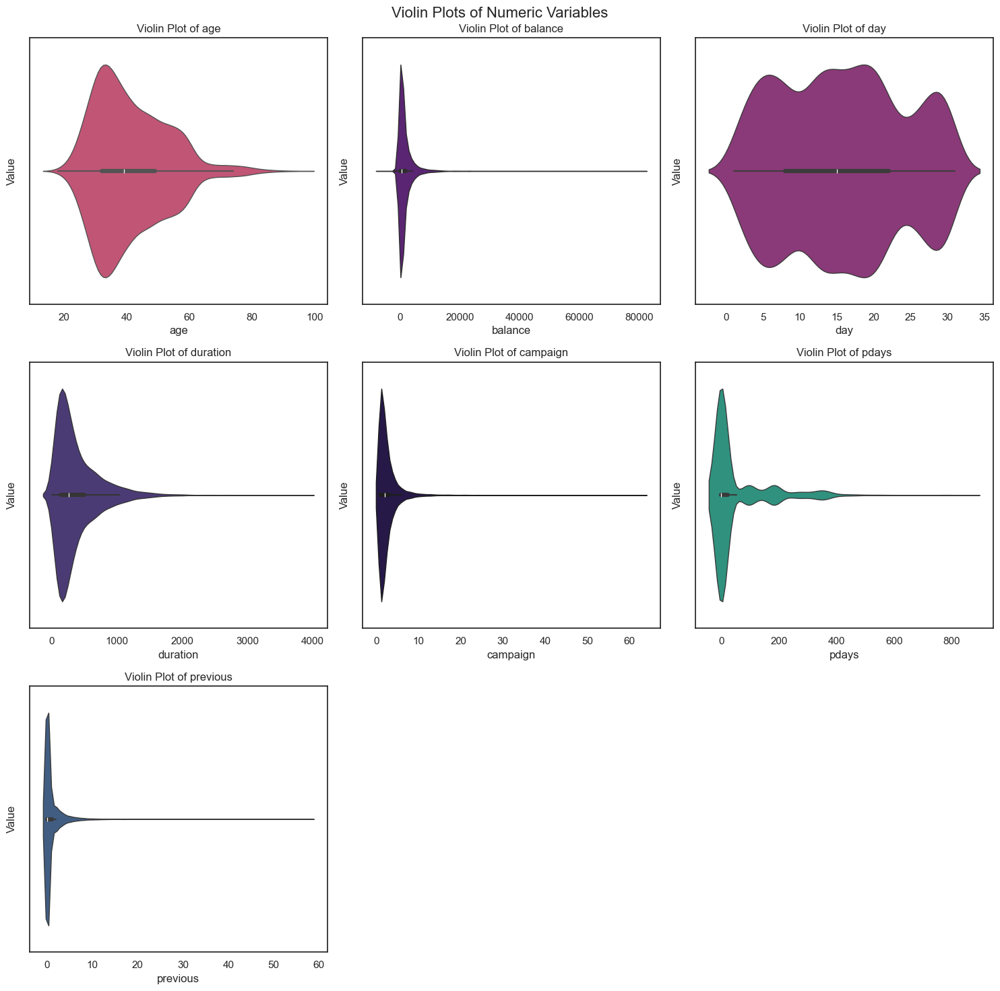

In [165]:
plot_violin_all_column(df)

## plotly express

In [50]:
def violin_plot_plotly(data, x, y=None, hue=None, order=None, title=None, xlabel=None, ylabel=None, 
                width=800, height=600, color_discrete_sequence=None, box=True, points='outliers',
                violinmode='group', orientation='v', hover_data=None, log_y=False):
    """
    Create a custom violin plot using plotly.express.
    
    Parameters:
    ----------
    data: DataFrame
        The data to be plotted.
    x: str
        The column name for the x-axis.
    y: str
        The column name for the y-axis.
    hue: str, optional
        The column name for the hue variable, which will determine the color of the violins.
    order: list, optional
        The order in which to plot the categorical levels of the x variable.
    title: str, optional
        The title of the plot.
    xlabel: str, optional
        The label for the x-axis.
    ylabel: str, optional
        The label for the y-axis.
    width: int, optional
        The width of the figure in pixels.
    height: int, optional
        The height of the figure in pixels.
    color_discrete_sequence: list, optional
        The color sequence to use for the plot.
    box: bool, optional
        Whether to include box plots inside the violins.
    points: str, optional
        How to plot the points. Options: 'outliers', 'all', False.
    violinmode: str, optional
        How to display violins. Options: 'group', 'overlay'.
    orientation: str, optional
        Orientation of the violins. Options: 'v', 'h'.
    hover_data: list, optional
        Additional data to display on hover.
    log_y: bool, optional
        Whether to use a log scale for the y-axis.
    
    Returns:
    -------
    plotly.graph_objs._figure.Figure
    """
    fig = px.violin(data, x=x, y=y, color=hue, category_orders={x: order} if order else None,
                    box=box, points=points, hover_data=hover_data,
                    color_discrete_sequence=color_discrete_sequence,
                    violinmode=violinmode, orientation=orientation, log_y=log_y)
    
    fig.update_layout(
        title=title,
        xaxis_title=xlabel,
        yaxis_title=ylabel,
        width=width,
        height=height
    )
    
    return fig



violin_plot_plotly(data=tips, x='day', y='total_bill', hue='time')

# jointplot

In [171]:
def joint_plot(x, y, data, kind: Literal['scatter', 'kde', 'hist', 'hex', 'reg', 'resid']='scatter', 
                hue=None, palette='magma', dropna=True,
                height=6, ratio=5, space=0.1, title=None, 
                xlabel=None, ylabel=None, grid=False, marker='o', alpha=0.7):
    """
    Create a customized jointplot using seaborn.
    
    Parameters:
    ----------
    - x, y: str
        Names of variables in `data`
    - data: DataFrame
        DataFrame containing the data
    - kind: str, optional (default='scatter')
        Kind of plot ('scatter', 'hex', 'kde', 'reg', 'resid')
    - hue: str, optional (default=None)
        Variable in `data` to map plot aspects to different colors
    - palette: str or seaborn color palette, optional (default='deep')
        Palette to use for different levels of the `hue` variable
    - dropna: bool, optional (default=True)
        If True, drop missing values from the data
    - height: float, optional (default=6)
        Height of the figure in inches
    - ratio: float, optional (default=5)
        Ratio of joint axis size to marginal axes height
    - space: float, optional (default=0.1)
        Space between joint and marginal axes
    - title: str, optional (default=None)
        Title of the plot
    - xlabel: str, optional (default=None)
        Label for the x-axis
    - ylabel: str, optional (default=None)
        Label for the y-axis
    - grid: bool, optional (default=False)
        Whether to display a grid
    - marker: str, optional (default='o')
        Marker style for scatter plot
    - alpha: float, optional (default=0.7)
        Transparency level for the plot elements
    
    Examples:
    --------
    >>> joint_plot(x='total_bill', y='tip', data=tips, kind='scatter')
    >>> joint_plot(x='total_bill', y='tip', data=tips, kind='kde')
    >>> joint_plot(x='total_bill', y='tip', data=tips, kind='hist')
    >>> joint_plot(x='total_bill', y='tip', data=tips, kind='hex')
    """
    
    # Create the jointplot with specified parameters
    g = sns.jointplot(
        x=x,
        y=y,
        data=data,
        kind=kind,
        hue=hue,
        palette=palette if hue else None,  # Use palette only if hue is specified
        dropna=dropna,
        height=height,
        ratio=ratio,
        space=space
    )
    
    # Customize the plot based on the kind parameter
    if kind == 'scatter':
        g.plot_joint(plt.scatter, color=sns.color_palette(palette)[0] if hue is None else None, marker=marker, alpha=alpha)
    elif kind == 'kde':
        g.plot_joint(sns.kdeplot, hue=hue, palette=palette if hue else None, zorder=0, levels=6, alpha=alpha)
    elif kind == 'hist':
        g.plot_joint(sns.histplot, hue=hue, palette=palette if hue else None, alpha=alpha)
    elif kind == 'hex':
        g = sns.jointplot(x=x, y=y, data=data, kind='hex', color=sns.color_palette(palette)[0] if hue is None else None, height=height, ratio=ratio, space=space)
    elif kind == 'reg':
        g.plot_joint(sns.regplot, scatter_kws={'alpha': alpha, 'marker': marker}, line_kws={'color': sns.color_palette(palette)[0] if hue is None else None})
    elif kind == 'resid':
        try:
            import statsmodels.api as sm
            g.plot_joint(sns.residplot, lowess=True, scatter_kws={'alpha': alpha, 'marker': marker})
        except ImportError:
            raise RuntimeError("`lowess=True` requires statsmodels, an optional dependency, to be installed.")
    
    # Set title, axis labels, and grid if specified
    if title:
        plt.suptitle(title, y=1.02)  # Adjust y for title positioning
    if xlabel:
        g.set_axis_labels(xlabel, ylabel)
    if ylabel:
        g.set_axis_labels(g.ax_joint.get_xlabel(), ylabel)
    if grid:
        g.ax_joint.grid(grid)
    
    # Adjust layout for better spacing
    plt.tight_layout()
    plt.show()




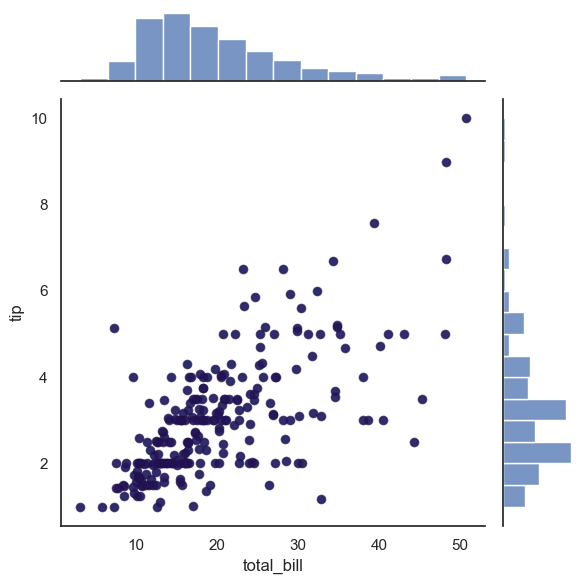

In [167]:
tips = sns.load_dataset('tips')
joint_plot(x='total_bill', y='tip', data=tips, kind='scatter')

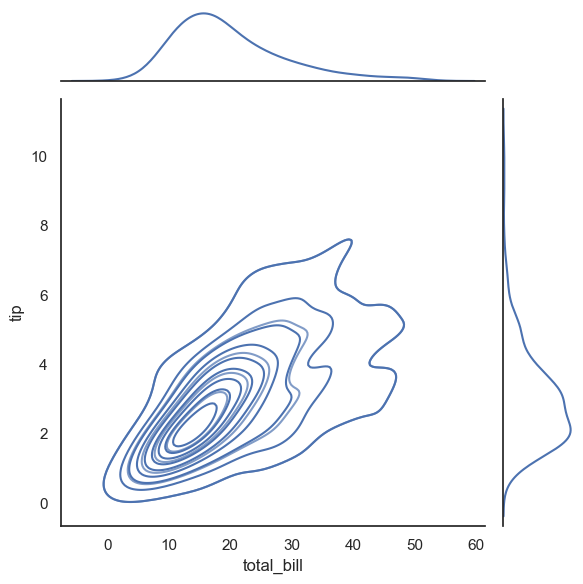

In [168]:
tips = sns.load_dataset('tips')
joint_plot(x='total_bill', y='tip', data=tips, kind='kde')

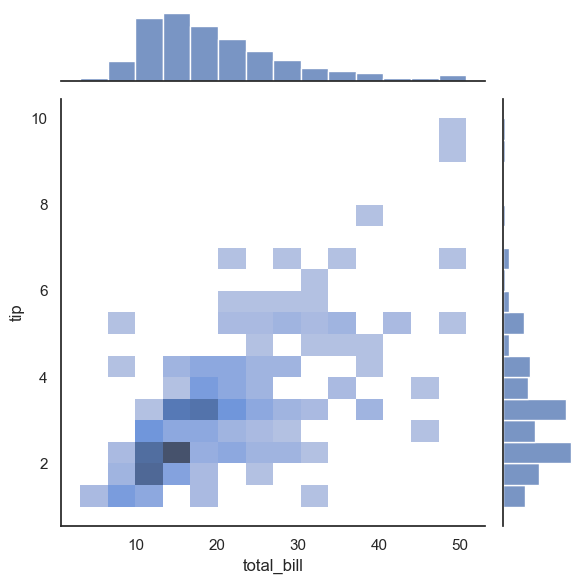

In [169]:
tips = sns.load_dataset('tips')
joint_plot(x='total_bill', y='tip', data=tips, kind='hist')

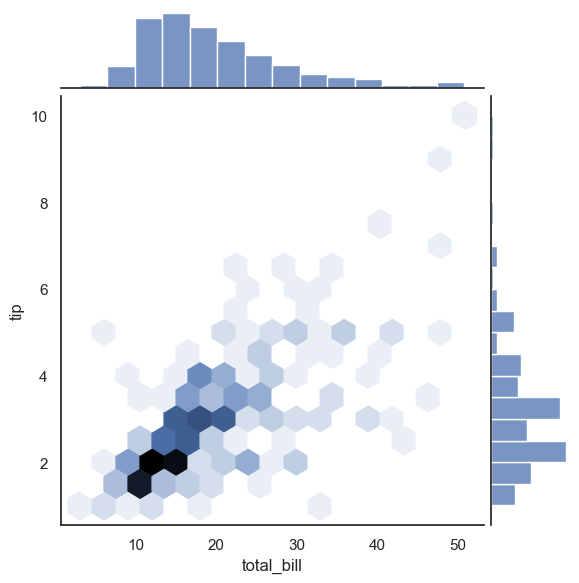

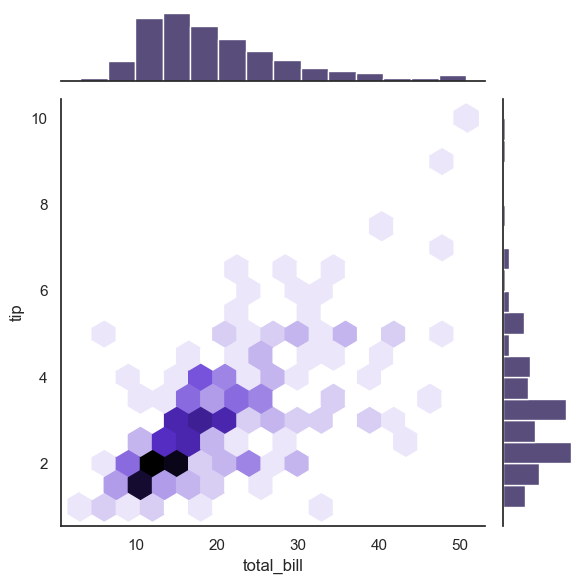

In [170]:
tips = sns.load_dataset('tips')
joint_plot(x='total_bill', y='tip', data=tips, kind='hex')

# Parallel Coordinate

In [860]:
def plot_parallel_coordinates(data: pd.DataFrame, 
                            class_column: str, 
                            figsize: Tuple[int, int] = (10, 6), 
                            colormap: str = 'viridis', 
                            title: str = 'Parallel Coordinates Plot', 
                            line_width: float = 1.5, 
                            line_style: str = '-', 
                            save_path: Optional[str] = None, 
                            **kwargs) -> None:
    """
    Plots a parallel coordinates chart with customizable parameters.

    Parameters:
    ----------
    data : pd.DataFrame
        DataFrame containing the numerical features.
    class_column : str
        Column name used to color the lines.
    figsize : Tuple[int, int], optional
        Figure size (default is (10, 6)).
    colormap : str, optional
        Colormap used for the lines (default is 'viridis').
    title : str, optional
        Title of the plot (default is 'Parallel Coordinates Plot').
    line_width : float, optional
        Width of the lines (default is 1.5).
    line_style : str, optional
        Style of the lines (default is '-').
    save_path : str, optional
        Path to save the plot image (default is None, plot is not saved).
    **kwargs : dict
        Additional keyword arguments for parallel_coordinates plotting.
    
    Examples:
    >>> plot_parallel_coordinates(numerical_features,'day')
    
    Returns:
    -------
    None
    """
    plt.figure(figsize=figsize)
    
    # Plot the parallel coordinates chart
    parallel_coordinates(data, class_column, colormap=colormap, linewidth=line_width, linestyle=line_style, **kwargs)
    
    # Add title to the plot
    plt.title(title)
    
    # Display the plot
    plt.show()
    
    # Save the plot if save_path is provided
    if save_path:
        plt.savefig(save_path)
        print(f"Plot saved as {save_path}")



In [861]:
df=pd.read_csv("bank.csv")
numerical_features=df.select_dtypes(include='number')
categorical_features=['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']

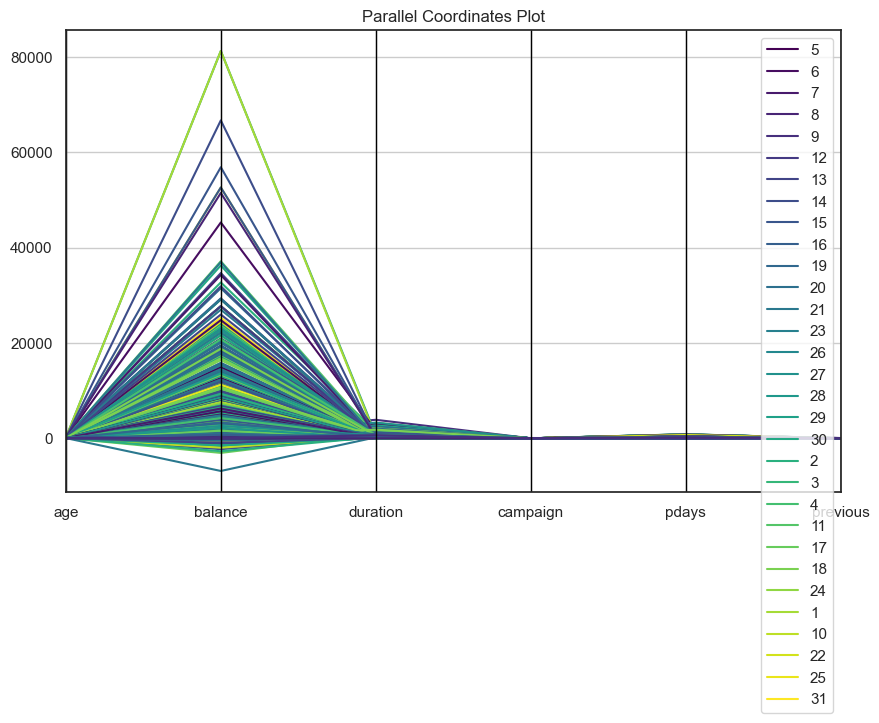

In [862]:
plot_parallel_coordinates(numerical_features,'day')

# contour

In [863]:
def plot_contour(x, y, z,df=None, levels=10,cmap='magma', linewidths=1.5,xlabel=None,ylabel=None):
    """
    Create a customized contour plot.
    
    Parameters:
    ----------
    X, Y : 2D arrays defining the coordinates of the surface
    Z : 2D array of the height values
    levels : int or array-like, optional (default=10)
        Number of contour lines or their values
    colors : str or sequence, optional (default='black')
        Color(s) of the contour lines
    linewidths : float or sequence, optional (default=1)
        Width(s) of the contour lines
    cmap : str or Colormap, optional (default=None)
        Colormap for filled contours. If specified, overrides 'colors'
    
    Example:
    -------
    >>> plot_contour(X,Y,Z)
    
    Returns:
    -------
    ContourSet object
    """
    contour = plt.contour(x, y, z,data=df, levels=levels, cmap=cmap, linewidths=linewidths)
    plt.colorbar(contour)
    plt.xlabel(xlabel if xlabel else 'X')
    plt.ylabel(ylabel if ylabel else 'Y')
    plt.title('Contour Plot')
    plt.show()



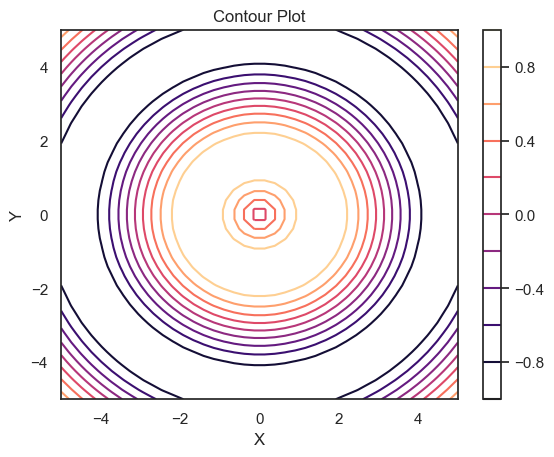

In [864]:
X, Y = np.meshgrid(np.linspace(-5, 5, 40), np.linspace(-5, 5, 40))
Z = np.sin(np.sqrt(X**2 + Y**2))
plot_contour(x=X,y=Y,z=Z)


In [ ]:
def plot_tricontourf(x, y, z, levels=10,cmap='magma',xlabel=None,ylabel=None):
    """
    Create a customized contour plot.
    
    Parameters:
    ----------
    X, Y : 2D arrays defining the coordinates of the surface
    Z : 2D array of the height values
    levels : int or array-like, optional (default=10)
        Number of contour lines or their values
    colors : str or sequence, optional (default='black')
        Color(s) of the contour lines
    linewidths : float or sequence, optional (default=1)
        Width(s) of the contour lines
    cmap : str or Colormap, optional (default=None)
        Colormap for filled contours. If specified, overrides 'colors'
    
    Example:
    -------
    >>> plot_tricontourf(df[x_column], df[y_column],df[z_column], cmap='viridis', xlabel= x_column, ylabel=y_column)
    
    
    Returns:
    -------
    ContourSet object
    """
    contour = plt.tricontourf(x, y, z, levels=levels, cmap=cmap)
    plt.colorbar(contour)
    plt.xlabel(xlabel if xlabel else 'X')
    plt.ylabel(ylabel if ylabel else 'Y')
    plt.title('Contour Plot')
    plt.show()



In [865]:
df=pd.read_csv("bank.csv")
numerical_features=df.select_dtypes(include='number')
categorical_features=['job', 'marital', 'education', 'default', 'housing', 'loan', 'contact', 'month', 'poutcome']

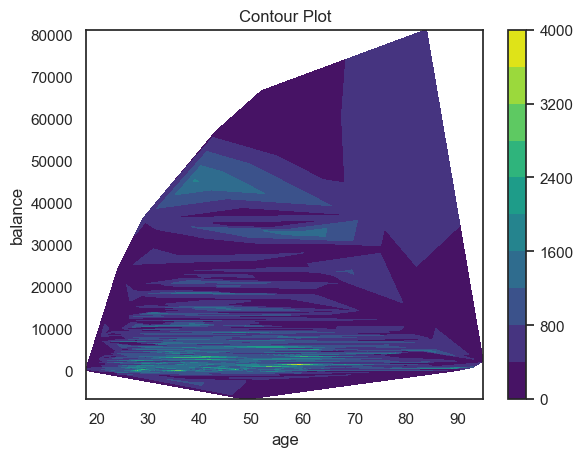

In [866]:
x_column = 'age'
y_column = 'balance'
z_column = 'duration'

plot_tricontourf(df[x_column], df[y_column],df[z_column], cmap='viridis', xlabel= x_column, ylabel=y_column)

# plot as function

In [178]:
def custom_plot(data, column, kind='bar',palette='magma' , palette2='viridis', color= None , **kwargs):
    """
    Create a customized plot for the specified column in the dataframe.

    Parameters:
    ----------
    - data: pd.DataFrame - The dataframe containing the data.
    - column: str - The column name to plot.
    - kind: str - The type of plot (default is 'bar').
    - kwargs: dict - Additional keyword arguments for customization.
    
    Examples:
    --------
    >>> custom_plot(data, 'job', kind='bar', title='Job Distribution', xlabel='Job', ylabel='Count', color='purple', annotate=True)
    >>> custom_plot(data_scatter, column='x', kind='scatter', x='x', y='y', title='Scatter Plot Example', xlabel='X-axis', ylabel='Y-axis', color='green')
    
    """

    # Basic setup for the plot
    plt.figure(figsize=kwargs.get('figsize', (10, 6)))
    
    if color is None:
        colors = random.sample(sns.color_palette(palette) + sns.color_palette(palette2), 12)
    else:
        colors = [color]
    
    # Plot types and their customizations
    if kind == 'bar':
        ax = data[column].value_counts().plot(kind='bar', color=kwargs.get('color', colors[0]), edgecolor='black')
        plt.title(kwargs.get('title', 'Bar Plot'))
        plt.xlabel(kwargs.get('xlabel', column))
        plt.ylabel(kwargs.get('ylabel', 'Count'))
        plt.xticks(rotation=kwargs.get('rotation', 45))
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        if kwargs.get('annotate', True):
            for p in ax.patches:
                ax.annotate(str(p.get_height()), (p.get_x() * 1.005, p.get_height() * 1.005))

    elif kind == 'barh':
        ax = data[column].value_counts().plot(kind='barh', color=kwargs.get('color', colors[0]), edgecolor='black')
        plt.title(kwargs.get('title', 'Horizontal Bar Plot'))
        plt.xlabel(kwargs.get('xlabel', 'Count'))
        plt.ylabel(kwargs.get('ylabel', column))
        plt.grid(axis='x', linestyle='--', alpha=0.7)
        if kwargs.get('annotate', True):
            for p in ax.patches:
                ax.annotate(str(p.get_width()), (p.get_width() * 1.005, p.get_y() * 1.005))

    elif kind == 'line':
        data[column].value_counts().sort_index().plot(kind='line', color=kwargs.get('color', colors[0]))
        plt.title(kwargs.get('title', 'Line Plot'))
        plt.xlabel(kwargs.get('xlabel', column))
        plt.ylabel(kwargs.get('ylabel', 'Count'))
        plt.grid(True)

    elif kind == 'hist':
        data[column].plot(kind='hist', color=kwargs.get('color', colors[0]), edgecolor='black')
        plt.title(kwargs.get('title', 'Histogram'))
        plt.xlabel(kwargs.get('xlabel', column))
        plt.ylabel(kwargs.get('ylabel', 'Frequency'))
        plt.grid(axis='y', linestyle='--', alpha=0.7)

    elif kind == 'box':
        sns.boxplot(x=data[column], color=kwargs.get('color', colors[0]))
        plt.title(kwargs.get('title', 'Box Plot'))
        plt.xlabel(kwargs.get('xlabel', column))
        plt.grid(axis='y', linestyle='--', alpha=0.7)

    elif kind == 'kde' or kind == 'density':
        data[column].plot(kind='kde', color=kwargs.get('color', colors[0]))
        plt.title(kwargs.get('title', 'Kernel Density Estimate'))
        plt.xlabel(kwargs.get('xlabel', column))
        plt.grid(True)

    elif kind == 'area':
        data[column].value_counts().sort_index().plot(kind='area', color=kwargs.get('color', colors[0]))
        plt.title(kwargs.get('title', 'Area Plot'))
        plt.xlabel(kwargs.get('xlabel', column))
        plt.ylabel(kwargs.get('ylabel', 'Count'))
        plt.grid(True)

    elif kind == 'pie':
        data[column].value_counts().plot(kind='pie', colors=kwargs.get('colors', None), autopct='%1.1f%%')
        plt.title(kwargs.get('title', 'Pie Chart'))
        plt.ylabel('')

    elif kind == 'scatter':
        if 'x' in kwargs and 'y' in kwargs:
            data.plot(kind='scatter', x=kwargs['x'], y=kwargs['y'], color=kwargs.get('color', colors[0]))
            plt.title(kwargs.get('title', 'Scatter Plot'))
            plt.xlabel(kwargs.get('xlabel', kwargs['x']))
            plt.ylabel(kwargs.get('ylabel', kwargs['y']))
            plt.grid(True)
        else:
            raise ValueError("Scatter plot requires 'x' and 'y' parameters")

    elif kind == 'hexbin':
        if 'x' in kwargs and 'y' in kwargs:
            data.plot(kind='hexbin', x=kwargs['x'], y=kwargs['y'], gridsize=kwargs.get('gridsize', 30), cmap=kwargs.get('cmap', 'Blues'))
            plt.title(kwargs.get('title', 'Hexbin Plot'))
            plt.xlabel(kwargs.get('xlabel', kwargs['x']))
            plt.ylabel(kwargs.get('ylabel', kwargs['y']))
            plt.colorbar(label='Count')
        else:
            raise ValueError("Hexbin plot requires 'x' and 'y' parameters")

    else:
        raise ValueError(f"Plot kind '{kind}' is not supported")

    plt.show()



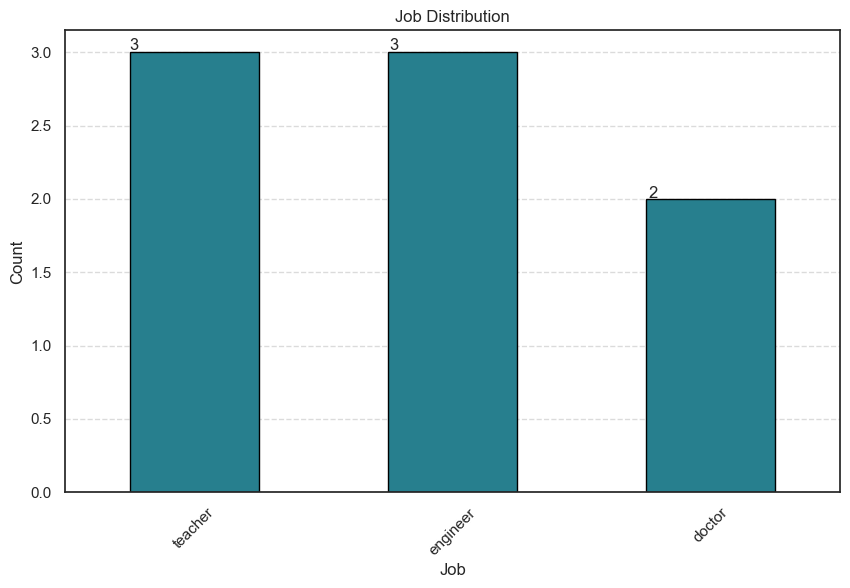

In [185]:
# Example usage
data = pd.DataFrame({
    'job': ['teacher', 'engineer', 'teacher', 'doctor', 'engineer', 'engineer', 'doctor', 'teacher']
})

# Bar plot example
custom_plot(data, 'job', kind='bar', title='Job Distribution', xlabel='Job', ylabel='Count', annotate=True)

<Figure size 1000x600 with 0 Axes>

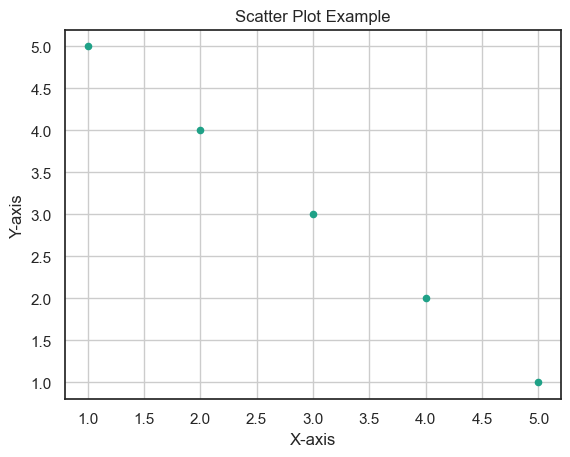

In [187]:
# Scatter plot example
data_scatter = pd.DataFrame({
    'x': [1, 2, 3, 4, 5],
    'y': [5, 4, 3, 2, 1]
})
custom_plot(data_scatter, column='x', kind='scatter', x='x', y='y', title='Scatter Plot Example', xlabel='X-axis', ylabel='Y-axis')